# Goal
Model the price of cars with the available independent variables (car features, manufacturer), so that the management understands how exactly the prices vary with the independent variables. 

# Approach   

##### Perform Exploratory Data Analsyis 
    Data verification, cleanup, deriving new columns
    Cap Outliers
    Deal with numerical continuous data
    Deal with categorical data   
    Perform train - test split
    Scale data
    Perform multiple linear regression (manually & using RFE)
    Residual Analysis
    Test model derived from training data on test data
    Residual analysis on test data
    Derive Final Car Pricing Model

###### Import the required libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.preprocessing import OneHotEncoder

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 210)

## Step 1: 
1. Reading and Understanding the Data
2. Perform Exploratory Data Analysis

In [2]:
carprice=pd.read_csv('CarPrice_Assignment.csv')
carprice.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [3]:
carprice.describe()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,103.000000,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,59.322565,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,1.000000,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,52.000000,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,103.000000,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,154.000000,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,205.000000,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


###### Check for duplicates data rows, NULL values

In [4]:
carprice.loc[carprice.duplicated()]

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price


In [5]:
carprice.isnull().values.any()

False

###### There are no null columns with NULL / NaaN values & duplicate rows, we will proceed further

###### Rename Columns
car_ID => Car_ID
symboling => Symboling
CarName => Car_Name
fueltype => Fuel_Type
aspiration => Aspiration
doornumber => Num_Of_Doors
carbody => Car_Body_Type
drivewheel => Drive_Wheel_Type
enginelocation => Engine_Location
wheelbase => Wheel_Base
carlength => Car_Length
carwidth => Car_Width
carheight => Car_Height
curbweight => Curb_Weight
enginesize => Engine_Size
enginetype => Engine_Type
cylindernum => Number_Of_Cylinders
fuelsystem => Fuel_System
boreratio => Bore_Ratio
stroke => Strokes
horsepower => Horse_Power
peakrpm => Peak_RPM
citympg => Mileage_City
highwaympg => Mileage_Highway
price => Price

In [6]:
carprice.rename(columns={'car_ID': 'Car_ID', 'symboling': 'Symboling', 'fueltype': 'Fuel_Type', 
                         'aspiration': 'Aspiration', 'doornumber': 'Num_Of_Doors', 'carbody': 'Car_Body_Type', 
                         'drivewheel': 'Drive_Wheel_Type', 'enginelocation': 'Engine_Location',
                         'wheelbase': 'Wheel_Base', 'carlength': 'Car_Length', 'carwidth': 'Car_Width',
                         'carheight': 'Car_Height', 'curbweight': 'Curb_Weight', 'enginetype': 'Engine_Type',
                         'cylindernumber': 'Number_Of_Cylinders', 'enginesize': 'Engine_Size',
                         'fuelsystem': 'Fuel_System', 'boreratio': 'Bore_Ratio', 'stroke': 'Strokes',
                         'compressionratio': 'Compression_Ratio', 'horsepower': 'Horse_Power', 
                         'peakrpm': 'Peak_RPM', 'citympg': 'Mileage_City', 'highwaympg': 'Mileage_Highway', 
                         'price': 'Price'
                        }, inplace=True)

In [7]:
carprice.head()

,Car_ID,Symboling,CarName,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


#### Drop Column Car_ID, has no bearing on Analysis

In [8]:
carprice.drop(columns=['Car_ID'], inplace=True)

#### The CarName column has two parts
     1. Manufacturer Name
     2. Model
We will extract the model name out (as instructed) and only retain the manufacturer (Brand)
We will then:
     1. Standardize the brand column data in title case
     2. Rename the "CarName" column to "Brand"

In [9]:
carprice['CarName'] = carprice['CarName'].str.split().str[0].str.strip()
carprice['CarName'] = carprice['CarName'].str.title()
carprice.rename(columns={'CarName': 'Brand'}, inplace=True)
carprice.head()

,Symboling,Brand,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
0,3,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,3,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,1,Alfa-Romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,2,Audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,2,Audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [10]:
print(carprice.Brand.value_counts())

Toyota         31
Nissan         18
Mazda          15
Mitsubishi     13
Honda          13
Subaru         12
Volvo          11
Peugeot        11
Volkswagen      9
Dodge           9
Bmw             8
Buick           8
Plymouth        7
Audi            7
Saab            6
Isuzu           4
Porsche         4
Jaguar          3
Chevrolet       3
Alfa-Romero     3
Renault         2
Vw              2
Maxda           2
Mercury         1
Porcshce        1
Vokswagen       1
Toyouta         1
Name: Brand, dtype: int64


###### New column "Brand" has been derived from exisitng column CarName. This column will now play a major part in the analysis

###### Fix data quaity issues for "Brand" column
- "Maxda" & "Mazda" are the same brand. Replace "Maxda" with "Mazda".
- "Porcshce" & "Porsche" are the same brand. Replace "Porcshce" with "Porsche".
- "Toyota" and "Toyouta" are the same brand. Replace "Toyouta" with "Toyota"
- "Vokswagen", "Volkswagen" & "VW" are the same brand. Replace "VW" and "Vokswagen" with "Volkswagen".
- Rename "Bmw" to "BMW"

In [11]:
carprice["Brand"]=carprice["Brand"].replace(regex=['Maxda'], value='Mazda') 
carprice["Brand"]=carprice["Brand"].replace(regex=['Porcshce'], value='Porsche') 
carprice["Brand"]=carprice["Brand"].replace(regex=['Toyouta'], value='Toyota') 
carprice["Brand"]=carprice["Brand"].replace(regex=['Vokswagen'], value='Volkswagen') 
carprice["Brand"]=carprice["Brand"].replace(regex=['Vw'], value='Volkswagen') 
carprice["Brand"]=carprice["Brand"].replace(regex=['Bmw'], value='BMW')

In [12]:
print(carprice.Brand.value_counts())

Toyota         32
Nissan         18
Mazda          17
Mitsubishi     13
Honda          13
Subaru         12
Volkswagen     12
Volvo          11
Peugeot        11
Dodge           9
BMW             8
Buick           8
Audi            7
Plymouth        7
Saab            6
Porsche         5
Isuzu           4
Chevrolet       3
Jaguar          3
Alfa-Romero     3
Renault         2
Mercury         1
Name: Brand, dtype: int64


###### Check Car Pricing Range

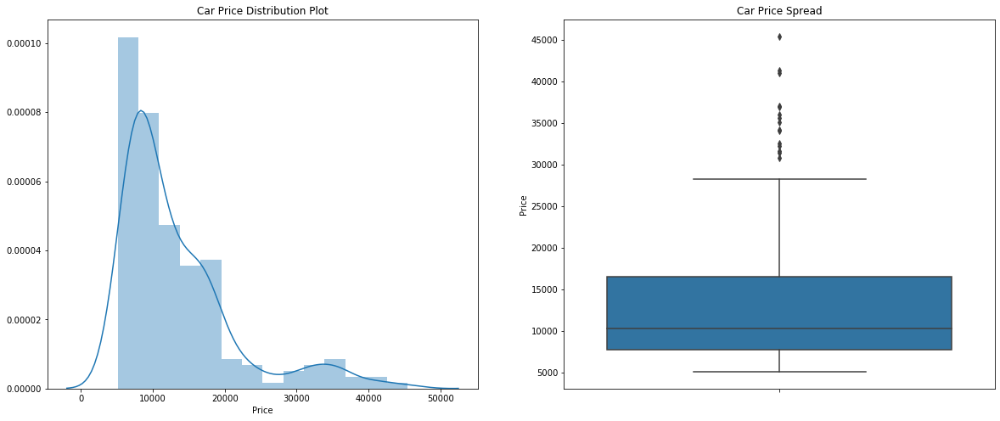

In [13]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Car Price Distribution Plot')
sns.distplot(carprice.Price)

plt.subplot(1,2,2)
plt.title('Car Price Spread')
sns.boxplot(y=carprice.Price)

plt.show()

In [14]:
round(carprice['Price'].mean(), 0)

13277.0

In [15]:
carprice['Price'].describe()

count      205.000000
mean     13276.710571
std       7988.852332
min       5118.000000
25%       7788.000000
50%      10295.000000
75%      16503.000000
max      45400.000000
Name: Price, dtype: float64

###### Capping Outliers: We will now cap the outliers at 0.01 percentile and 99 percentile (except for sybmoling column which has a range of -3 to +3 and will be normalized later on)

In [16]:
def cap_df(df):
    for col in df.columns:
        if(((df[col].dtype)=='int64') | ((df[col].dtype)=='float64')):
            print("Capping the column: ", col)
            percentiles=df[col].quantile([0.01, 0.99]).values
            df[col][df[col] <= percentiles[0]] = percentiles[0]
            df[col][df[col] >= percentiles[1]] = percentiles[1]
        else:
            carprice[col]=carprice[col]
    return df

In [17]:
carprice_new=cap_df(carprice)

Capping the column:  Symboling
Capping the column:  Wheel_Base
Capping the column:  Car_Length
Capping the column:  Car_Width
Capping the column:  Car_Height
Capping the column:  Curb_Weight
Capping the column:  Engine_Size
Capping the column:  Bore_Ratio
Capping the column:  Strokes
Capping the column:  Compression_Ratio
Capping the column:  Horse_Power
Capping the column:  Peak_RPM
Capping the column:  Mileage_City
Capping the column:  Mileage_Highway
Capping the column:  Price


In [18]:
carprice_new.describe()

,Symboling,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834732,98.747590,174.040917,65.918088,53.723278,2556.547122,126.797463,3.331317,3.253465,10.142537,103.474927,5119.268293,25.191610,30.725659,13251.698473
std,1.243977,5.900965,12.213243,2.102825,2.415691,513.768384,40.884682,0.261670,0.304427,3.972040,37.105975,462.232383,6.422415,6.753931,7892.003430
min,-1.960000,88.408000,144.816000,62.536000,48.824000,1819.720000,70.000000,2.910000,2.196800,7.000000,52.120000,4150.000000,14.040000,17.040000,5201.120000
25%,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,3.000000,115.544000,202.480000,71.700000,59.100000,3948.000000,302.160000,3.800000,3.900000,23.000000,207.000000,6000.000000,44.720000,49.880000,40802.720000


In [19]:
carprice_new.head()

,Symboling,Brand,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
0,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0
1,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0
2,1.0,Alfa-Romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0
3,2.0,Audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0
4,2.0,Audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0


In [20]:
carprice_new['Symboling']=carprice['Symboling']
carprice=carprice_new
del carprice_new
carprice.head()

,Symboling,Brand,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
0,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0
1,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0
2,1.0,Alfa-Romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0
3,2.0,Audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0
4,2.0,Audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0


In [21]:
carprice.describe()

,Symboling,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834732,98.747590,174.040917,65.918088,53.723278,2556.547122,126.797463,3.331317,3.253465,10.142537,103.474927,5119.268293,25.191610,30.725659,13251.698473
std,1.243977,5.900965,12.213243,2.102825,2.415691,513.768384,40.884682,0.261670,0.304427,3.972040,37.105975,462.232383,6.422415,6.753931,7892.003430
min,-1.960000,88.408000,144.816000,62.536000,48.824000,1819.720000,70.000000,2.910000,2.196800,7.000000,52.120000,4150.000000,14.040000,17.040000,5201.120000
25%,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,3.000000,115.544000,202.480000,71.700000,59.100000,3948.000000,302.160000,3.800000,3.900000,23.000000,207.000000,6000.000000,44.720000,49.880000,40802.720000


###### Check Car Pricing Range After Capping Outliers

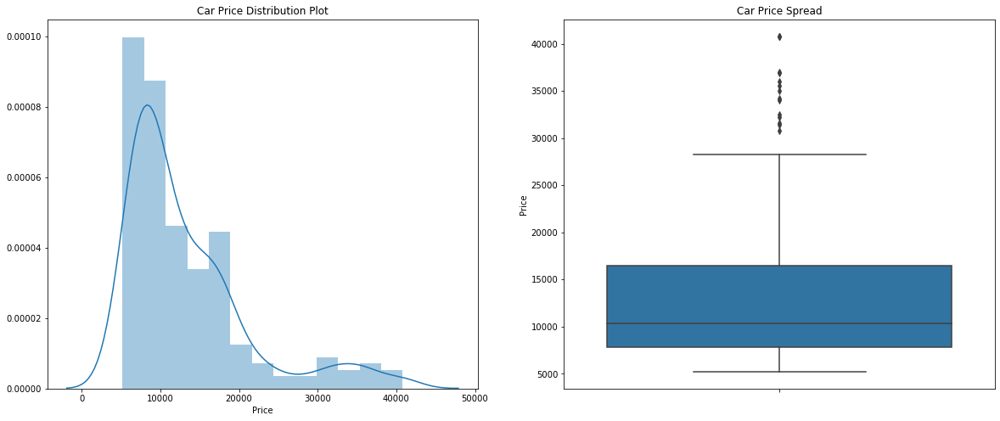

In [22]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
plt.title('Car Price Distribution Plot')
sns.distplot(carprice.Price)

plt.subplot(1,2,2)
plt.title('Car Price Spread')
sns.boxplot(y=carprice.Price)

plt.show()

In [23]:
carprice['Price'].describe()

count      205.000000
mean     13251.698473
std       7892.003430
min       5201.120000
25%       7788.000000
50%      10295.000000
75%      16503.000000
max      40802.720000
Name: Price, dtype: float64

###### Original data had a car pricing range of USD 5,118 to USD 45,400 . New dataset has car pricing range from USD 5,201 to USD 40,803

###### As we can see, the car pricing data provided has a mean of USD 13,252 with an IQR of USD: 8,715 (Q3 - Q1), median of USD ~10,295

###### Derive New Column:  Pricing_Model (Budget, Mid-Segment, Premium)
    Budget Cars: Upto USD 15,000
    Mid-Segment Cars: Between USD 15,001 & USD 25,000
    Premium Cars: More then USD 25,000

In [24]:
n = carprice['Price'].max()
x=pd.cut(carprice['Price'], bins=[0, 15000, 25000, n], include_lowest=True, labels=['Budget', 'Mid-Segment', 'Premium'])
x.head()

0         Budget
1    Mid-Segment
2    Mid-Segment
3         Budget
4    Mid-Segment
Name: Price, dtype: category
Categories (3, object): [Budget < Mid-Segment < Premium]

In [25]:
carprice.insert(25, 'Pricing_Model', x)
carprice.head()

,Symboling,Brand,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price,Pricing_Model
0,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0,Budget
1,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0,Mid-Segment
2,1.0,Alfa-Romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0,Mid-Segment
3,2.0,Audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0,Budget
4,2.0,Audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0,Mid-Segment


## Step2: Data Visualization

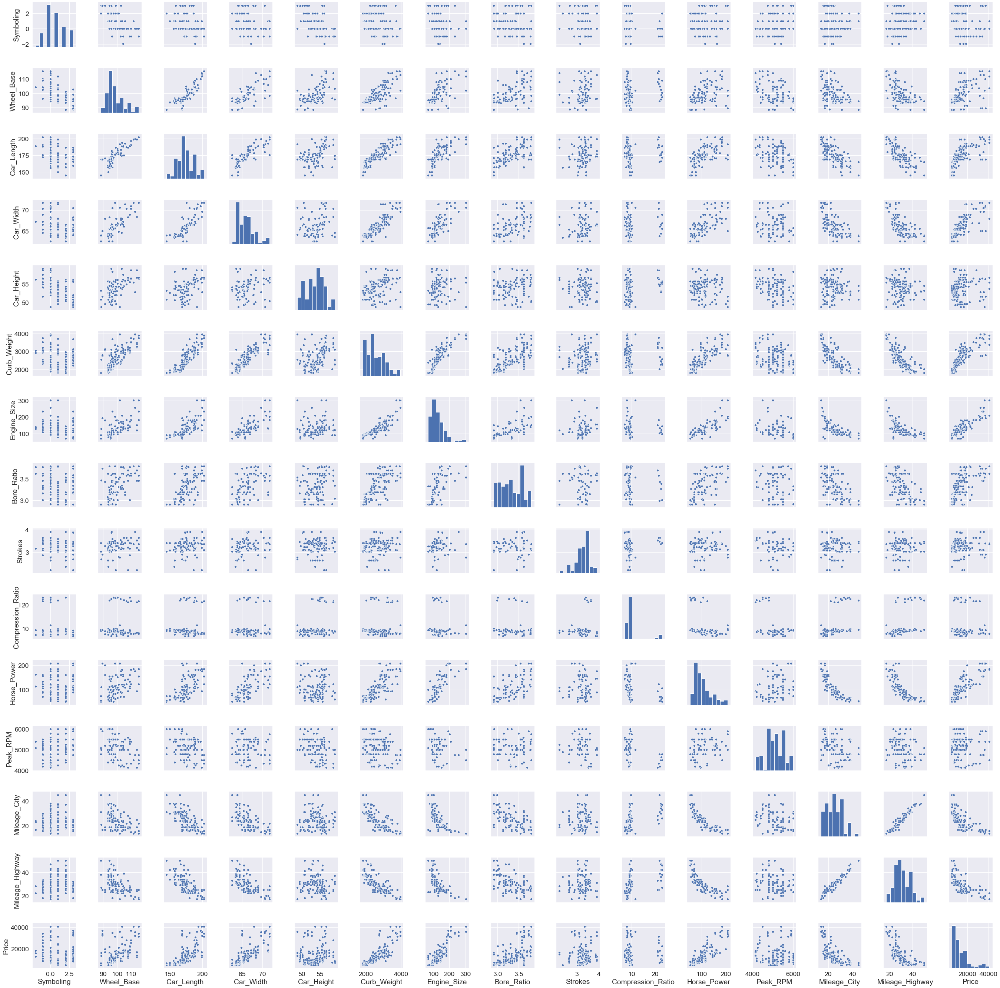

In [26]:
sns.set(font_scale=1.60)
sns.pairplot(carprice)
plt.show()

From the raw data visualization above, we note the following:

1. Car price has positive linear relation with 
    a. Engine specifications: engine size, bore ratio, horsepower 
    b. Car dimensions (height, width, length) & weight
2. Car price has negative linear relation with mileage (highway & city)

###### Next, we will plot car price relationship with other categorical variables: 
     - Fuel Type, Aspiration, Number of Doors, Car Body Type, Drive Wheel Type, 
     - Engine Location, Engine Size, Number of Cylinders, Fuel System

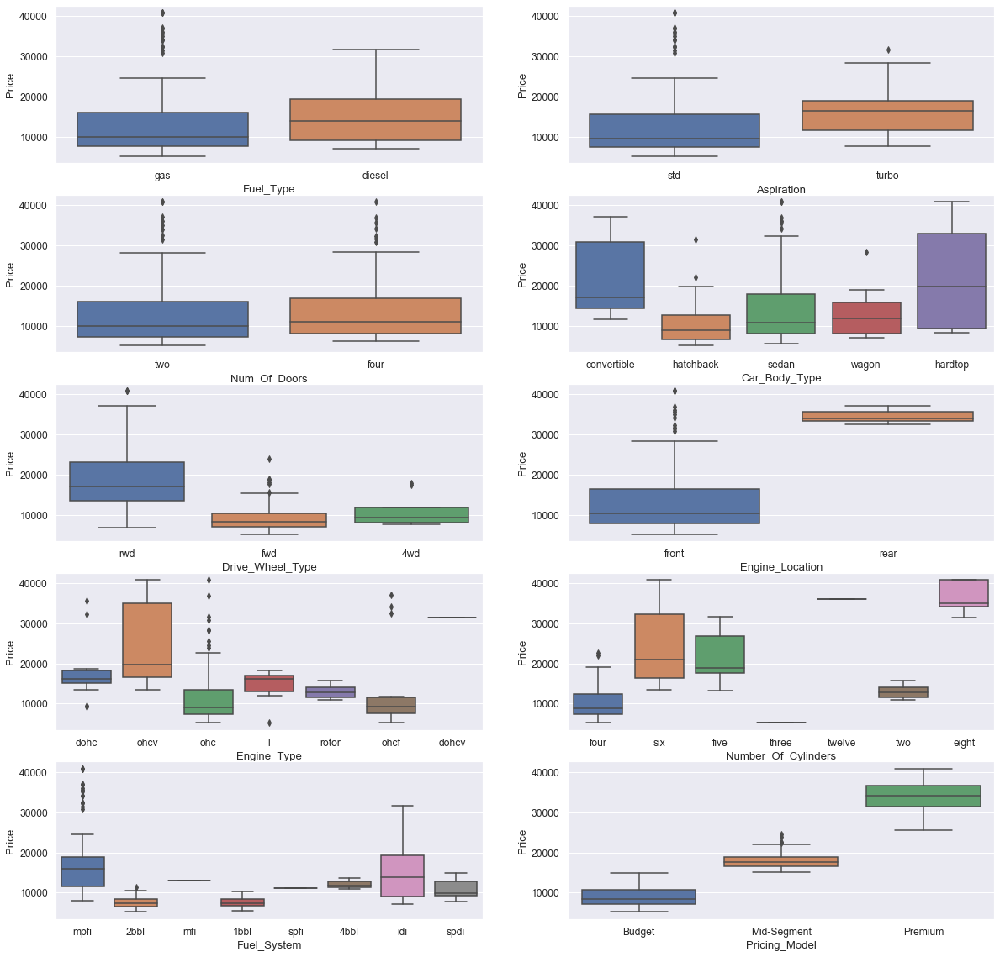

In [27]:
sns.set(font_scale=1.10)
plt.figure(figsize=(20, 20))
plt.subplot(5,2,1)
sns.boxplot(x = 'Fuel_Type', y = 'Price', data = carprice)
plt.subplot(5,2,2)
sns.boxplot(x = 'Aspiration', y = 'Price', data = carprice)
plt.subplot(5,2,3)
sns.boxplot(x = 'Num_Of_Doors', y = 'Price', data = carprice)
plt.subplot(5,2,4)
sns.boxplot(x = 'Car_Body_Type', y = 'Price', data = carprice)
plt.subplot(5,2,5)
sns.boxplot(x = 'Drive_Wheel_Type', y = 'Price', data = carprice)
plt.subplot(5,2,6)
sns.boxplot(x = 'Engine_Location', y = 'Price', data = carprice)
plt.subplot(5,2,7)
sns.boxplot(x = 'Engine_Type', y = 'Price', data = carprice)
plt.subplot(5,2,8)
sns.boxplot(x = 'Number_Of_Cylinders', y = 'Price', data = carprice)
plt.subplot(5,2,9)
sns.boxplot(x = 'Fuel_System', y = 'Price', data = carprice)
plt.subplot(5,2,10)
sns.boxplot(x = 'Pricing_Model', y = 'Price', data = carprice)
plt.show()

#### From the above figure, we note the following (based on  difference IQR & median values):
    1. Significant pricing difference for cars that are
        a. Fuel type gas (petrol) compared to diesel
        b. Aspiration type turbo compared to standard
        c. Engine location in rear compared to front
        d. Body types: Convertible and hardtops, compared to sedans, wagons and hatch-backs.
        e. Drive types: front wheel driven compared to rear, 4 wheel driven cars
        f. Fuel systems: mpfi, idi, spdi compared to the reset
        g. Number of cylinders
        h. Engine types
        i. Budget, mid-segment & premium cars
    2. There is no significant difference in pricing for two door, four door cars       

###### Finally, we will plot car price relationship with Brand & Pricing Model

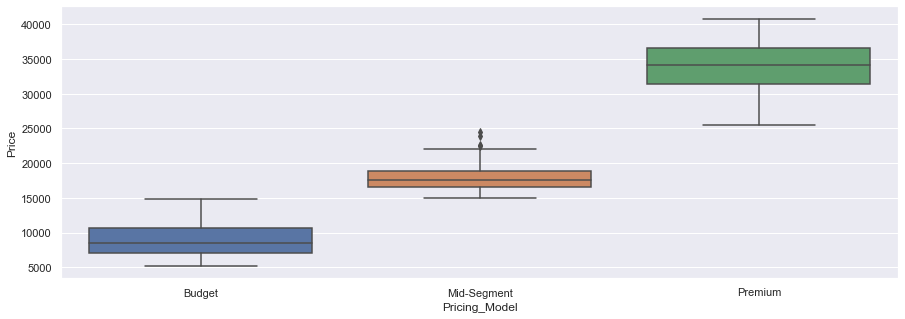

In [28]:
sns.set(font_scale=1.00)
plt.figure(figsize=(15, 5))
sns.boxplot(x = 'Pricing_Model', y = 'Price', data = carprice)
plt.show()

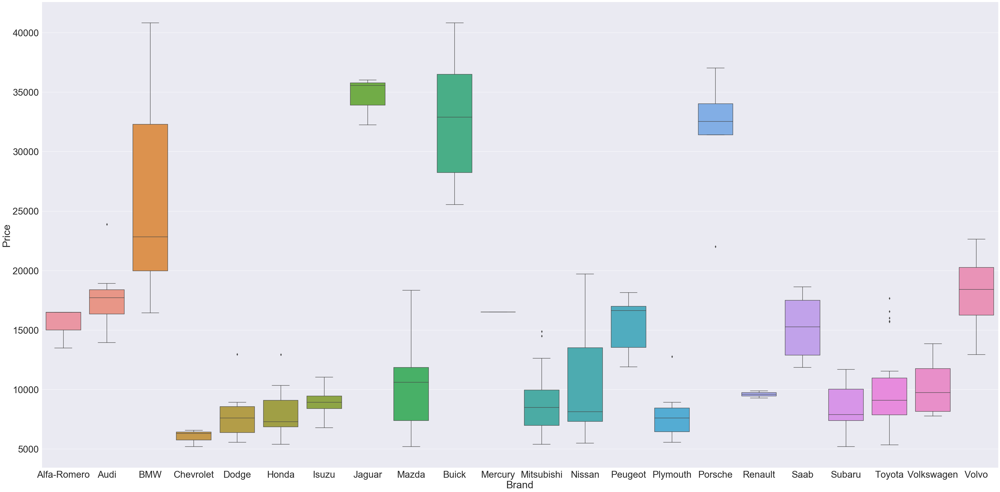

In [29]:
sns.set(font_scale=3.00)
plt.figure(figsize=(60, 30))
sns.boxplot(x = 'Brand', y = 'Price', data = carprice)
plt.show()

###### Car brands that have significantly higher pricing:
    - Alfa-Romero
    - Audi
    - BMW
    - Jaguar
    - Buick
    - Peugeot
    - Porsche
    - Saab

###### Delete columns 'Brand' and 'Pricing_Model'. Column 'Brand' has no direct impact on analysis and 'Pricing_Model' is derived from 'Price' which is the column to be predicted.

In [30]:
carprice.head()

,Symboling,Brand,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price,Pricing_Model
0,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0,Budget
1,3.0,Alfa-Romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0,Mid-Segment
2,1.0,Alfa-Romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0,Mid-Segment
3,2.0,Audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0,Budget
4,2.0,Audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0,Mid-Segment


In [31]:
carprice.drop(columns = ['Brand', 'Pricing_Model'], inplace = True)
carprice.head()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
0,3.0,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0
1,3.0,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0
2,1.0,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0
3,2.0,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0
4,2.0,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0


###### Standardize Values for Columns with Binary Data 

In [32]:
print(carprice.Fuel_Type.value_counts())
print(carprice.Aspiration.value_counts())
print(carprice.Num_Of_Doors.value_counts())
print(carprice.Car_Body_Type.value_counts())
print(carprice.Drive_Wheel_Type.value_counts())
print(carprice.Engine_Location.value_counts())
print(carprice.Engine_Type.value_counts())
print(carprice.Number_Of_Cylinders.value_counts())
print(carprice.Fuel_System.value_counts())

gas       185
diesel     20
Name: Fuel_Type, dtype: int64
std      168
turbo     37
Name: Aspiration, dtype: int64
four    115
two      90
Name: Num_Of_Doors, dtype: int64
sedan          96
hatchback      70
wagon          25
hardtop         8
convertible     6
Name: Car_Body_Type, dtype: int64
fwd    120
rwd     76
4wd      9
Name: Drive_Wheel_Type, dtype: int64
front    202
rear       3
Name: Engine_Location, dtype: int64
ohc      148
ohcf      15
ohcv      13
dohc      12
l         12
rotor      4
dohcv      1
Name: Engine_Type, dtype: int64
four      159
six        24
five       11
eight       5
two         4
three       1
twelve      1
Name: Number_Of_Cylinders, dtype: int64
mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
spfi     1
mfi      1
Name: Fuel_System, dtype: int64


#### We can see that the dataset has many columns with values with two values: 
Fuel_Type, Aspiration, Num_Of_Doors, Engine_Location

Hence, we need to convert them to 1s and 0s:
    - Fuel_Type: 1 for gas / petrol, 0 for diesel
    - Engine_Type: 1 for standard, 0 for turbo
    - Num_Doors: 1 for four doors and 0 for two doors
    - Engine_Location: 1 for front, two for rear

In [33]:
var_list=['Fuel_Type', 'Aspiration', 'Num_Of_Doors', 'Engine_Location']
carprice[var_list]=carprice[var_list].apply(lambda x: x.map({'gas':1, 'diesel':0, 'std':1, 'turbo':0, 'four':1, 'two':0, 
                                                             'front':1, 'rear':0
                                                            }))

In [34]:
carprice.head()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price
0,3.0,1,1,0,convertible,rwd,1,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0
1,3.0,1,1,0,convertible,rwd,1,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0
2,1.0,1,1,0,hatchback,rwd,1,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0
3,2.0,1,1,1,sedan,fwd,1,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0
4,2.0,1,1,1,sedan,4wd,1,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0


## Step 3: Data Preparation (Handle Categorical Values)

#### Dummy Variables: Handling Categorical Values Column - Drive_Wheel_Type

In [35]:
print(carprice.Drive_Wheel_Type.value_counts())

fwd    120
rwd     76
4wd      9
Name: Drive_Wheel_Type, dtype: int64


In [36]:
var1=pd.get_dummies(carprice['Drive_Wheel_Type'])
var1.head()

,4wd,fwd,rwd
0,0,0,1
1,0,0,1
2,0,0,1
3,0,1,0
4,1,0,0


Now, we don't need three columns. We can drop the 4wd column, as the type of wheel driven can be identified with just the last two columns where —
    - 00 will correspond to 4wd
    - 01 will correspond to rwd
    - 10 will correspond to fwd

In [37]:
var1 = pd.get_dummies(carprice['Drive_Wheel_Type'], drop_first = True)
var1.head()

,fwd,rwd
0,0,1
1,0,1
2,0,1
3,1,0
4,0,0


In [38]:
var1.rename(columns={'fwd': 'Four_Wheel_Driven', 'rwd': 'Rear Wheel Driven'}, inplace=True)
carprice = pd.concat([carprice, var1], axis = 1)
carprice.head()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Car_Body_Type,Drive_Wheel_Type,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price,Four_Wheel_Driven,Rear Wheel Driven
0,3.0,1,1,0,convertible,rwd,1,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0,0,1
1,3.0,1,1,0,convertible,rwd,1,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0,0,1
2,1.0,1,1,0,hatchback,rwd,1,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0,0,1
3,2.0,1,1,1,sedan,fwd,1,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0,1,0
4,2.0,1,1,1,sedan,4wd,1,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0,0,0


In [39]:
carprice.drop(columns=['Drive_Wheel_Type'], inplace=True)

#### Dummy Variables: Handling Categorical Values Column - Car_Body_Type

In [40]:
var1=pd.get_dummies(carprice['Car_Body_Type'])
var1.head()

,convertible,hardtop,hatchback,sedan,wagon
0,1,0,0,0,0
1,1,0,0,0,0
2,0,0,1,0,0
3,0,0,0,1,0
4,0,0,0,1,0


Now, we don't need five columns. We can drop the convertible column, as the type of body driven can be identified with just the four columns where —
    - 0000 will correspond to convertible
    - 1000 will correspond to hardtop
    - 0100 will correspond to hatchback
    - 0010 will correspond to sedan
    - 0001 will correpsond to wagon

In [41]:
var1 = pd.get_dummies(carprice['Car_Body_Type'], drop_first = True)
var1.head()

,hardtop,hatchback,sedan,wagon
0,0,0,0,0
1,0,0,0,0
2,0,1,0,0
3,0,0,1,0
4,0,0,1,0


In [42]:
var1.rename(columns={'hardtop': 'Hard_Top', 'hatchback': 'Hatch_Back', 'wagon': 'WAGON', 'sedan': 'SEDAN'}, inplace=True)
carprice = pd.concat([carprice, var1], axis = 1)
carprice.drop(columns=['Car_Body_Type'], inplace=True)
carprice.head()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Type,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON
0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0,0,1,0,0,0,0
1,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,dohc,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0,0,1,0,0,0,0
2,1.0,1,1,0,1,94.5,171.2,65.5,52.400,2823.0,ohcv,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0,0,1,0,1,0,0
3,2.0,1,1,1,1,99.8,176.6,66.2,54.300,2337.0,ohc,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0,1,0,0,0,1,0
4,2.0,1,1,1,1,99.4,176.6,66.4,54.300,2824.0,ohc,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0,0,0,0,0,1,0


#### Dummy Variables: Handling Categorical Values Column - Engine_Type

In [43]:
var1=pd.get_dummies(carprice['Engine_Type'])
var1.head()

,dohc,dohcv,l,ohc,ohcf,ohcv,rotor
0,1,0,0,0,0,0,0
1,1,0,0,0,0,0,0
2,0,0,0,0,0,1,0
3,0,0,0,1,0,0,0
4,0,0,0,1,0,0,0


Now, we don't need seven columns. We can drop the dohc column, as the type of body driven can be identified with just the six columns where —
    - 000000 will correspond to DOHC engine
    - 100000 will correspond to DOHCV engine
    - 000010 will correspond to OHCV engine
    - 001000 will correspond to OHC engine
    - 010000 will correpsond to Inline engine
    - 000100 will correspond to OHCF engine
    - 000001 will correspond to Rotor engine

In [44]:
var1=pd.get_dummies(carprice['Engine_Type'], drop_first=True)
var1.head()

,dohcv,l,ohc,ohcf,ohcv,rotor
0,0,0,0,0,0,0
1,0,0,0,0,0,0
2,0,0,0,0,1,0
3,0,0,1,0,0,0
4,0,0,1,0,0,0


In [45]:
var1.rename(columns={'dohcv': 'Engine_Type_DOHCV', 'l': 'Engine_Type_L_Head', 'ohc': 'Engine_Type_OHC', 'ohcv': 'Engine_Type_OHCV', 'ohcf': 'Engine_Type_OHCF', 'rotor': 'Engine_Type_Rotor', 'dohc': 'DOHC'}, inplace=True)
carprice = pd.concat([carprice, var1], axis = 1)
carprice.drop(columns=['Engine_Type'], inplace=True)
carprice.head()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Number_Of_Cylinders,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor
0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0,0,1,0,0,0,0,0,0,0,0,0,0
1,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,four,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0,0,1,0,0,0,0,0,0,0,0,0,0
2,1.0,1,1,0,1,94.5,171.2,65.5,52.400,2823.0,six,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0,0,1,0,1,0,0,0,0,0,0,1,0
3,2.0,1,1,1,1,99.8,176.6,66.2,54.300,2337.0,four,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0,1,0,0,0,1,0,0,0,1,0,0,0
4,2.0,1,1,1,1,99.4,176.6,66.4,54.300,2824.0,five,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0,0,0,0,0,1,0,0,0,1,0,0,0


###### Dummy Variables: Handling Categorical Values Column - Num_Of_Cylinders

In [46]:
var1=pd.get_dummies(carprice['Number_Of_Cylinders'])
var1.head()

,eight,five,four,six,three,twelve,two
0,0,0,1,0,0,0,0
1,0,0,1,0,0,0,0
2,0,0,0,1,0,0,0
3,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0


Now, we don't need seven columns. We can drop the 8 Cylinder Engine column, as the type of body driven can be identified with just the six columns where —
    - 000000 will correspond to  8 cylinder engine
    - 100000 will correspond to  5 cylinder engine
    - 010000 will correspond to  4 cylinder engine
    - 001000 will correpsond to  6 cylinder engine
    - 000100 will correspond to  3 cylinder engine
    - 000010 will correspond to 12 cylinder engine
    - 000001 will correspond to  2 cylinder engine

In [47]:
var1=pd.get_dummies(carprice['Number_Of_Cylinders'], drop_first=True)
var1.head()

,five,four,six,three,twelve,two
0,0,1,0,0,0,0
1,0,1,0,0,0,0
2,0,0,1,0,0,0
3,0,1,0,0,0,0
4,1,0,0,0,0,0


In [48]:
var1.rename(columns={'five': '5_Cylinder_Engine', 'four': '4_Cylinder_Engine', 'six': '6_Cylinder_Engine', 'three': '3_Cylinder_Engine', 'twelve': '12_Cylinder_Engine', 'two': '2_Cylinder_Engine'}, inplace=True)
carprice = pd.concat([carprice, var1], axis = 1)
carprice.drop(columns=['Number_Of_Cylinders'], inplace=True)
carprice.head()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Fuel_System,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine
0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,mpfi,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,1.0,1,1,0,1,94.5,171.2,65.5,52.400,2823.0,152.0,mpfi,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0
3,2.0,1,1,1,1,99.8,176.6,66.2,54.300,2337.0,109.0,mpfi,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0
4,2.0,1,1,1,1,99.4,176.6,66.4,54.300,2824.0,136.0,mpfi,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0


###### Dummy Variables: Handling Categorical Values Column - Fuel_System

In [49]:
carprice['Fuel_System'].value_counts()

mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
spfi     1
mfi      1
Name: Fuel_System, dtype: int64

###### Drop rows with fuel system: mfi and spfi, as there is only 1 row.

In [50]:
carprice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 38 columns):
Symboling             205 non-null float64
Fuel_Type             205 non-null int64
Aspiration            205 non-null int64
Num_Of_Doors          205 non-null int64
Engine_Location       205 non-null int64
Wheel_Base            205 non-null float64
Car_Length            205 non-null float64
Car_Width             205 non-null float64
Car_Height            205 non-null float64
Curb_Weight           205 non-null float64
Engine_Size           205 non-null float64
Fuel_System           205 non-null object
Bore_Ratio            205 non-null float64
Strokes               205 non-null float64
Compression_Ratio     205 non-null float64
Horse_Power           205 non-null float64
Peak_RPM              205 non-null int64
Mileage_City          205 non-null float64
Mileage_Highway       205 non-null float64
Price                 205 non-null float64
Four_Wheel_Driven     205 non-null uint8
Rear 

In [52]:
carprice = carprice.loc[~((carprice['Fuel_System'] == 'mfi') | (carprice['Fuel_System'] == 'spfi'))]
carprice = carprice.reset_index(drop = True)
carprice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 203 entries, 0 to 202
Data columns (total 38 columns):
Symboling             203 non-null float64
Fuel_Type             203 non-null int64
Aspiration            203 non-null int64
Num_Of_Doors          203 non-null int64
Engine_Location       203 non-null int64
Wheel_Base            203 non-null float64
Car_Length            203 non-null float64
Car_Width             203 non-null float64
Car_Height            203 non-null float64
Curb_Weight           203 non-null float64
Engine_Size           203 non-null float64
Fuel_System           203 non-null object
Bore_Ratio            203 non-null float64
Strokes               203 non-null float64
Compression_Ratio     203 non-null float64
Horse_Power           203 non-null float64
Peak_RPM              203 non-null int64
Mileage_City          203 non-null float64
Mileage_Highway       203 non-null float64
Price                 203 non-null float64
Four_Wheel_Driven     203 non-null uint8
Rear 

In [53]:
var1=pd.get_dummies(carprice['Fuel_System'])
var1.head()

,1bbl,2bbl,4bbl,idi,mpfi,spdi
0,0,0,0,0,1,0
1,0,0,0,0,1,0
2,0,0,0,0,1,0
3,0,0,0,0,1,0
4,0,0,0,0,1,0


Now, we don't need nine columns. We can drop the 1bbl column, as the type of body driven can be identified with just the six columns where —
    - 00000 will correspond to 1bbl fuel system
    - 10000 will correspond to 2bbl fuel system
    - 01000 will correspond to 4bbl fuel system
    - 00100 will correpsond to  idi fuel system
    - 00010 will correspond to mpfi fuel system
    - 00001 will correspond to spdi fuel system

In [54]:
var1.rename(columns={'2bbl': '2BBL_Fuel_Type', '4bbl': '4BBL_Fuel_Type', 'idi': 'IDI_Fuel_Type', 'mpfi': 'MPFI_Fuel_Type', 'spdi': 'SPDI_Fuel_Type'}, inplace=True)
carprice = pd.concat([carprice, var1], axis = 1)
carprice.drop(columns=['Fuel_System'], inplace=True)
carprice.head()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Price,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,3.47,2.68,9.0,111.0,5000,21.0,27.0,13495.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,3.47,2.68,9.0,111.0,5000,21.0,27.0,16500.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,1.0,1,1,0,1,94.5,171.2,65.5,52.400,2823.0,152.0,2.91,3.47,9.0,154.0,5000,19.0,26.0,16500.0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
3,2.0,1,1,1,1,99.8,176.6,66.2,54.300,2337.0,109.0,3.19,3.40,10.0,102.0,5500,24.0,30.0,13950.0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,2.0,1,1,1,1,99.4,176.6,66.4,54.300,2824.0,136.0,3.19,3.40,8.0,115.0,5500,18.0,22.0,17450.0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


In [55]:
del var1

###### For better visualization purposes, we will now change the sequence of "Price" column. "Price" will be  the first column in the dataframe (post index)

In [56]:
carprice_price = carprice['Price']
carprice_price.head()

0    13495.0
1    16500.0
2    16500.0
3    13950.0
4    17450.0
Name: Price, dtype: float64

In [57]:
carprice.drop(columns=['Price'], inplace=True)
carprice.insert(0, "Price", carprice_price)
carprice.head()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
0,13495.0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,3.47,2.68,9.0,111.0,5000,21.0,27.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1,16500.0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,3.47,2.68,9.0,111.0,5000,21.0,27.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,16500.0,1.0,1,1,0,1,94.5,171.2,65.5,52.400,2823.0,152.0,2.91,3.47,9.0,154.0,5000,19.0,26.0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
3,13950.0,2.0,1,1,1,1,99.8,176.6,66.2,54.300,2337.0,109.0,3.19,3.40,10.0,102.0,5500,24.0,30.0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,17450.0,2.0,1,1,1,1,99.4,176.6,66.4,54.300,2824.0,136.0,3.19,3.40,8.0,115.0,5500,18.0,22.0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


###### We will also make a copy of the carprice dataframe to carprice_rfe dataframe, which will be used later for analysis using RFE

In [58]:
carprice_rfe = carprice
carprice_rfe_backup = carprice_rfe

In [59]:
carprice.drop(columns=['Price'], inplace=True)
carprice.insert(0, "Price", carprice_price)
carprice.head()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
0,13495.0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,3.47,2.68,9.0,111.0,5000,21.0,27.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1,16500.0,3.0,1,1,0,1,88.6,168.8,64.1,48.824,2548.0,130.0,3.47,2.68,9.0,111.0,5000,21.0,27.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,16500.0,1.0,1,1,0,1,94.5,171.2,65.5,52.400,2823.0,152.0,2.91,3.47,9.0,154.0,5000,19.0,26.0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
3,13950.0,2.0,1,1,1,1,99.8,176.6,66.2,54.300,2337.0,109.0,3.19,3.40,10.0,102.0,5500,24.0,30.0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,17450.0,2.0,1,1,1,1,99.4,176.6,66.4,54.300,2824.0,136.0,3.19,3.40,8.0,115.0,5500,18.0,22.0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


## Step 4: Split The Data in Training & Test Sets

In [60]:
np.random.seed(0)
carprice_train, carprice_test = train_test_split(carprice, train_size = 0.7, test_size = 0.3, random_state = 100)

###### Rescaling the Features Using Normalization
Use Min-Max scaling to scale the following features:
    - Price
    - Symboling
    - Wheel_Base
    - Car_Length
    - Car_Width
    - Car_Height
    - Curb_Weight
    - Engine_Size
    - Bore_Ratio
    - Strokes
    - Compression_Ratio
    - Horse_Power
    - Peak_RPM
    - Mileage_City
    - Mileage_Highway

In [61]:
scaler = MinMaxScaler()
num_vars = ['Price', 'Symboling', 'Wheel_Base', 'Car_Length', 'Car_Width','Car_Height', 'Curb_Weight', 'Engine_Size', 'Bore_Ratio', 'Strokes', 'Horse_Power', 'Peak_RPM', 'Mileage_City', 'Mileage_Highway', 'Compression_Ratio']
carprice_train[num_vars] = scaler.fit_transform(carprice_train[num_vars])
carprice_train.head()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
1,0.317370,1.000000,1,1,0,1,0.007075,0.415927,0.170668,0.000000,0.342192,0.258442,0.629213,0.283701,0.12500,0.380165,0.459459,0.226858,0.303289,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
163,0.115076,0.596774,1,1,0,1,0.224499,0.414193,0.159756,0.367458,0.209221,0.120606,0.370787,0.518553,0.15000,0.386622,1.000000,0.389831,0.364190,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
139,0.054067,0.395161,1,1,1,1,0.323998,0.471421,0.312527,0.357727,0.152837,0.163680,0.797753,0.260216,0.15625,0.192924,0.351351,0.585398,0.607795,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0
136,0.000000,0.798387,1,1,0,1,0.195018,0.209559,0.094282,0.474504,0.108200,0.116299,0.797753,0.095820,0.12500,0.108988,0.405405,0.552803,0.577345,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0
188,0.134232,1.000000,1,1,0,1,0.224499,0.362167,0.159756,0.250681,0.188547,0.167988,0.314607,0.706435,0.09375,0.244576,0.729730,0.324641,0.364190,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [62]:
carprice_train.describe()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
count,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000
mean,0.226139,0.568492,0.908451,0.838028,0.563380,0.985915,0.378316,0.506042,0.366787,0.485381,0.343394,0.240773,0.463523,0.598810,0.193055,0.321845,0.525885,0.359036,0.411367,0.584507,0.352113,0.035211,0.330986,0.471831,0.133803,0.007042,0.070423,0.676056,0.098592,0.063380,0.028169,0.063380,0.746479,0.119718,0.007042,0.007042,0.028169,0.056338,0.359155,0.021127,0.091549,0.443662,0.028169
std,0.229844,0.247641,0.289410,0.369729,0.497722,0.118257,0.223439,0.214063,0.238881,0.241121,0.246980,0.184273,0.293564,0.188662,0.241126,0.236977,0.250961,0.203494,0.200799,0.494551,0.479320,0.184966,0.472234,0.500973,0.341645,0.083918,0.256763,0.469635,0.299168,0.244508,0.166041,0.244508,0.436567,0.325781,0.083918,0.083918,0.166041,0.231390,0.481451,0.144316,0.289410,0.498575,0.166041
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.072297,0.395161,1.000000,1.000000,0.000000,1.000000,0.224499,0.374740,0.159756,0.309070,0.151075,0.116299,0.247191,0.521489,0.095312,0.115444,0.351351,0.161669,0.242387,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.137504,0.596774,1.000000,1.000000,1.000000,1.000000,0.314785,0.478357,0.312527,0.513429,0.276176,0.172295,0.449438,0.630108,0.125000,0.273631,0.567568,0.357236,0.394641,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.312279,0.798387,1.000000,1.000000,1.000000,1.000000,0.464033,0.651776,0.468027,0.656968,0.518156,0.305824,0.752809,0.706435,0.150000,0.412448,0.729730,0.520209,0.516443,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [63]:
carprice_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142 entries, 1 to 8
Data columns (total 43 columns):
Price                 142 non-null float64
Symboling             142 non-null float64
Fuel_Type             142 non-null int64
Aspiration            142 non-null int64
Num_Of_Doors          142 non-null int64
Engine_Location       142 non-null int64
Wheel_Base            142 non-null float64
Car_Length            142 non-null float64
Car_Width             142 non-null float64
Car_Height            142 non-null float64
Curb_Weight           142 non-null float64
Engine_Size           142 non-null float64
Bore_Ratio            142 non-null float64
Strokes               142 non-null float64
Compression_Ratio     142 non-null float64
Horse_Power           142 non-null float64
Peak_RPM              142 non-null float64
Mileage_City          142 non-null float64
Mileage_Highway       142 non-null float64
Four_Wheel_Driven     142 non-null uint8
Rear Wheel Driven     142 non-null uint8
Hard_T

In [64]:
plt.figure(figsize = (250, 250))
sns.set(font_scale=10)
sns.heatmap(carprice_train.corr(), annot = True, cmap="YlGnBu", fmt=".2f", annot_kws={"size": 75})
plt.show()

In [65]:
carprice_train.corr()*100

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
Price,100.000000,-7.367814,-15.036063,-20.954870,-2.193552,-29.354605,55.894008,67.607724,77.915962,7.347210,84.264712,88.325890,53.446264,7.950945,11.662338,83.765413,-11.573905,-70.214591,-71.483253,-61.340958,66.812869,37.708534,-27.219974,12.578130,-7.231595,18.743994,2.704072,-30.203034,-4.749612,43.485175,-0.484483,26.300164,-71.592477,47.247725,-8.315103,23.494424,-0.484483,-15.474397,-53.701972,-1.994560,15.036063,52.044977,-3.472355
Symboling,-7.367814,100.000000,16.312606,9.016426,-64.613851,-20.900321,-51.956008,-34.628707,-22.046980,-51.314236,-21.988631,-10.988435,-12.956333,-1.619877,-15.138290,7.876370,25.967371,-6.324138,1.539500,11.258882,-7.114418,14.676204,44.742595,-37.482503,-29.296565,0.965211,-14.835514,-9.163158,-0.069589,5.342928,29.770932,-8.825942,-6.679291,-2.862733,7.845735,-5.915312,29.770932,-9.676383,-8.209920,25.689473,-16.312606,9.169567,15.861112
Fuel_Type,-15.036063,16.312606,100.000000,52.324090,-18.099356,-3.794266,-37.944337,-30.181540,-31.384521,-33.970066,-29.393050,-10.043221,-7.381988,-27.248989,-98.482713,11.105812,46.963423,-20.521829,-12.954476,12.876410,-17.498097,-7.184208,22.328726,-14.020382,-9.041847,2.673420,-29.438835,-1.102403,10.498708,8.257950,5.404646,-21.809458,3.953022,4.184862,2.673420,2.673420,5.404646,7.756565,23.765186,4.663694,-100.000000,28.348726,5.404646
Aspiration,-20.954870,9.016426,52.324090,100.000000,-7.870816,-5.254621,-30.701155,-27.391171,-34.492443,-11.170673,-35.307293,-12.570456,-18.954335,-23.258055,-43.682085,-21.519417,24.279019,13.909133,21.419501,17.235620,-11.611301,-1.971883,6.550695,-4.395236,-5.179699,3.702379,-17.782480,2.243586,1.715842,3.591111,7.484812,-27.789678,5.136491,4.436770,3.702379,3.702379,7.484812,10.741948,32.912042,6.458678,-52.324090,0.785736,-27.173121
Num_Of_Doors,-2.193552,-64.613851,-18.099356,-7.870816,100.000000,13.576885,42.083523,37.384070,17.049418,54.264152,16.097638,-2.087049,11.383126,-2.535806,16.801428,-14.918449,-25.568904,3.794019,-0.411357,0.689879,-6.448088,-21.700706,-61.793505,49.074650,34.599920,-9.566203,18.680999,2.777717,5.299651,-12.065892,-19.339249,5.417339,13.975217,-2.525769,-9.566203,-9.566203,-19.339249,-3.122441,6.711340,-16.687926,18.099356,-7.124897,-10.757457
Engine_Location,-29.354605,-20.900321,-3.794266,-5.254621,13.576885,100.000000,18.148380,4.952278,4.916172,10.706977,-4.687940,-19.094026,-19.165169,11.821547,1.830807,-34.324804,-20.076663,15.475911,10.093885,14.176337,-16.212870,-62.564253,8.406943,11.296860,4.697591,1.006564,3.289758,17.266634,-36.140316,3.109184,2.034892,3.109184,20.509386,-32.410186,1.006564,1.006564,2.034892,2.920408,8.947782,1.755918,3.794266,-13.384256,2.034892
Wheel_Base,55.894008,-51.956008,-37.944337,-30.701155,42.083523,18.148380,100.000000,87.586900,78.629145,57.816498,76.514294,53.988471,47.808699,15.383390,32.124507,34.180345,-37.668256,-44.686176,-52.708574,-46.505060,52.049894,1.726511,-39.770215,28.772960,20.882912,-0.381879,44.630115,-16.649906,-18.898513,11.805838,-9.507392,26.253226,-27.820233,14.915658,-14.309353,4.636026,-9.507392,-14.297808,-41.973807,-8.203972,37.944337,29.932370,-7.253101
Car_Length,67.607724,-34.628707,-30.181540,-27.391171,37.384070,4.952278,87.586900,100.000000,84.260084,44.972873,86.858752,66.583430,59.127551,12.543453,24.994123,55.039727,-32.989164,-64.624713,-68.717630,-51.695809,56.127690,9.541896,-44.323790,27.628469,18.746032,1.166382,29.974374,-2

###### Dividing into X and Y sets for the model building

In [66]:
carprice.loc[carprice.duplicated()]

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
118,6229.0,1.0,1,1,1,1,93.7,157.3,63.8,50.6,1967.0,90.0,2.97,3.23,9.4,68.0,5500,31.0,38.0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0


In [67]:
carprice = carprice.drop([118])
carprice.reset_index(drop = True)

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
0,13495.000,3.00,1,1,0,1,88.600,168.800,64.100,48.824,2548.00,130.00,3.47,2.6800,9.00,111.00,5000,21.00,27.00,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
1,16500.000,3.00,1,1,0,1,88.600,168.800,64.100,48.824,2548.00,130.00,3.47,2.6800,9.00,111.00,5000,21.00,27.00,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,16500.000,1.00,1,1,0,1,94.500,171.200,65.500,52.400,2823.00,152.00,2.91,3.4700,9.00,154.00,5000,19.00,26.00,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0
3,13950.000,2.00,1,1,1,1,99.800,176.600,66.200,54.300,2337.00,109.00,3.19,3.4000,10.00,102.00,5500,24.00,30.00,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
4,17450.000,2.00,1,1,1,1,99.400,176.600,66.400,54.300,2824.00,136.00,3.19,3.4000,8.00,115.00,5500,18.00,22.00,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
5,15250.000,2.00,1,1,0,1,99.800,177.300,66.300,53.100,2507.00,136.00,3.19,3.4000,8.50,110.00,5500,19.00,25.00,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
6,17710.000,1.00,1,1,1,1,105.800,192.700,71.400,55.700,2844.00,136.00,3.19,3.4000,8.50,110.00,5500,19.00,25.00,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
7,18920.000,1.00,1,1,1,1,105.800,192.700,71.400,55.700,2954.00,136.00,3.19,3.4000,8.50,110.00,5500,19.00,25.00,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
8,23875.000,1.00,1,0,1,1,105.800,192.700,71.400,55.900,3086.00,131.00,3.13,3.4000,8.30,140.00,5500,17.00,20.00,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
9,17859.167,0.00,1,0,0,1,99.500,178.200,67.900,52.000,3053.00,131.00,3.13,3.4000,7.00,160.00,5500,16.00,22.00,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0


In [68]:
carprice.loc[carprice.duplicated()]

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type


In [69]:
carprice.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 202 entries, 0 to 202
Data columns (total 43 columns):
Price                 202 non-null float64
Symboling             202 non-null float64
Fuel_Type             202 non-null int64
Aspiration            202 non-null int64
Num_Of_Doors          202 non-null int64
Engine_Location       202 non-null int64
Wheel_Base            202 non-null float64
Car_Length            202 non-null float64
Car_Width             202 non-null float64
Car_Height            202 non-null float64
Curb_Weight           202 non-null float64
Engine_Size           202 non-null float64
Bore_Ratio            202 non-null float64
Strokes               202 non-null float64
Compression_Ratio     202 non-null float64
Horse_Power           202 non-null float64
Peak_RPM              202 non-null int64
Mileage_City          202 non-null float64
Mileage_Highway       202 non-null float64
Four_Wheel_Driven     202 non-null uint8
Rear Wheel Driven     202 non-null uint8
Hard_T

In [70]:
y_train = carprice_train.pop('Price')
X_train = carprice_train

###### Build the Initial Multilinear Model

In [71]:
X_train_lm = sm.add_constant(X_train)
lr_1 = sm.OLS(y_train, X_train_lm).fit()
lr_1.params

const                 0.359483
Symboling             0.012728
Fuel_Type             0.009167
Aspiration           -0.053683
Num_Of_Doors         -0.016463
Engine_Location      -0.165605
Wheel_Base            0.042394
Car_Length           -0.033978
Car_Width             0.153219
Car_Height            0.037116
Curb_Weight           0.175887
Engine_Size           0.762117
Bore_Ratio           -0.064593
Strokes              -0.234456
Compression_Ratio    -0.349410
Horse_Power           0.106354
Peak_RPM              0.112752
Mileage_City         -0.097055
Mileage_Highway       0.163200
Four_Wheel_Driven     0.002614
Rear Wheel Driven     0.049213
Hard_Top             -0.111081
Hatch_Back           -0.133587
SEDAN                -0.089273
WAGON                -0.111738
Engine_Type_DOHCV    -0.060589
Engine_Type_L_Head    0.009320
Engine_Type_OHC       0.126371
Engine_Type_OHCF      0.077441
Engine_Type_OHCV     -0.096880
Engine_Type_Rotor     0.050086
5_Cylinder_Engine    -0.184327
4_Cylind

In [72]:
lr_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     49.27
Date:                Fri, 08 May 2020   Prob (F-statistic):           8.71e-51
Time:                        15:19:42   Log-Likelihood:                 219.93
No. Observations:                 142   AIC:                            -359.9
Df Residuals:                     102   BIC:                            -241.6
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3595      0.164      2.190      0.031       0.034       0.685
Symboling              0.0127      0.040      0.318      0.751      -0.067       0.092
Fuel_Type              0.0092      0.087      0.105      0.917      -0.164       0.182
Aspiration            -0.0537      0.031     -1.738      0.085      -0.115       0.008
Num_Of_Doors          -0.0165      0.020     -0.844      0.401      -0.055       0.022
Engine_Location       -0.1656      0.096     -1.733      0.086      -0.355       0.024
Wheel_Base             0.0424      0.098      0.435      0.665      -0.151       0.236
Car_Length            -0.0340      0.098     -0.347      0.730      -0.228       0.160
Car_Width              0.1532      0.077      1.992      0.049       0.001       0.306
Car_Height             0.0371      0.045      0.826      0.411      -0.052       0.126
Curb_Weight            0.1759      0.119      1.472      0.144      -0.061       0.413
Engine_Size            0.7621      0.222      3.431      0.001       0.322       1.203
Bore_Ratio            -0.0646      0.061     -1.067      0.288      -0.185       0.055
Strokes               -0.2345      0.052     -4.537      0.000      -0.337      -0.132
Compression_Ratio     -0.3494      0.316     -1.107      0.271      -0.975       0.277
Horse_Power            0.1064      0.130      0.819      0.415      -0.151       0.364
Peak_RPM               0.1128      0.049      2.298      0.024       0.015       0.210
Mileage_City          -0.0971      0.160     -0.608      0.544      -0.413       0.219
Mileage_Highway        0.1632      0.154      1.061      0.291      -0.142       0.468
Four_Wheel_Driven      0.0026      0.031      0.085      0.932      -0.058       0.064
Rear Wheel Driven      0.0492      0.042      1.172      0.244      -0.034       0.133
Hard_Top              -0.1111      0.058     -1.899      0.060      -0.227       0.005
Hatch_Back            -0.1336      0.047     -2.866      0.005      -0.226      -0.041
SEDAN                 -0.0893      0.049     -1.805      0.074      -0.187       0.009
WAGON                 -0.1117      0.054     -2.064      0.042      -0.219      -0.004
Engine_Type_DOHCV     -0.0606      0.131     -0.462      0.645      -0.321       0.200
Engine_Type_L_Head     0.0093      0.057      0.162      0.872      -0.105       0.123
Engine_Type_OHC        0.1264      0.033      3.845      0.000       0.061       0.192
Engine_Type_OHCF       0.0774      0.057      1.361      0.177      -0.035       0.190
Engine_Type_OHCV      -0.0969      0.046     -2.122      0.036      -0.187      -0.006
Engine_Type_Rotor      0.0501      0.080      0.623      0.535      -0.109       0.210
5_Cylinder_Engine     -0.1843      0.099     -1.860      0.066      -0.381       0.012
4_Cylinder_Engine     -0.2159      0.1

In [74]:
vif = pd.DataFrame()
vif['Features'] = X_train.columns
vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
41,SPDI_Fuel_Type,inf
29,Engine_Type_Rotor,inf
40,MPFI_Fuel_Type,inf
38,4BBL_Fuel_Type,inf
37,2BBL_Fuel_Type,inf
36,1bbl,inf
35,2_Cylinder_Engine,inf
1,Fuel_Type,inf
39,IDI_Fuel_Type,426.62
13,Compression_Ratio,221.80


###### The results show that multi-collinearity is indeed a serious problem. We will first drop the variables (one by one) with  high P-Values & VIF
    Option 1: Drop variables with high P-values and high VIF, rebuild the model
    Option 2: Drop variables with high P-values and low VIF, rebuild the model
    Option 3: Drop variables with high VIF and low P-values, rebuild the model
    
    High P-Values: P-Value >= 0.05
    High VIF: VIF >= 5

###### Drop Variable Four_Wheel_Driven  from the model (P-Value: 0.932, VIF: 8.83) & rebuild the model

In [75]:
# Drop the variable & rebuild the model
X=X_train
X = X.drop(columns=['Four_Wheel_Driven'])
X_train_lm = sm.add_constant(X)
lr_2 = sm.OLS(y_train, X_train_lm).fit()
lr_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     51.06
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.21e-51
Time:                        15:21:36   Log-Likelihood:                 219.92
No. Observations:                 142   AIC:                            -361.8
Df Residuals:                     103   BIC:                            -246.6
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3590      0.163      2.199      0.030       0.035       0.683
Symboling              0.0127      0.040      0.319      0.750      -0.066       0.092
Fuel_Type              0.0109      0.085      0.129      0.898      -0.157       0.179
Aspiration            -0.0538      0.031     -1.750      0.083      -0.115       0.007
Num_Of_Doors          -0.0165      0.019     -0.848      0.398      -0.055       0.022
Engine_Location       -0.1661      0.095     -1.749      0.083      -0.354       0.022
Wheel_Base             0.0438      0.096      0.458      0.648      -0.146       0.234
Car_Length            -0.0333      0.097     -0.343      0.733      -0.226       0.160
Car_Width              0.1540      0.076      2.026      0.045       0.003       0.305
Car_Height             0.0365      0.044      0.827      0.410      -0.051       0.124
Curb_Weight            0.1720      0.110      1.568      0.120      -0.046       0.389
Engine_Size            0.7649      0.219      3.499      0.001       0.331       1.198
Bore_Ratio            -0.0644      0.060     -1.070      0.287      -0.184       0.055
Strokes               -0.2345      0.051     -4.562      0.000      -0.337      -0.133
Compression_Ratio     -0.3442      0.308     -1.117      0.267      -0.955       0.267
Horse_Power            0.1071      0.129      0.830      0.409      -0.149       0.363
Peak_RPM               0.1126      0.049      2.308      0.023       0.016       0.209
Mileage_City          -0.0984      0.158     -0.622      0.535      -0.412       0.215
Mileage_Highway        0.1650      0.152      1.089      0.279      -0.136       0.466
Rear Wheel Driven      0.0467      0.030      1.574      0.118      -0.012       0.106
Hard_Top              -0.1119      0.057     -1.951      0.054      -0.226       0.002
Hatch_Back            -0.1343      0.046     -2.939      0.004      -0.225      -0.044
SEDAN                 -0.0900      0.048     -1.857      0.066      -0.186       0.006
WAGON                 -0.1123      0.053     -2.100      0.038      -0.218      -0.006
Engine_Type_DOHCV     -0.0607      0.131     -0.465      0.643      -0.320       0.198
Engine_Type_L_Head     0.0100      0.057      0.176      0.861      -0.103       0.122
Engine_Type_OHC        0.1264      0.033      3.866      0.000       0.062       0.191
Engine_Type_OHCF       0.0767      0.056      1.372      0.173      -0.034       0.188
Engine_Type_OHCV      -0.0966      0.045     -2.132      0.035      -0.186      -0.007
Engine_Type_Rotor      0.0507      0.080      0.637      0.526      -0.107       0.209
5_Cylinder_Engine     -0.1835      0.098     -1.869      0.064      -0.378       0.011
4_Cylinder_Engine     -0.2149      0.112     -1.924      0.057      -0.436       0.007
6_Cylinder_Engine     -0.1182      0.0

In [76]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
40,SPDI_Fuel_Type,inf
28,Engine_Type_Rotor,inf
39,MPFI_Fuel_Type,inf
37,4BBL_Fuel_Type,inf
36,2BBL_Fuel_Type,inf
35,1bbl,inf
34,2_Cylinder_Engine,inf
1,Fuel_Type,inf
38,IDI_Fuel_Type,423.16
13,Compression_Ratio,213.46


###### Drop Variable Fuel_Type  from the model (P-Value: 0.898, VIF: inf) & rebuild the model

In [77]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Fuel_Type'])
X_train_lm = sm.add_constant(X)
lr_3 = sm.OLS(y_train, X_train_lm).fit()
lr_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     51.06
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.21e-51
Time:                        15:22:17   Log-Likelihood:                 219.92
No. Observations:                 142   AIC:                            -361.8
Df Residuals:                     103   BIC:                            -246.6
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3668      0.169      2.171      0.032       0.032       0.702
Symboling              0.0127      0.040      0.319      0.750      -0.066       0.092
Aspiration            -0.0538      0.031     -1.750      0.083      -0.115       0.007
Num_Of_Doors          -0.0165      0.019     -0.848      0.398      -0.055       0.022
Engine_Location       -0.1661      0.095     -1.749      0.083      -0.354       0.022
Wheel_Base             0.0438      0.096      0.458      0.648      -0.146       0.234
Car_Length            -0.0333      0.097     -0.343      0.733      -0.226       0.160
Car_Width              0.1540      0.076      2.026      0.045       0.003       0.305
Car_Height             0.0365      0.044      0.827      0.410      -0.051       0.124
Curb_Weight            0.1720      0.110      1.568      0.120      -0.046       0.389
Engine_Size            0.7649      0.219      3.499      0.001       0.331       1.198
Bore_Ratio            -0.0644      0.060     -1.070      0.287      -0.184       0.055
Strokes               -0.2345      0.051     -4.562      0.000      -0.337      -0.133
Compression_Ratio     -0.3442      0.308     -1.117      0.267      -0.955       0.267
Horse_Power            0.1071      0.129      0.830      0.409      -0.149       0.363
Peak_RPM               0.1126      0.049      2.308      0.023       0.016       0.209
Mileage_City          -0.0984      0.158     -0.622      0.535      -0.412       0.215
Mileage_Highway        0.1650      0.152      1.089      0.279      -0.136       0.466
Rear Wheel Driven      0.0467      0.030      1.574      0.118      -0.012       0.106
Hard_Top              -0.1119      0.057     -1.951      0.054      -0.226       0.002
Hatch_Back            -0.1343      0.046     -2.939      0.004      -0.225      -0.044
SEDAN                 -0.0900      0.048     -1.857      0.066      -0.186       0.006
WAGON                 -0.1123      0.053     -2.100      0.038      -0.218      -0.006
Engine_Type_DOHCV     -0.0607      0.131     -0.465      0.643      -0.320       0.198
Engine_Type_L_Head     0.0100      0.057      0.176      0.861      -0.103       0.122
Engine_Type_OHC        0.1264      0.033      3.866      0.000       0.062       0.191
Engine_Type_OHCF       0.0767      0.056      1.372      0.173      -0.034       0.188
Engine_Type_OHCV      -0.0966      0.045     -2.132      0.035      -0.186      -0.007
Engine_Type_Rotor      0.0507      0.080      0.637      0.526      -0.107       0.209
5_Cylinder_Engine     -0.1835      0.098     -1.869      0.064      -0.378       0.011
4_Cylinder_Engine     -0.2149      0.112     -1.924      0.057      -0.436       0.007
6_Cylinder_Engine     -0.1182      0.078     -1.520      0.132      -0.272       0.036
3_Cylinder_Engine     -0.0414      0.1

In [79]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
33,2_Cylinder_Engine,inf
27,Engine_Type_Rotor,inf
38,MPFI_Fuel_Type,597.05
35,2BBL_Fuel_Type,464.68
37,IDI_Fuel_Type,423.16
12,Compression_Ratio,213.46
29,4_Cylinder_Engine,91.99
34,1bbl,82.28
9,Engine_Size,62.75
15,Mileage_City,40.00


###### Drop Variable Engine_Type_L_Head from the model (P-Value: 0.861, VIF: 8.21) & rebuild the model

In [80]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Engine_Type_L_Head'])
X_train_lm = sm.add_constant(X)
lr_4 = sm.OLS(y_train, X_train_lm).fit()
lr_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     52.93
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.67e-52
Time:                        15:24:04   Log-Likelihood:                 219.90
No. Observations:                 142   AIC:                            -363.8
Df Residuals:                     104   BIC:                            -251.5
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3806      0.149      2.557      0.012       0.085       0.676
Symboling              0.0146      0.038      0.381      0.704      -0.061       0.090
Aspiration            -0.0531      0.030     -1.749      0.083      -0.113       0.007
Num_Of_Doors          -0.0165      0.019     -0.855      0.394      -0.055       0.022
Engine_Location       -0.1749      0.080     -2.178      0.032      -0.334      -0.016
Wheel_Base             0.0479      0.092      0.519      0.605      -0.135       0.231
Car_Length            -0.0338      0.097     -0.349      0.728      -0.226       0.158
Car_Width              0.1568      0.074      2.119      0.036       0.010       0.304
Car_Height             0.0363      0.044      0.827      0.410      -0.051       0.123
Curb_Weight            0.1759      0.107      1.648      0.102      -0.036       0.388
Engine_Size            0.7543      0.209      3.609      0.000       0.340       1.169
Bore_Ratio            -0.0635      0.060     -1.064      0.290      -0.182       0.055
Strokes               -0.2345      0.051     -4.582      0.000      -0.336      -0.133
Compression_Ratio     -0.3733      0.258     -1.445      0.151      -0.886       0.139
Horse_Power            0.1006      0.123      0.817      0.416      -0.144       0.345
Peak_RPM               0.1118      0.048      2.313      0.023       0.016       0.208
Mileage_City          -0.0956      0.156     -0.611      0.543      -0.406       0.215
Mileage_Highway        0.1653      0.151      1.096      0.276      -0.134       0.464
Rear Wheel Driven      0.0479      0.029      1.665      0.099      -0.009       0.105
Hard_Top              -0.1100      0.056     -1.963      0.052      -0.221       0.001
Hatch_Back            -0.1326      0.044     -2.983      0.004      -0.221      -0.044
SEDAN                 -0.0881      0.047     -1.875      0.064      -0.181       0.005
WAGON                 -0.1105      0.052     -2.115      0.037      -0.214      -0.007
Engine_Type_DOHCV     -0.0585      0.129     -0.452      0.652      -0.315       0.198
Engine_Type_OHC        0.1227      0.025      4.971      0.000       0.074       0.172
Engine_Type_OHCF       0.0725      0.050      1.438      0.153      -0.027       0.173
Engine_Type_OHCV      -0.0974      0.045     -2.173      0.032      -0.186      -0.009
Engine_Type_Rotor      0.0489      0.079      0.622      0.535      -0.107       0.205
5_Cylinder_Engine     -0.1847      0.097     -1.896      0.061      -0.378       0.008
4_Cylinder_Engine     -0.2153      0.111     -1.936      0.056      -0.436       0.005
6_Cylinder_Engine     -0.1183      0.077     -1.529      0.129      -0.272       0.035
3_Cylinder_Engine     -0.0367      0.144     -0.254      0.800      -0.323       0.249
12_Cylinder_Engine    -0.1565      0.1

In [81]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
26,Engine_Type_Rotor,inf
32,2_Cylinder_Engine,inf
37,MPFI_Fuel_Type,508.47
34,2BBL_Fuel_Type,397.12
36,IDI_Fuel_Type,277.14
12,Compression_Ratio,151.50
28,4_Cylinder_Engine,91.96
33,1bbl,69.50
9,Engine_Size,57.90
15,Mileage_City,39.60


###### Drop Variable 4BBL_Fuel_Type from the model (P-Value: 0.789, VIF: 26.49) & rebuild the model

In [82]:
# Drop the variable & rebuild the model
X = X.drop(columns=['4BBL_Fuel_Type'])
X_train_lm = sm.add_constant(X)
lr_5 = sm.OLS(y_train, X_train_lm).fit()
lr_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     52.93
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.67e-52
Time:                        15:26:38   Log-Likelihood:                 219.90
No. Observations:                 142   AIC:                            -363.8
Df Residuals:                     104   BIC:                            -251.5
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3615      0.179      2.024      0.046       0.007       0.716
Symboling              0.0146      0.038      0.381      0.704      -0.061       0.090
Aspiration            -0.0531      0.030     -1.749      0.083      -0.113       0.007
Num_Of_Doors          -0.0165      0.019     -0.855      0.394      -0.055       0.022
Engine_Location       -0.1749      0.080     -2.178      0.032      -0.334      -0.016
Wheel_Base             0.0479      0.092      0.519      0.605      -0.135       0.231
Car_Length            -0.0338      0.097     -0.349      0.728      -0.226       0.158
Car_Width              0.1568      0.074      2.119      0.036       0.010       0.304
Car_Height             0.0363      0.044      0.827      0.410      -0.051       0.123
Curb_Weight            0.1759      0.107      1.648      0.102      -0.036       0.388
Engine_Size            0.7543      0.209      3.609      0.000       0.340       1.169
Bore_Ratio            -0.0635      0.060     -1.064      0.290      -0.182       0.055
Strokes               -0.2345      0.051     -4.582      0.000      -0.336      -0.133
Compression_Ratio     -0.3733      0.258     -1.445      0.151      -0.886       0.139
Horse_Power            0.1006      0.123      0.817      0.416      -0.144       0.345
Peak_RPM               0.1118      0.048      2.313      0.023       0.016       0.208
Mileage_City          -0.0956      0.156     -0.611      0.543      -0.406       0.215
Mileage_Highway        0.1653      0.151      1.096      0.276      -0.134       0.464
Rear Wheel Driven      0.0479      0.029      1.665      0.099      -0.009       0.105
Hard_Top              -0.1100      0.056     -1.963      0.052      -0.221       0.001
Hatch_Back            -0.1326      0.044     -2.983      0.004      -0.221      -0.044
SEDAN                 -0.0881      0.047     -1.875      0.064      -0.181       0.005
WAGON                 -0.1105      0.052     -2.115      0.037      -0.214      -0.007
Engine_Type_DOHCV     -0.0585      0.129     -0.452      0.652      -0.315       0.198
Engine_Type_OHC        0.1227      0.025      4.971      0.000       0.074       0.172
Engine_Type_OHCF       0.0725      0.050      1.438      0.153      -0.027       0.173
Engine_Type_OHCV      -0.0974      0.045     -2.173      0.032      -0.186      -0.009
Engine_Type_Rotor      0.0489      0.079      0.622      0.535      -0.107       0.205
5_Cylinder_Engine     -0.1847      0.097     -1.896      0.061      -0.378       0.008
4_Cylinder_Engine     -0.2153      0.111     -1.936      0.056      -0.436       0.005
6_Cylinder_Engine     -0.1183      0.077     -1.529      0.129      -0.272       0.035
3_Cylinder_Engine     -0.0367      0.144     -0.254      0.800      -0.323       0.249
12_Cylinder_Engine    -0.1565      0.1

In [83]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
32,2_Cylinder_Engine,inf
26,Engine_Type_Rotor,inf
12,Compression_Ratio,249.22
28,4_Cylinder_Engine,246.38
35,IDI_Fuel_Type,187.74
16,Mileage_Highway,185.91
3,Engine_Location,181.94
15,Mileage_City,162.81
9,Engine_Size,132.34
5,Car_Length,109.58


###### Drop Variable SPDI_Fuel_Type from the model (P-Value: 0.781, VIF: 7.31) & rebuild the model

In [84]:
# Drop the variable & rebuild the model
X = X.drop(columns=['SPDI_Fuel_Type'])
X_train_lm = sm.add_constant(X)
lr_6 = sm.OLS(y_train, X_train_lm).fit()
lr_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     54.88
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.32e-53
Time:                        15:28:17   Log-Likelihood:                 219.85
No. Observations:                 142   AIC:                            -365.7
Df Residuals:                     105   BIC:                            -256.3
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3474      0.171      2.037      0.044       0.009       0.686
Symboling              0.0141      0.038      0.370      0.712      -0.061       0.090
Aspiration            -0.0546      0.030     -1.835      0.069      -0.114       0.004
Num_Of_Doors          -0.0166      0.019     -0.861      0.391      -0.055       0.022
Engine_Location       -0.1758      0.080     -2.203      0.030      -0.334      -0.018
Wheel_Base             0.0449      0.091      0.492      0.624      -0.136       0.226
Car_Length            -0.0323      0.096     -0.336      0.738      -0.223       0.158
Car_Width              0.1580      0.074      2.148      0.034       0.012       0.304
Car_Height             0.0380      0.043      0.878      0.382      -0.048       0.124
Curb_Weight            0.1744      0.106      1.643      0.103      -0.036       0.385
Engine_Size            0.7600      0.207      3.671      0.000       0.350       1.171
Bore_Ratio            -0.0622      0.059     -1.049      0.296      -0.180       0.055
Strokes               -0.2348      0.051     -4.610      0.000      -0.336      -0.134
Compression_Ratio     -0.3648      0.255     -1.428      0.156      -0.871       0.142
Horse_Power            0.0902      0.117      0.772      0.442      -0.141       0.322
Peak_RPM               0.1135      0.048      2.377      0.019       0.019       0.208
Mileage_City          -0.0966      0.156     -0.620      0.537      -0.405       0.212
Mileage_Highway        0.1659      0.150      1.105      0.272      -0.132       0.464
Rear Wheel Driven      0.0485      0.029      1.700      0.092      -0.008       0.105
Hard_Top              -0.1097      0.056     -1.967      0.052      -0.220       0.001
Hatch_Back            -0.1324      0.044     -2.992      0.003      -0.220      -0.045
SEDAN                 -0.0881      0.047     -1.884      0.062      -0.181       0.005
WAGON                 -0.1107      0.052     -2.128      0.036      -0.214      -0.008
Engine_Type_DOHCV     -0.0578      0.129     -0.449      0.654      -0.313       0.198
Engine_Type_OHC        0.1217      0.024      5.006      0.000       0.073       0.170
Engine_Type_OHCF       0.0716      0.050      1.429      0.156      -0.028       0.171
Engine_Type_OHCV      -0.0979      0.045     -2.196      0.030      -0.186      -0.010
Engine_Type_Rotor      0.0549      0.075      0.730      0.467      -0.094       0.204
5_Cylinder_Engine     -0.1846      0.097     -1.903      0.060      -0.377       0.008
4_Cylinder_Engine     -0.2171      0.110     -1.965      0.052      -0.436       0.002
6_Cylinder_Engine     -0.1177      0.077     -1.529      0.129      -0.270       0.035
3_Cylinder_Engine     -0.0400      0.143     -0.279      0.780      -0.324       0.244
12_Cylinder_Engine    -0.1565      0.1

In [85]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
32,2_Cylinder_Engine,inf
26,Engine_Type_Rotor,inf
12,Compression_Ratio,245.07
28,4_Cylinder_Engine,227.74
16,Mileage_Highway,185.89
35,IDI_Fuel_Type,184.97
3,Engine_Location,172.06
15,Mileage_City,162.45
9,Engine_Size,132.31
5,Car_Length,109.52


###### Drop Variable SPDI_Fuel_Type from the model (P-Value: 0.780) & rebuild the model

In [86]:
# Drop the variable & rebuild the model
X = X.drop(columns=['3_Cylinder_Engine'])
X_train_lm = sm.add_constant(X)
lr_7 = sm.OLS(y_train, X_train_lm).fit()
lr_7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     56.95
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.17e-54
Time:                        15:29:30   Log-Likelihood:                 219.80
No. Observations:                 142   AIC:                            -367.6
Df Residuals:                     106   BIC:                            -261.2
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3243      0.148      2.184      0.031       0.030       0.619
Symboling              0.0135      0.038      0.358      0.721      -0.062       0.089
Aspiration            -0.0546      0.030     -1.841      0.068      -0.113       0.004
Num_Of_Doors          -0.0168      0.019     -0.876      0.383      -0.055       0.021
Engine_Location       -0.1761      0.079     -2.216      0.029      -0.334      -0.019
Wheel_Base             0.0473      0.090      0.523      0.602      -0.132       0.227
Car_Length            -0.0324      0.096     -0.339      0.735      -0.222       0.157
Car_Width              0.1590      0.073      2.173      0.032       0.014       0.304
Car_Height             0.0376      0.043      0.874      0.384      -0.048       0.123
Curb_Weight            0.1683      0.103      1.627      0.107      -0.037       0.373
Engine_Size            0.7919      0.172      4.607      0.000       0.451       1.133
Bore_Ratio            -0.0720      0.047     -1.517      0.132      -0.166       0.022
Strokes               -0.2367      0.050     -4.710      0.000      -0.336      -0.137
Compression_Ratio     -0.3545      0.252     -1.409      0.162      -0.853       0.144
Horse_Power            0.0909      0.116      0.781      0.436      -0.140       0.321
Peak_RPM               0.1130      0.048      2.378      0.019       0.019       0.207
Mileage_City          -0.0981      0.155     -0.633      0.528      -0.405       0.209
Mileage_Highway        0.1595      0.148      1.080      0.283      -0.133       0.452
Rear Wheel Driven      0.0494      0.028      1.749      0.083      -0.007       0.105
Hard_Top              -0.1124      0.055     -2.057      0.042      -0.221      -0.004
Hatch_Back            -0.1346      0.043     -3.108      0.002      -0.221      -0.049
SEDAN                 -0.0896      0.046     -1.934      0.056      -0.181       0.002
WAGON                 -0.1122      0.052     -2.175      0.032      -0.214      -0.010
Engine_Type_DOHCV     -0.0375      0.106     -0.355      0.724      -0.247       0.172
Engine_Type_OHC        0.1234      0.023      5.265      0.000       0.077       0.170
Engine_Type_OHCF       0.0764      0.047      1.634      0.105      -0.016       0.169
Engine_Type_OHCV      -0.0929      0.041     -2.289      0.024      -0.173      -0.012
Engine_Type_Rotor      0.0707      0.050      1.427      0.157      -0.028       0.169
5_Cylinder_Engine     -0.1643      0.064     -2.579      0.011      -0.291      -0.038
4_Cylinder_Engine     -0.1910      0.059     -3.256      0.002      -0.307      -0.075
6_Cylinder_Engine     -0.1019      0.052     -1.963      0.052      -0.205       0.001
12_Cylinder_Engine    -0.1610      0.106     -1.522      0.131      -0.371       0.049
2_Cylinder_Engine      0.0707      0.0

In [87]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
31,2_Cylinder_Engine,inf
26,Engine_Type_Rotor,inf
12,Compression_Ratio,235.82
34,IDI_Fuel_Type,180.07
16,Mileage_Highway,176.73
15,Mileage_City,161.18
3,Engine_Location,145.97
5,Car_Length,109.09
9,Engine_Size,105.46
13,Horse_Power,84.74


###### Drop Variable Car_Length from the model (P-Value: 0.735, VIF: 109.09) & rebuild the model

In [88]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Car_Length'])
X_train_lm = sm.add_constant(X)
lr_8 = sm.OLS(y_train, X_train_lm).fit()
lr_8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     59.11
Date:                Fri, 08 May 2020   Prob (F-statistic):           4.31e-55
Time:                        15:31:44   Log-Likelihood:                 219.72
No. Observations:                 142   AIC:                            -369.4
Df Residuals:                     107   BIC:                            -266.0
Df Model:                          34                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3182      0.147      2.168      0.032       0.027       0.609
Symboling              0.0133      0.038      0.353      0.725      -0.061       0.088
Aspiration            -0.0569      0.029     -1.982      0.050      -0.114   -8.58e-07
Num_Of_Doors          -0.0170      0.019     -0.890      0.375      -0.055       0.021
Engine_Location       -0.1772      0.079     -2.240      0.027      -0.334      -0.020
Wheel_Base             0.0375      0.085      0.439      0.661      -0.132       0.207
Car_Width              0.1518      0.070      2.177      0.032       0.014       0.290
Car_Height             0.0391      0.043      0.916      0.362      -0.045       0.124
Curb_Weight            0.1610      0.101      1.598      0.113      -0.039       0.361
Engine_Size            0.7979      0.170      4.685      0.000       0.460       1.136
Bore_Ratio            -0.0755      0.046     -1.639      0.104      -0.167       0.016
Strokes               -0.2349      0.050     -4.720      0.000      -0.333      -0.136
Compression_Ratio     -0.3843      0.235     -1.636      0.105      -0.850       0.081
Horse_Power            0.0839      0.114      0.736      0.463      -0.142       0.310
Peak_RPM               0.1156      0.047      2.476      0.015       0.023       0.208
Mileage_City          -0.0877      0.151     -0.580      0.563      -0.388       0.212
Mileage_Highway        0.1614      0.147      1.098      0.275      -0.130       0.453
Rear Wheel Driven      0.0523      0.027      1.955      0.053      -0.001       0.105
Hard_Top              -0.1143      0.054     -2.110      0.037      -0.222      -0.007
Hatch_Back            -0.1362      0.043     -3.175      0.002      -0.221      -0.051
SEDAN                 -0.0928      0.045     -2.058      0.042      -0.182      -0.003
WAGON                 -0.1163      0.050     -2.331      0.022      -0.215      -0.017
Engine_Type_DOHCV     -0.0240      0.098     -0.246      0.806      -0.217       0.169
Engine_Type_OHC        0.1236      0.023      5.300      0.000       0.077       0.170
Engine_Type_OHCF       0.0810      0.045      1.814      0.073      -0.008       0.169
Engine_Type_OHCV      -0.0900      0.039     -2.278      0.025      -0.168      -0.012
Engine_Type_Rotor      0.0732      0.049      1.500      0.137      -0.024       0.170
5_Cylinder_Engine     -0.1625      0.063     -2.570      0.012      -0.288      -0.037
4_Cylinder_Engine     -0.1912      0.058     -3.274      0.001      -0.307      -0.075
6_Cylinder_Engine     -0.1012      0.052     -1.959      0.053      -0.204       0.001
12_Cylinder_Engine    -0.1528      0.103     -1.490      0.139      -0.356       0.050
2_Cylinder_Engine      0.0732      0.049      1.500      0.137      -0.024       0.170
1bbl                   0.0707      0.0

In [89]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
30,2_Cylinder_Engine,inf
25,Engine_Type_Rotor,inf
11,Compression_Ratio,208.99
15,Mileage_Highway,176.68
33,IDI_Fuel_Type,166.61
14,Mileage_City,155.56
3,Engine_Location,142.58
8,Engine_Size,104.72
27,4_Cylinder_Engine,83.94
12,Horse_Power,81.47


###### Drop Variable Engine_Type_DOHCV from the model (P-Value: 0.806) & rebuild the model

In [90]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Engine_Type_DOHCV'])
X_train_lm = sm.add_constant(X)
lr_9 = sm.OLS(y_train, X_train_lm).fit()
lr_9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     61.43
Date:                Fri, 08 May 2020   Prob (F-statistic):           5.61e-56
Time:                        15:32:55   Log-Likelihood:                 219.68
No. Observations:                 142   AIC:                            -371.4
Df Residuals:                     108   BIC:                            -270.9
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3162      0.146      2.167      0.032       0.027       0.605
Symboling              0.0152      0.037      0.415      0.679      -0.058       0.088
Aspiration            -0.0575      0.028     -2.018      0.046      -0.114      -0.001
Num_Of_Doors          -0.0165      0.019     -0.875      0.384      -0.054       0.021
Engine_Location       -0.1809      0.077     -2.340      0.021      -0.334      -0.028
Wheel_Base             0.0419      0.083      0.505      0.615      -0.123       0.207
Car_Width              0.1480      0.068      2.187      0.031       0.014       0.282
Car_Height             0.0394      0.042      0.930      0.355      -0.045       0.124
Curb_Weight            0.1635      0.100      1.639      0.104      -0.034       0.361
Engine_Size            0.8021      0.169      4.754      0.000       0.468       1.137
Bore_Ratio            -0.0765      0.046     -1.672      0.097      -0.167       0.014
Strokes               -0.2344      0.050     -4.735      0.000      -0.333      -0.136
Compression_Ratio     -0.3977      0.227     -1.748      0.083      -0.849       0.053
Horse_Power            0.0784      0.111      0.705      0.483      -0.142       0.299
Peak_RPM               0.1152      0.046      2.480      0.015       0.023       0.207
Mileage_City          -0.0753      0.142     -0.530      0.597      -0.357       0.206
Mileage_Highway        0.1537      0.143      1.075      0.285      -0.130       0.437
Rear Wheel Driven      0.0522      0.027      1.961      0.052      -0.001       0.105
Hard_Top              -0.1147      0.054     -2.129      0.036      -0.222      -0.008
Hatch_Back            -0.1381      0.042     -3.290      0.001      -0.221      -0.055
SEDAN                 -0.0945      0.044     -2.128      0.036      -0.182      -0.006
WAGON                 -0.1189      0.049     -2.449      0.016      -0.215      -0.023
Engine_Type_OHC        0.1242      0.023      5.382      0.000       0.078       0.170
Engine_Type_OHCF       0.0821      0.044      1.858      0.066      -0.006       0.170
Engine_Type_OHCV      -0.0863      0.036     -2.371      0.020      -0.158      -0.014
Engine_Type_Rotor      0.0785      0.043      1.806      0.074      -0.008       0.165
5_Cylinder_Engine     -0.1558      0.057     -2.743      0.007      -0.268      -0.043
4_Cylinder_Engine     -0.1850      0.053     -3.521      0.001      -0.289      -0.081
6_Cylinder_Engine     -0.0948      0.044     -2.135      0.035      -0.183      -0.007
12_Cylinder_Engine    -0.1452      0.097     -1.491      0.139      -0.338       0.048
2_Cylinder_Engine      0.0785      0.043      1.806      0.074      -0.008       0.165
1bbl                   0.0706      0.045      1.563      0.121      -0.019       0.160
2BBL_Fuel_Type         0.0731      0.0

In [91]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
24,Engine_Type_Rotor,inf
29,2_Cylinder_Engine,inf
11,Compression_Ratio,198.13
15,Mileage_Highway,167.56
32,IDI_Fuel_Type,162.89
14,Mileage_City,138.55
3,Engine_Location,129.57
8,Engine_Size,103.82
12,Horse_Power,78.01
7,Curb_Weight,68.67


###### Drop Variable Symboling from the model (P-Value: 0.679, VIF: 17.83) & rebuild the model

In [92]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Symboling'])
X_train_lm = sm.add_constant(X)
lr_10 = sm.OLS(y_train, X_train_lm).fit()
lr_10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     63.83
Date:                Fri, 08 May 2020   Prob (F-statistic):           7.56e-57
Time:                        15:34:23   Log-Likelihood:                 219.57
No. Observations:                 142   AIC:                            -373.1
Df Residuals:                     109   BIC:                            -275.6
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3399      0.134      2.542      0.012       0.075       0.605
Aspiration            -0.0583      0.028     -2.058      0.042      -0.114      -0.002
Num_Of_Doors          -0.0191      0.018     -1.077      0.284      -0.054       0.016
Engine_Location       -0.1855      0.076     -2.436      0.016      -0.337      -0.035
Wheel_Base             0.0315      0.079      0.399      0.690      -0.125       0.188
Car_Width              0.1501      0.067      2.233      0.028       0.017       0.283
Car_Height             0.0396      0.042      0.937      0.351      -0.044       0.123
Curb_Weight            0.1610      0.099      1.623      0.107      -0.036       0.358
Engine_Size            0.8158      0.165      4.949      0.000       0.489       1.142
Bore_Ratio            -0.0774      0.046     -1.701      0.092      -0.168       0.013
Strokes               -0.2358      0.049     -4.793      0.000      -0.333      -0.138
Compression_Ratio     -0.3874      0.225     -1.720      0.088      -0.834       0.059
Horse_Power            0.0712      0.110      0.650      0.517      -0.146       0.288
Peak_RPM               0.1153      0.046      2.491      0.014       0.024       0.207
Mileage_City          -0.0823      0.140     -0.586      0.559      -0.361       0.196
Mileage_Highway        0.1543      0.143      1.083      0.281      -0.128       0.437
Rear Wheel Driven      0.0499      0.026      1.924      0.057      -0.002       0.101
Hard_Top              -0.1156      0.054     -2.155      0.033      -0.222      -0.009
Hatch_Back            -0.1381      0.042     -3.302      0.001      -0.221      -0.055
SEDAN                 -0.0952      0.044     -2.155      0.033      -0.183      -0.008
WAGON                 -0.1200      0.048     -2.484      0.015      -0.216      -0.024
Engine_Type_OHC        0.1217      0.022      5.487      0.000       0.078       0.166
Engine_Type_OHCF       0.0784      0.043      1.818      0.072      -0.007       0.164
Engine_Type_OHCV      -0.0882      0.036     -2.454      0.016      -0.159      -0.017
Engine_Type_Rotor      0.0809      0.043      1.885      0.062      -0.004       0.166
5_Cylinder_Engine     -0.1545      0.057     -2.734      0.007      -0.266      -0.042
4_Cylinder_Engine     -0.1827      0.052     -3.510      0.001      -0.286      -0.080
6_Cylinder_Engine     -0.0939      0.044     -2.126      0.036      -0.181      -0.006
12_Cylinder_Engine    -0.1542      0.095     -1.631      0.106      -0.341       0.033
2_Cylinder_Engine      0.0809      0.043      1.885      0.062      -0.004       0.166
1bbl                   0.0662      0.044      1.513      0.133      -0.021       0.153
2BBL_Fuel_Type         0.0703      0.037      1.914      0.058      -0.002       0.143
IDI_Fuel_Type          0.4042      0.2

In [93]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
28,2_Cylinder_Engine,inf
23,Engine_Type_Rotor,inf
10,Compression_Ratio,196.96
14,Mileage_Highway,166.02
31,IDI_Fuel_Type,162.15
13,Mileage_City,137.31
2,Engine_Location,125.51
7,Engine_Size,95.68
11,Horse_Power,77.25
6,Curb_Weight,68.61


###### Drop Variable Wheel_Base from the model (P-Value: 0.690, VIF: 46.59) & rebuild the model

In [94]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Wheel_Base'])
X_train_lm = sm.add_constant(X)
lr_11 = sm.OLS(y_train, X_train_lm).fit()
lr_11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     66.39
Date:                Fri, 08 May 2020   Prob (F-statistic):           9.93e-58
Time:                        15:35:47   Log-Likelihood:                 219.46
No. Observations:                 142   AIC:                            -374.9
Df Residuals:                     110   BIC:                            -280.3
Df Model:                          31                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3277      0.130      2.527      0.013       0.071       0.585
Aspiration            -0.0603      0.028     -2.173      0.032      -0.115      -0.005
Num_Of_Doors          -0.0180      0.017     -1.030      0.305      -0.053       0.017
Engine_Location       -0.1804      0.075     -2.412      0.018      -0.329      -0.032
Car_Width              0.1641      0.057      2.871      0.005       0.051       0.277
Car_Height             0.0465      0.038      1.212      0.228      -0.030       0.123
Curb_Weight            0.1629      0.099      1.650      0.102      -0.033       0.359
Engine_Size            0.8445      0.148      5.718      0.000       0.552       1.137
Bore_Ratio            -0.0782      0.045     -1.728      0.087      -0.168       0.012
Strokes               -0.2383      0.049     -4.902      0.000      -0.335      -0.142
Compression_Ratio     -0.4019      0.221     -1.815      0.072      -0.841       0.037
Horse_Power            0.0528      0.099      0.534      0.595      -0.143       0.249
Peak_RPM               0.1194      0.045      2.658      0.009       0.030       0.208
Mileage_City          -0.0739      0.138     -0.534      0.594      -0.348       0.200
Mileage_Highway        0.1468      0.141      1.043      0.299      -0.132       0.426
Rear Wheel Driven      0.0530      0.025      2.152      0.034       0.004       0.102
Hard_Top              -0.1086      0.051     -2.150      0.034      -0.209      -0.009
Hatch_Back            -0.1306      0.037     -3.509      0.001      -0.204      -0.057
SEDAN                 -0.0875      0.040     -2.211      0.029      -0.166      -0.009
WAGON                 -0.1120      0.044     -2.557      0.012      -0.199      -0.025
Engine_Type_OHC        0.1202      0.022      5.520      0.000       0.077       0.163
Engine_Type_OHCF       0.0761      0.043      1.787      0.077      -0.008       0.160
Engine_Type_OHCV      -0.0943      0.032     -2.904      0.004      -0.159      -0.030
Engine_Type_Rotor      0.0846      0.042      2.029      0.045       0.002       0.167
5_Cylinder_Engine     -0.1509      0.056     -2.715      0.008      -0.261      -0.041
4_Cylinder_Engine     -0.1776      0.050     -3.534      0.001      -0.277      -0.078
6_Cylinder_Engine     -0.0892      0.042     -2.103      0.038      -0.173      -0.005
12_Cylinder_Engine    -0.1558      0.094     -1.657      0.100      -0.342       0.031
2_Cylinder_Engine      0.0846      0.042      2.029      0.045       0.002       0.167
1bbl                   0.0645      0.043      1.486      0.140      -0.021       0.150
2BBL_Fuel_Type         0.0694      0.037      1.901      0.060      -0.003       0.142
IDI_Fuel_Type          0.4137      0.206      2.009      0.047       0.006       0.822
MPFI_Fuel_Type         0.0504      0.0

In [95]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
22,Engine_Type_Rotor,inf
27,2_Cylinder_Engine,inf
9,Compression_Ratio,192.44
30,IDI_Fuel_Type,160.37
13,Mileage_Highway,159.98
12,Mileage_City,134.45
2,Engine_Location,125.47
6,Engine_Size,80.16
5,Curb_Weight,68.61
10,Horse_Power,60.70


###### Drop Variable Horse_Power from the model (P-Value: 0.595, VIF: 60.70) & rebuild the model

In [96]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Horse_Power'])
X_train_lm = sm.add_constant(X)
lr_12 = sm.OLS(y_train, X_train_lm).fit()
lr_12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     69.04
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.36e-58
Time:                        15:37:44   Log-Likelihood:                 219.28
No. Observations:                 142   AIC:                            -376.6
Df Residuals:                     111   BIC:                            -284.9
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3446      0.125      2.749      0.007       0.096       0.593
Aspiration            -0.0691      0.022     -3.104      0.002      -0.113      -0.025
Num_Of_Doors          -0.0180      0.017     -1.033      0.304      -0.052       0.017
Engine_Location       -0.1862      0.074     -2.524      0.013      -0.332      -0.040
Car_Width              0.1621      0.057      2.853      0.005       0.050       0.275
Car_Height             0.0451      0.038      1.181      0.240      -0.031       0.121
Curb_Weight            0.1677      0.098      1.711      0.090      -0.026       0.362
Engine_Size            0.8826      0.129      6.846      0.000       0.627       1.138
Bore_Ratio            -0.0751      0.045     -1.678      0.096      -0.164       0.014
Strokes               -0.2380      0.048     -4.912      0.000      -0.334      -0.142
Compression_Ratio     -0.3875      0.219     -1.769      0.080      -0.822       0.047
Peak_RPM               0.1307      0.039      3.309      0.001       0.052       0.209
Mileage_City          -0.0997      0.129     -0.771      0.442      -0.356       0.156
Mileage_Highway        0.1662      0.135      1.227      0.223      -0.102       0.435
Rear Wheel Driven      0.0525      0.025      2.138      0.035       0.004       0.101
Hard_Top              -0.1076      0.050     -2.139      0.035      -0.207      -0.008
Hatch_Back            -0.1293      0.037     -3.492      0.001      -0.203      -0.056
SEDAN                 -0.0872      0.039     -2.211      0.029      -0.165      -0.009
WAGON                 -0.1120      0.044     -2.566      0.012      -0.198      -0.026
Engine_Type_OHC        0.1179      0.021      5.540      0.000       0.076       0.160
Engine_Type_OHCF       0.0755      0.042      1.780      0.078      -0.009       0.160
Engine_Type_OHCV      -0.0965      0.032     -3.005      0.003      -0.160      -0.033
Engine_Type_Rotor      0.0841      0.042      2.024      0.045       0.002       0.167
5_Cylinder_Engine     -0.1515      0.055     -2.734      0.007      -0.261      -0.042
4_Cylinder_Engine     -0.1802      0.050     -3.617      0.000      -0.279      -0.082
6_Cylinder_Engine     -0.0846      0.041     -2.044      0.043      -0.167      -0.003
12_Cylinder_Engine    -0.1561      0.094     -1.665      0.099      -0.342       0.030
2_Cylinder_Engine      0.0841      0.042      2.024      0.045       0.002       0.167
1bbl                   0.0605      0.043      1.420      0.158      -0.024       0.145
2BBL_Fuel_Type         0.0674      0.036      1.862      0.065      -0.004       0.139
IDI_Fuel_Type          0.3945      0.202      1.952      0.054      -0.006       0.795
MPFI_Fuel_Type         0.0509      0.034      1.510      0.134      -0.016       0.118
======================================

In [97]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
26,2_Cylinder_Engine,inf
21,Engine_Type_Rotor,inf
9,Compression_Ratio,189.68
29,IDI_Fuel_Type,155.63
12,Mileage_Highway,141.16
2,Engine_Location,125.39
11,Mileage_City,117.15
5,Curb_Weight,67.03
23,4_Cylinder_Engine,57.78
6,Engine_Size,55.90


###### Drop Variable Mileage_City from the model (P-Value: 0.442, VIF: 117.15) & rebuild the model

In [98]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Mileage_City'])
X_train_lm = sm.add_constant(X)
lr_13 = sm.OLS(y_train, X_train_lm).fit()
lr_13.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.949
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     71.66
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.13e-59
Time:                        15:38:52   Log-Likelihood:                 218.90
No. Observations:                 142   AIC:                            -377.8
Df Residuals:                     112   BIC:                            -289.1
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3532      0.125      2.834      0.005       0.106       0.600
Aspiration            -0.0654      0.022     -3.014      0.003      -0.108      -0.022
Num_Of_Doors          -0.0177      0.017     -1.022      0.309      -0.052       0.017
Engine_Location       -0.2012      0.071     -2.832      0.005      -0.342      -0.060
Car_Width              0.1643      0.057      2.899      0.005       0.052       0.277
Car_Height             0.0391      0.037      1.047      0.297      -0.035       0.113
Curb_Weight            0.1774      0.097      1.829      0.070      -0.015       0.370
Engine_Size            0.8750      0.128      6.820      0.000       0.621       1.129
Bore_Ratio            -0.0664      0.043     -1.536      0.127      -0.152       0.019
Strokes               -0.2424      0.048     -5.046      0.000      -0.338      -0.147
Compression_Ratio     -0.4030      0.218     -1.850      0.067      -0.834       0.029
Peak_RPM               0.1298      0.039      3.293      0.001       0.052       0.208
Mileage_Highway        0.0847      0.085      1.001      0.319      -0.083       0.252
Rear Wheel Driven      0.0483      0.024      2.021      0.046       0.001       0.096
Hard_Top              -0.1067      0.050     -2.126      0.036      -0.206      -0.007
Hatch_Back            -0.1269      0.037     -3.446      0.001      -0.200      -0.054
SEDAN                 -0.0853      0.039     -2.172      0.032      -0.163      -0.007
WAGON                 -0.1110      0.044     -2.549      0.012      -0.197      -0.025
Engine_Type_OHC        0.1201      0.021      5.701      0.000       0.078       0.162
Engine_Type_OHCF       0.0686      0.041      1.658      0.100      -0.013       0.151
Engine_Type_OHCV      -0.0959      0.032     -2.992      0.003      -0.159      -0.032
Engine_Type_Rotor      0.0887      0.041      2.159      0.033       0.007       0.170
5_Cylinder_Engine     -0.1497      0.055     -2.709      0.008      -0.259      -0.040
4_Cylinder_Engine     -0.1789      0.050     -3.599      0.000      -0.277      -0.080
6_Cylinder_Engine     -0.0804      0.041     -1.963      0.052      -0.162       0.001
12_Cylinder_Engine    -0.1574      0.094     -1.682      0.095      -0.343       0.028
2_Cylinder_Engine      0.0887      0.041      2.159      0.033       0.007       0.170
1bbl                   0.0595      0.042      1.401      0.164      -0.025       0.144
2BBL_Fuel_Type         0.0644      0.036      1.793      0.076      -0.007       0.136
IDI_Fuel_Type          0.4023      0.202      1.996      0.048       0.003       0.802
MPFI_Fuel_Type         0.0527      0.034      1.569      0.119      -0.014       0.119
==============================================================================
Omnibus:                       28.311   Durbin

In [99]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
20,Engine_Type_Rotor,inf
25,2_Cylinder_Engine,inf
9,Compression_Ratio,188.10
28,IDI_Fuel_Type,155.25
2,Engine_Location,116.00
5,Curb_Weight,65.41
22,4_Cylinder_Engine,57.29
6,Engine_Size,55.77
11,Mileage_Highway,50.57
8,Strokes,36.27


###### Drop Variable Num_Of_Doors from the model (P-Value: 0.309, VIF: 7.07) & rebuild the model

In [100]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Num_Of_Doors'])
X_train_lm = sm.add_constant(X)
lr_14 = sm.OLS(y_train, X_train_lm).fit()
lr_14.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     74.15
Date:                Fri, 08 May 2020   Prob (F-statistic):           4.08e-60
Time:                        15:40:08   Log-Likelihood:                 218.24
No. Observations:                 142   AIC:                            -378.5
Df Residuals:                     113   BIC:                            -292.8
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3465      0.124      2.784      0.006       0.100       0.593
Aspiration            -0.0656      0.022     -3.024      0.003      -0.109      -0.023
Engine_Location       -0.1904      0.070     -2.710      0.008      -0.330      -0.051
Car_Width              0.1544      0.056      2.765      0.007       0.044       0.265
Car_Height             0.0392      0.037      1.052      0.295      -0.035       0.113
Curb_Weight            0.1613      0.096      1.685      0.095      -0.028       0.351
Engine_Size            0.8936      0.127      7.034      0.000       0.642       1.145
Bore_Ratio            -0.0681      0.043     -1.577      0.118      -0.154       0.017
Strokes               -0.2437      0.048     -5.074      0.000      -0.339      -0.149
Compression_Ratio     -0.4191      0.217     -1.929      0.056      -0.849       0.011
Peak_RPM               0.1368      0.039      3.525      0.001       0.060       0.214
Mileage_Highway        0.0837      0.085      0.989      0.325      -0.084       0.251
Rear Wheel Driven      0.0517      0.024      2.185      0.031       0.005       0.099
Hard_Top              -0.1044      0.050     -2.081      0.040      -0.204      -0.005
Hatch_Back            -0.1259      0.037     -3.418      0.001      -0.199      -0.053
SEDAN                 -0.0964      0.038     -2.554      0.012      -0.171      -0.022
WAGON                 -0.1226      0.042     -2.918      0.004      -0.206      -0.039
Engine_Type_OHC        0.1203      0.021      5.711      0.000       0.079       0.162
Engine_Type_OHCF       0.0703      0.041      1.700      0.092      -0.012       0.152
Engine_Type_OHCV      -0.0975      0.032     -3.047      0.003      -0.161      -0.034
Engine_Type_Rotor      0.0869      0.041      2.116      0.037       0.006       0.168
5_Cylinder_Engine     -0.1507      0.055     -2.727      0.007      -0.260      -0.041
4_Cylinder_Engine     -0.1825      0.050     -3.680      0.000      -0.281      -0.084
6_Cylinder_Engine     -0.0836      0.041     -2.047      0.043      -0.165      -0.003
12_Cylinder_Engine    -0.1435      0.093     -1.550      0.124      -0.327       0.040
2_Cylinder_Engine      0.0869      0.041      2.116      0.037       0.006       0.168
1bbl                   0.0540      0.042      1.281      0.203      -0.030       0.138
2BBL_Fuel_Type         0.0608      0.036      1.701      0.092      -0.010       0.132
IDI_Fuel_Type          0.4200      0.201      2.091      0.039       0.022       0.818
MPFI_Fuel_Type         0.0534      0.034      1.589      0.115      -0.013       0.120
==============================================================================
Omnibus:                       32.248   Durbin-Watson:                   1.852
Prob(Omnibus):                  0.000   Jarque-Bera (J

In [101]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
24,2_Cylinder_Engine,inf
19,Engine_Type_Rotor,inf
8,Compression_Ratio,187.11
27,IDI_Fuel_Type,154.09
1,Engine_Location,113.33
4,Curb_Weight,63.23
21,4_Cylinder_Engine,56.56
5,Engine_Size,54.80
10,Mileage_Highway,50.50
7,Strokes,36.22


###### Drop Variable Mileage_Highway from the model (P-Value: 0.325, VIF: 50.50) & rebuild the model

In [102]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Mileage_Highway'])
X_train_lm = sm.add_constant(X)
lr_15 = sm.OLS(y_train, X_train_lm).fit()
lr_15.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     76.88
Date:                Fri, 08 May 2020   Prob (F-statistic):           7.44e-61
Time:                        15:41:19   Log-Likelihood:                 217.63
No. Observations:                 142   AIC:                            -379.3
Df Residuals:                     114   BIC:                            -296.5
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4005      0.112      3.581      0.001       0.179       0.622
Aspiration            -0.0621      0.021     -2.900      0.004      -0.104      -0.020
Engine_Location       -0.1933      0.070     -2.754      0.007      -0.332      -0.054
Car_Width              0.1501      0.056      2.695      0.008       0.040       0.260
Car_Height             0.0319      0.037      0.872      0.385      -0.041       0.104
Curb_Weight            0.1297      0.090      1.437      0.153      -0.049       0.308
Engine_Size            0.8693      0.125      6.975      0.000       0.622       1.116
Bore_Ratio            -0.0648      0.043     -1.504      0.135      -0.150       0.021
Strokes               -0.2437      0.048     -5.074      0.000      -0.339      -0.149
Compression_Ratio     -0.3576      0.208     -1.718      0.088      -0.770       0.055
Peak_RPM               0.1345      0.039      3.472      0.001       0.058       0.211
Rear Wheel Driven      0.0479      0.023      2.052      0.042       0.002       0.094
Hard_Top              -0.0958      0.049     -1.940      0.055      -0.194       0.002
Hatch_Back            -0.1165      0.036     -3.274      0.001      -0.187      -0.046
SEDAN                 -0.0865      0.036     -2.377      0.019      -0.159      -0.014
WAGON                 -0.1132      0.041     -2.766      0.007      -0.194      -0.032
Engine_Type_OHC        0.1210      0.021      5.744      0.000       0.079       0.163
Engine_Type_OHCF       0.0620      0.041      1.532      0.128      -0.018       0.142
Engine_Type_OHCV      -0.1001      0.032     -3.137      0.002      -0.163      -0.037
Engine_Type_Rotor      0.0656      0.035      1.877      0.063      -0.004       0.135
5_Cylinder_Engine     -0.1738      0.050     -3.472      0.001      -0.273      -0.075
4_Cylinder_Engine     -0.1996      0.046     -4.294      0.000      -0.292      -0.107
6_Cylinder_Engine     -0.0985      0.038     -2.597      0.011      -0.174      -0.023
12_Cylinder_Engine    -0.1612      0.091     -1.774      0.079      -0.341       0.019
2_Cylinder_Engine      0.0656      0.035      1.877      0.063      -0.004       0.135
1bbl                   0.0553      0.042      1.313      0.192      -0.028       0.139
2BBL_Fuel_Type         0.0660      0.035      1.865      0.065      -0.004       0.136
IDI_Fuel_Type          0.3942      0.199      1.980      0.050      -0.000       0.789
MPFI_Fuel_Type         0.0541      0.034      1.610      0.110      -0.012       0.121
==============================================================================
Omnibus:                       32.301   Durbin-Watson:                   1.810
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              105.092
Skew:                           0.792   Prob(JB):             

In [103]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
18,Engine_Type_Rotor,inf
23,2_Cylinder_Engine,inf
8,Compression_Ratio,168.04
26,IDI_Fuel_Type,150.60
1,Engine_Location,97.59
4,Curb_Weight,59.30
20,4_Cylinder_Engine,55.10
5,Engine_Size,54.63
7,Strokes,35.81
13,SEDAN,25.83


###### Drop Variable Car_Height from the model (P-Value: 0.385, VIF: 15.73) & rebuild the model

In [104]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Car_Height'])
X_train_lm = sm.add_constant(X)
lr_16 = sm.OLS(y_train, X_train_lm).fit()
lr_16.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.948
Model:                            OLS   Adj. R-squared:                  0.936
Method:                 Least Squares   F-statistic:                     79.97
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.19e-61
Time:                        15:42:48   Log-Likelihood:                 217.16
No. Observations:                 142   AIC:                            -380.3
Df Residuals:                     115   BIC:                            -300.5
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4198      0.110      3.833      0.000       0.203       0.637
Aspiration            -0.0584      0.021     -2.786      0.006      -0.100      -0.017
Engine_Location       -0.2053      0.069     -2.984      0.003      -0.342      -0.069
Car_Width              0.1544      0.055      2.788      0.006       0.045       0.264
Curb_Weight            0.1496      0.087      1.715      0.089      -0.023       0.322
Engine_Size            0.8435      0.121      6.975      0.000       0.604       1.083
Bore_Ratio            -0.0605      0.043     -1.414      0.160      -0.145       0.024
Strokes               -0.2523      0.047     -5.373      0.000      -0.345      -0.159
Compression_Ratio     -0.3671      0.208     -1.768      0.080      -0.778       0.044
Peak_RPM               0.1239      0.037      3.373      0.001       0.051       0.197
Rear Wheel Driven      0.0436      0.023      1.914      0.058      -0.002       0.089
Hard_Top              -0.0876      0.048     -1.809      0.073      -0.184       0.008
Hatch_Back            -0.1103      0.035     -3.167      0.002      -0.179      -0.041
SEDAN                 -0.0760      0.034     -2.215      0.029      -0.144      -0.008
WAGON                 -0.0986      0.037     -2.642      0.009      -0.173      -0.025
Engine_Type_OHC        0.1237      0.021      5.951      0.000       0.083       0.165
Engine_Type_OHCF       0.0548      0.040      1.383      0.169      -0.024       0.133
Engine_Type_OHCV      -0.0988      0.032     -3.104      0.002      -0.162      -0.036
Engine_Type_Rotor      0.0638      0.035      1.830      0.070      -0.005       0.133
5_Cylinder_Engine     -0.1776      0.050     -3.565      0.001      -0.276      -0.079
4_Cylinder_Engine     -0.2025      0.046     -4.374      0.000      -0.294      -0.111
6_Cylinder_Engine     -0.1012      0.038     -2.679      0.008      -0.176      -0.026
12_Cylinder_Engine    -0.1769      0.089     -1.989      0.049      -0.353      -0.001
2_Cylinder_Engine      0.0638      0.035      1.830      0.070      -0.005       0.133
1bbl                   0.0683      0.039      1.736      0.085      -0.010       0.146
2BBL_Fuel_Type         0.0717      0.035      2.064      0.041       0.003       0.140
IDI_Fuel_Type          0.4108      0.198      2.075      0.040       0.019       0.803
MPFI_Fuel_Type         0.0606      0.033      1.856      0.066      -0.004       0.125
==============================================================================
Omnibus:                       33.266   Durbin-Watson:                   1.783
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              106.823
Skew:                           0.826   Prob(JB):                     6.36e-24
Kurtosis:                       6.915   Cond. No.                     

In [105]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
17,Engine_Type_Rotor,inf
22,2_Cylinder_Engine,inf
7,Compression_Ratio,167.94
25,IDI_Fuel_Type,149.59
1,Engine_Location,97.02
19,4_Cylinder_Engine,55.09
3,Curb_Weight,54.28
4,Engine_Size,52.60
6,Strokes,34.82
2,Car_Width,23.84


###### Drop Variable Engine_Type_OHCF from the model (P-Value: 0.169, VIF: 5.52) & rebuild the model

In [106]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Engine_Type_OHCF'])
X_train_lm = sm.add_constant(X)
lr_17 = sm.OLS(y_train, X_train_lm).fit()
lr_17.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     82.44
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.32e-62
Time:                        15:44:01   Log-Likelihood:                 215.99
No. Observations:                 142   AIC:                            -380.0
Df Residuals:                     116   BIC:                            -303.1
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4778      0.102      4.704      0.000       0.277       0.679
Aspiration            -0.0634      0.021     -3.060      0.003      -0.104      -0.022
Engine_Location       -0.2256      0.067     -3.343      0.001      -0.359      -0.092
Car_Width              0.1523      0.056      2.740      0.007       0.042       0.262
Curb_Weight            0.1110      0.083      1.339      0.183      -0.053       0.275
Engine_Size            0.8599      0.121      7.117      0.000       0.621       1.099
Bore_Ratio            -0.0279      0.036     -0.778      0.438      -0.099       0.043
Strokes               -0.2842      0.041     -6.923      0.000      -0.366      -0.203
Compression_Ratio     -0.3557      0.208     -1.708      0.090      -0.768       0.057
Peak_RPM               0.1128      0.036      3.135      0.002       0.042       0.184
Rear Wheel Driven      0.0271      0.019      1.391      0.167      -0.011       0.066
Hard_Top              -0.0803      0.048     -1.660      0.100      -0.176       0.015
Hatch_Back            -0.1067      0.035     -3.059      0.003      -0.176      -0.038
SEDAN                 -0.0714      0.034     -2.082      0.040      -0.139      -0.003
WAGON                 -0.0911      0.037     -2.457      0.015      -0.165      -0.018
Engine_Type_OHC        0.1101      0.018      5.992      0.000       0.074       0.146
Engine_Type_OHCV      -0.1068      0.031     -3.399      0.001      -0.169      -0.045
Engine_Type_Rotor      0.0667      0.035      1.910      0.059      -0.002       0.136
5_Cylinder_Engine     -0.1635      0.049     -3.340      0.001      -0.260      -0.067
4_Cylinder_Engine     -0.2022      0.046     -4.349      0.000      -0.294      -0.110
6_Cylinder_Engine     -0.0878      0.037     -2.395      0.018      -0.160      -0.015
12_Cylinder_Engine    -0.1740      0.089     -1.949      0.054      -0.351       0.003
2_Cylinder_Engine      0.0667      0.035      1.910      0.059      -0.002       0.136
1bbl                   0.0771      0.039      1.976      0.051      -0.000       0.154
2BBL_Fuel_Type         0.0682      0.035      1.962      0.052      -0.001       0.137
IDI_Fuel_Type          0.4002      0.199      2.015      0.046       0.007       0.794
MPFI_Fuel_Type         0.0583      0.033      1.780      0.078      -0.007       0.123
==============================================================================
Omnibus:                       31.789   Durbin-Watson:                   1.813
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               99.163
Skew:                           0.794   Prob(JB):                     2.93e-22
Kurtosis:                       6.773   Cond. No.                     1.11e+16
==============================================================================

In [107]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,Engine_Type_Rotor,inf
21,2_Cylinder_Engine,inf
7,Compression_Ratio,166.20
24,IDI_Fuel_Type,148.92
1,Engine_Location,96.25
18,4_Cylinder_Engine,52.91
3,Curb_Weight,50.45
4,Engine_Size,50.14
6,Strokes,27.54
2,Car_Width,23.60


###### Drop Variable Bore_Ratio from the model (P-Value: 0.438, VIF: 15.99) & rebuild the model

In [108]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Bore_Ratio'])
X_train_lm = sm.add_constant(X)
lr_18 = sm.OLS(y_train, X_train_lm).fit()
lr_18.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     86.14
Date:                Fri, 08 May 2020   Prob (F-statistic):           4.75e-63
Time:                        15:45:21   Log-Likelihood:                 215.62
No. Observations:                 142   AIC:                            -381.2
Df Residuals:                     117   BIC:                            -307.3
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4774      0.101      4.708      0.000       0.277       0.678
Aspiration            -0.0610      0.020     -2.982      0.003      -0.101      -0.020
Engine_Location       -0.2188      0.067     -3.276      0.001      -0.351      -0.087
Car_Width              0.1482      0.055      2.683      0.008       0.039       0.258
Curb_Weight            0.1153      0.083      1.396      0.165      -0.048       0.279
Engine_Size            0.8104      0.103      7.902      0.000       0.607       1.014
Strokes               -0.2785      0.040     -6.907      0.000      -0.358      -0.199
Compression_Ratio     -0.3700      0.207     -1.787      0.077      -0.780       0.040
Peak_RPM               0.1175      0.035      3.317      0.001       0.047       0.188
Rear Wheel Driven      0.0246      0.019      1.283      0.202      -0.013       0.063
Hard_Top              -0.0829      0.048     -1.721      0.088      -0.178       0.013
Hatch_Back            -0.1107      0.034     -3.216      0.002      -0.179      -0.043
SEDAN                 -0.0762      0.034     -2.263      0.025      -0.143      -0.010
WAGON                 -0.0960      0.036     -2.632      0.010      -0.168      -0.024
Engine_Type_OHC        0.1157      0.017      6.863      0.000       0.082       0.149
Engine_Type_OHCV      -0.1006      0.030     -3.315      0.001      -0.161      -0.040
Engine_Type_Rotor      0.0562      0.032      1.748      0.083      -0.007       0.120
5_Cylinder_Engine     -0.1749      0.047     -3.750      0.000      -0.267      -0.083
4_Cylinder_Engine     -0.2195      0.041     -5.387      0.000      -0.300      -0.139
6_Cylinder_Engine     -0.0908      0.036     -2.498      0.014      -0.163      -0.019
12_Cylinder_Engine    -0.1539      0.085     -1.804      0.074      -0.323       0.015
2_Cylinder_Engine      0.0562      0.032      1.748      0.083      -0.007       0.120
1bbl                   0.0805      0.039      2.080      0.040       0.004       0.157
2BBL_Fuel_Type         0.0701      0.035      2.024      0.045       0.002       0.139
IDI_Fuel_Type          0.4188      0.197      2.127      0.035       0.029       0.809
MPFI_Fuel_Type         0.0596      0.033      1.823      0.071      -0.005       0.124
==============================================================================
Omnibus:                       30.072   Durbin-Watson:                   1.817
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               87.163
Skew:                           0.773   Prob(JB):                     1.18e-19
Kurtosis:                       6.513   Cond. No.                     1.11e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is corr

In [109]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
15,Engine_Type_Rotor,inf
20,2_Cylinder_Engine,inf
6,Compression_Ratio,164.84
23,IDI_Fuel_Type,146.74
1,Engine_Location,93.35
3,Curb_Weight,50.22
17,4_Cylinder_Engine,37.42
4,Engine_Size,34.65
5,Strokes,26.66
2,Car_Width,23.38


###### Drop Variable Rear Wheel Driven from the model (P-Value: 0.202, VIF: 5.31) & rebuild the model

In [110]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Rear Wheel Driven'])
X_train_lm = sm.add_constant(X)
lr_19 = sm.OLS(y_train, X_train_lm).fit()
lr_19.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.935
Method:                 Least Squares   F-statistic:                     89.33
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.11e-63
Time:                        15:46:30   Log-Likelihood:                 214.62
No. Observations:                 142   AIC:                            -381.2
Df Residuals:                     118   BIC:                            -310.3
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4603      0.101      4.567      0.000       0.261       0.660
Aspiration            -0.0596      0.020     -2.912      0.004      -0.100      -0.019
Engine_Location       -0.2101      0.067     -3.153      0.002      -0.342      -0.078
Car_Width              0.1382      0.055      2.520      0.013       0.030       0.247
Curb_Weight            0.1568      0.076      2.057      0.042       0.006       0.308
Engine_Size            0.8146      0.103      7.926      0.000       0.611       1.018
Strokes               -0.2808      0.040     -6.954      0.000      -0.361      -0.201
Compression_Ratio     -0.3424      0.207     -1.658      0.100      -0.751       0.067
Peak_RPM               0.1200      0.035      3.382      0.001       0.050       0.190
Hard_Top              -0.0789      0.048     -1.637      0.104      -0.174       0.017
Hatch_Back            -0.1152      0.034     -3.355      0.001      -0.183      -0.047
SEDAN                 -0.0811      0.034     -2.417      0.017      -0.147      -0.015
WAGON                 -0.1059      0.036     -2.962      0.004      -0.177      -0.035
Engine_Type_OHC        0.1137      0.017      6.753      0.000       0.080       0.147
Engine_Type_OHCV      -0.1058      0.030     -3.509      0.001      -0.165      -0.046
Engine_Type_Rotor      0.0669      0.031      2.149      0.034       0.005       0.128
5_Cylinder_Engine     -0.1798      0.047     -3.858      0.000      -0.272      -0.087
4_Cylinder_Engine     -0.2166      0.041     -5.309      0.000      -0.297      -0.136
6_Cylinder_Engine     -0.0837      0.036     -2.323      0.022      -0.155      -0.012
12_Cylinder_Engine    -0.1629      0.085     -1.911      0.058      -0.332       0.006
2_Cylinder_Engine      0.0669      0.031      2.149      0.034       0.005       0.128
1bbl                   0.0830      0.039      2.143      0.034       0.006       0.160
2BBL_Fuel_Type         0.0737      0.035      2.130      0.035       0.005       0.142
IDI_Fuel_Type          0.4038      0.197      2.049      0.043       0.014       0.794
MPFI_Fuel_Type         0.0652      0.032      2.010      0.047       0.001       0.130
==============================================================================
Omnibus:                       27.566   Durbin-Watson:                   1.838
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               73.502
Skew:                           0.731   Prob(JB):                     1.09e-16
Kurtosis:                       6.207   Cond. No.                     7.58e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.35e-31. This might indicate that ther

In [111]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,Engine_Type_Rotor,inf
19,2_Cylinder_Engine,inf
6,Compression_Ratio,163.68
22,IDI_Fuel_Type,146.38
1,Engine_Location,93.33
3,Curb_Weight,42.83
16,4_Cylinder_Engine,37.41
4,Engine_Size,34.64
5,Strokes,26.59
2,Car_Width,23.05


###### Drop Variable Hard_Top from the model (P-Value: 0.104) & rebuild the model

In [112]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Hard_Top'])
X_train_lm = sm.add_constant(X)
lr_20 = sm.OLS(y_train, X_train_lm).fit()
lr_20.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.944
Model:                            OLS   Adj. R-squared:                  0.934
Method:                 Least Squares   F-statistic:                     91.97
Date:                Fri, 08 May 2020   Prob (F-statistic):           4.25e-64
Time:                        15:51:09   Log-Likelihood:                 213.03
No. Observations:                 142   AIC:                            -380.1
Df Residuals:                     119   BIC:                            -312.1
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.3905      0.092      4.246      0.000       0.208       0.573
Aspiration            -0.0562      0.021     -2.738      0.007      -0.097      -0.016
Engine_Location       -0.1616      0.060     -2.689      0.008      -0.281      -0.043
Car_Width              0.1294      0.055      2.354      0.020       0.021       0.238
Curb_Weight            0.1717      0.076      2.254      0.026       0.021       0.323
Engine_Size            0.7871      0.102      7.708      0.000       0.585       0.989
Strokes               -0.2837      0.041     -6.981      0.000      -0.364      -0.203
Compression_Ratio     -0.3801      0.207     -1.839      0.068      -0.789       0.029
Peak_RPM               0.1263      0.036      3.558      0.001       0.056       0.197
Hatch_Back            -0.0838      0.029     -2.922      0.004      -0.141      -0.027
SEDAN                 -0.0491      0.027     -1.788      0.076      -0.104       0.005
WAGON                 -0.0765      0.031     -2.458      0.015      -0.138      -0.015
Engine_Type_OHC        0.1120      0.017      6.618      0.000       0.078       0.145
Engine_Type_OHCV      -0.1057      0.030     -3.484      0.001      -0.166      -0.046
Engine_Type_Rotor      0.0601      0.031      1.935      0.055      -0.001       0.122
5_Cylinder_Engine     -0.1883      0.047     -4.037      0.000      -0.281      -0.096
4_Cylinder_Engine     -0.2215      0.041     -5.408      0.000      -0.303      -0.140
6_Cylinder_Engine     -0.0858      0.036     -2.366      0.020      -0.158      -0.014
12_Cylinder_Engine    -0.1491      0.085     -1.746      0.083      -0.318       0.020
2_Cylinder_Engine      0.0601      0.031      1.935      0.055      -0.001       0.122
1bbl                   0.0805      0.039      2.066      0.041       0.003       0.158
2BBL_Fuel_Type         0.0732      0.035      2.100      0.038       0.004       0.142
IDI_Fuel_Type          0.4377      0.197      2.218      0.028       0.047       0.828
MPFI_Fuel_Type         0.0664      0.033      2.032      0.044       0.002       0.131
==============================================================================
Omnibus:                       24.516   Durbin-Watson:                   1.829
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               62.030
Skew:                           0.658   Prob(JB):                     3.39e-14
Kurtosis:                       5.958   Cond. No.                     1.65e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.86e-32. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [113]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,Engine_Type_Rotor,inf
18,2_Cylinder_Engine,inf
6,Compression_Ratio,157.18
21,IDI_Fuel_Type,143.02
1,Engine_Location,88.39
3,Curb_Weight,42.32
15,4_Cylinder_Engine,31.93
4,Engine_Size,29.63
5,Strokes,26.50
2,Car_Width,23.03


###### Drop Variable 12_Cylinder_Engine from the model (P-Value: 0.083) & rebuild the model

In [114]:
# Drop the variable & rebuild the model
X = X.drop(columns=['12_Cylinder_Engine'])
X_train_lm = sm.add_constant(X)
lr_21 = sm.OLS(y_train, X_train_lm).fit()
lr_21.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     94.59
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.91e-64
Time:                        15:52:32   Log-Likelihood:                 211.23
No. Observations:                 142   AIC:                            -378.5
Df Residuals:                     120   BIC:                            -313.4
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.4178      0.091      4.572      0.000       0.237       0.599
Aspiration           -0.0486      0.020     -2.403      0.018      -0.089      -0.009
Engine_Location      -0.1646      0.061     -2.717      0.008      -0.285      -0.045
Car_Width             0.1552      0.053      2.906      0.004       0.049       0.261
Curb_Weight           0.1599      0.077      2.089      0.039       0.008       0.311
Engine_Size           0.7245      0.096      7.514      0.000       0.534       0.915
Strokes              -0.2737      0.041     -6.746      0.000      -0.354      -0.193
Compression_Ratio    -0.5585      0.181     -3.082      0.003      -0.917      -0.200
Peak_RPM              0.1252      0.036      3.498      0.001       0.054       0.196
Hatch_Back           -0.0966      0.028     -3.459      0.001      -0.152      -0.041
SEDAN                -0.0626      0.027     -2.353      0.020      -0.115      -0.010
WAGON                -0.0892      0.031     -2.924      0.004      -0.150      -0.029
Engine_Type_OHC       0.1115      0.017      6.539      0.000       0.078       0.145
Engine_Type_OHCV     -0.1126      0.030     -3.708      0.000      -0.173      -0.052
Engine_Type_Rotor     0.0577      0.031      1.845      0.068      -0.004       0.120
5_Cylinder_Engine    -0.1981      0.047     -4.243      0.000      -0.291      -0.106
4_Cylinder_Engine    -0.2261      0.041     -5.485      0.000      -0.308      -0.145
6_Cylinder_Engine    -0.0737      0.036     -2.052      0.042      -0.145      -0.003
2_Cylinder_Engine     0.0577      0.031      1.845      0.068      -0.004       0.120
1bbl                  0.0888      0.039      2.276      0.025       0.012       0.166
2BBL_Fuel_Type        0.0824      0.035      2.372      0.019       0.014       0.151
IDI_Fuel_Type         0.5986      0.176      3.402      0.001       0.250       0.947
MPFI_Fuel_Type        0.0759      0.032      2.335      0.021       0.012       0.140
==============================================================================
Omnibus:                       22.072   Durbin-Watson:                   1.847
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               48.036
Skew:                           0.642   Prob(JB):                     3.71e-11
Kurtosis:                       5.543   Cond. No.                     2.03e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.88e-32. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [115]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,Engine_Type_Rotor,inf
17,2_Cylinder_Engine,inf
6,Compression_Ratio,121.75
20,IDI_Fuel_Type,113.39
1,Engine_Location,87.48
3,Curb_Weight,41.98
15,4_Cylinder_Engine,31.84
4,Engine_Size,26.75
5,Strokes,25.90
2,Car_Width,21.60


###### Drop Variable Engine_Type_Rotor from the model (P-Value: 0.068, VIF: inf) & rebuild the model

In [116]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Engine_Type_Rotor'])
X_train_lm = sm.add_constant(X)
lr_22 = sm.OLS(y_train, X_train_lm).fit()
lr_22.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.943
Model:                            OLS   Adj. R-squared:                  0.933
Method:                 Least Squares   F-statistic:                     94.59
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.91e-64
Time:                        15:53:54   Log-Likelihood:                 211.23
No. Observations:                 142   AIC:                            -378.5
Df Residuals:                     120   BIC:                            -313.4
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.4178      0.091      4.572      0.000       0.237       0.599
Aspiration           -0.0486      0.020     -2.403      0.018      -0.089      -0.009
Engine_Location      -0.1646      0.061     -2.717      0.008      -0.285      -0.045
Car_Width             0.1552      0.053      2.906      0.004       0.049       0.261
Curb_Weight           0.1599      0.077      2.089      0.039       0.008       0.311
Engine_Size           0.7245      0.096      7.514      0.000       0.534       0.915
Strokes              -0.2737      0.041     -6.746      0.000      -0.354      -0.193
Compression_Ratio    -0.5585      0.181     -3.082      0.003      -0.917      -0.200
Peak_RPM              0.1252      0.036      3.498      0.001       0.054       0.196
Hatch_Back           -0.0966      0.028     -3.459      0.001      -0.152      -0.041
SEDAN                -0.0626      0.027     -2.353      0.020      -0.115      -0.010
WAGON                -0.0892      0.031     -2.924      0.004      -0.150      -0.029
Engine_Type_OHC       0.1115      0.017      6.539      0.000       0.078       0.145
Engine_Type_OHCV     -0.1126      0.030     -3.708      0.000      -0.173      -0.052
5_Cylinder_Engine    -0.1981      0.047     -4.243      0.000      -0.291      -0.106
4_Cylinder_Engine    -0.2261      0.041     -5.485      0.000      -0.308      -0.145
6_Cylinder_Engine    -0.0737      0.036     -2.052      0.042      -0.145      -0.003
2_Cylinder_Engine     0.1154      0.063      1.845      0.068      -0.008       0.239
1bbl                  0.0888      0.039      2.276      0.025       0.012       0.166
2BBL_Fuel_Type        0.0824      0.035      2.372      0.019       0.014       0.151
IDI_Fuel_Type         0.5986      0.176      3.402      0.001       0.250       0.947
MPFI_Fuel_Type        0.0759      0.032      2.335      0.021       0.012       0.140
==============================================================================
Omnibus:                       22.072   Durbin-Watson:                   1.847
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               48.036
Skew:                           0.642   Prob(JB):                     3.71e-11
Kurtosis:                       5.543   Cond. No.                         119.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [117]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Compression_Ratio,121.75
19,IDI_Fuel_Type,113.39
1,Engine_Location,87.48
3,Curb_Weight,41.98
14,4_Cylinder_Engine,31.84
4,Engine_Size,26.75
5,Strokes,25.90
2,Car_Width,21.60
20,MPFI_Fuel_Type,17.57
18,2BBL_Fuel_Type,15.34


###### Drop Variable 2_Cylinder_Engine from the model (P-Value: 0.068) & rebuild the model

In [118]:
# Drop the variable & rebuild the model
X = X.drop(columns=['2_Cylinder_Engine'])
X_train_lm = sm.add_constant(X)
lr_23 = sm.OLS(y_train, X_train_lm).fit()
lr_23.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     97.22
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.01e-64
Time:                        15:55:18   Log-Likelihood:                 209.25
No. Observations:                 142   AIC:                            -376.5
Df Residuals:                     121   BIC:                            -314.4
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.4928      0.083      5.963      0.000       0.329       0.656
Aspiration           -0.0427      0.020     -2.117      0.036      -0.083      -0.003
Engine_Location      -0.1724      0.061     -2.823      0.006      -0.293      -0.051
Car_Width             0.1539      0.054      2.855      0.005       0.047       0.261
Curb_Weight           0.1956      0.075      2.615      0.010       0.048       0.344
Engine_Size           0.6310      0.083      7.617      0.000       0.467       0.795
Strokes              -0.2603      0.040     -6.458      0.000      -0.340      -0.181
Compression_Ratio    -0.5440      0.183     -2.975      0.004      -0.906      -0.182
Peak_RPM              0.1283      0.036      3.553      0.001       0.057       0.200
Hatch_Back           -0.0972      0.028     -3.447      0.001      -0.153      -0.041
SEDAN                -0.0641      0.027     -2.388      0.018      -0.117      -0.011
WAGON                -0.0939      0.031     -3.058      0.003      -0.155      -0.033
Engine_Type_OHC       0.1075      0.017      6.292      0.000       0.074       0.141
Engine_Type_OHCV     -0.1176      0.031     -3.852      0.000      -0.178      -0.057
5_Cylinder_Engine    -0.2428      0.040     -6.023      0.000      -0.323      -0.163
4_Cylinder_Engine    -0.2762      0.031     -8.805      0.000      -0.338      -0.214
6_Cylinder_Engine    -0.1098      0.030     -3.611      0.000      -0.170      -0.050
1bbl                  0.0637      0.037      1.725      0.087      -0.009       0.137
2BBL_Fuel_Type        0.0599      0.033      1.824      0.071      -0.005       0.125
IDI_Fuel_Type         0.5667      0.177      3.205      0.002       0.217       0.917
MPFI_Fuel_Type        0.0549      0.031      1.785      0.077      -0.006       0.116
==============================================================================
Omnibus:                       21.565   Durbin-Watson:                   1.829
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               48.214
Skew:                           0.615   Prob(JB):                     3.39e-11
Kurtosis:                       5.576   Cond. No.                         119.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [119]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Compression_Ratio,119.59
18,IDI_Fuel_Type,111.16
1,Engine_Location,79.35
3,Curb_Weight,38.81
5,Strokes,24.46
4,Engine_Size,22.45
14,4_Cylinder_Engine,22.42
2,Car_Width,21.49
19,MPFI_Fuel_Type,16.27
17,2BBL_Fuel_Type,14.49


###### Drop Variable 1bbl from the model (P-Value: 0.087) & rebuild the model

In [120]:
# Drop the variable & rebuild the model
X = X.drop(columns=['1bbl'])
X_train_lm = sm.add_constant(X)
lr_24 = sm.OLS(y_train, X_train_lm).fit()
lr_24.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     100.6
Date:                Fri, 08 May 2020   Prob (F-statistic):           4.24e-65
Time:                        15:56:25   Log-Likelihood:                 207.52
No. Observations:                 142   AIC:                            -375.0
Df Residuals:                     122   BIC:                            -315.9
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.4804      0.083      5.788      0.000       0.316       0.645
Aspiration           -0.0380      0.020     -1.887      0.061      -0.078       0.002
Engine_Location      -0.1589      0.061     -2.604      0.010      -0.280      -0.038
Car_Width             0.1506      0.054      2.774      0.006       0.043       0.258
Curb_Weight           0.1800      0.075      2.405      0.018       0.032       0.328
Engine_Size           0.6667      0.081      8.244      0.000       0.507       0.827
Strokes              -0.2617      0.041     -6.442      0.000      -0.342      -0.181
Compression_Ratio    -0.4836      0.181     -2.674      0.009      -0.842      -0.126
Peak_RPM              0.1382      0.036      3.843      0.000       0.067       0.209
Hatch_Back           -0.0977      0.028     -3.435      0.001      -0.154      -0.041
SEDAN                -0.0641      0.027     -2.367      0.020      -0.118      -0.010
WAGON                -0.0903      0.031     -2.923      0.004      -0.151      -0.029
Engine_Type_OHC       0.1059      0.017      6.158      0.000       0.072       0.140
Engine_Type_OHCV     -0.1152      0.031     -3.746      0.000      -0.176      -0.054
5_Cylinder_Engine    -0.2201      0.038     -5.730      0.000      -0.296      -0.144
4_Cylinder_Engine    -0.2559      0.029     -8.730      0.000      -0.314      -0.198
6_Cylinder_Engine    -0.0956      0.029     -3.240      0.002      -0.154      -0.037
2BBL_Fuel_Type        0.0218      0.024      0.889      0.376      -0.027       0.070
IDI_Fuel_Type         0.4876      0.172      2.832      0.005       0.147       0.828
MPFI_Fuel_Type        0.0190      0.023      0.833      0.406      -0.026       0.064
==============================================================================
Omnibus:                       20.017   Durbin-Watson:                   1.878
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               42.188
Skew:                           0.589   Prob(JB):                     6.90e-10
Kurtosis:                       5.397   Cond. No.                         115.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [121]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Compression_Ratio,115.81
17,IDI_Fuel_Type,104.12
1,Engine_Location,78.66
3,Curb_Weight,38.13
5,Strokes,24.43
2,Car_Width,21.48
4,Engine_Size,21.21
14,4_Cylinder_Engine,19.17
9,SEDAN,13.35
0,Aspiration,12.99


###### Drop Variable MPFI_Fuel_Type from the model (P-Value: 0.406, VIF: 8.42) & rebuild the model

In [122]:
# Drop the variable & rebuild the model
X = X.drop(columns=['MPFI_Fuel_Type'])
X_train_lm = sm.add_constant(X)
lr_25 = sm.OLS(y_train, X_train_lm).fit()
lr_25.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     106.4
Date:                Fri, 08 May 2020   Prob (F-statistic):           5.69e-66
Time:                        15:57:28   Log-Likelihood:                 207.12
No. Observations:                 142   AIC:                            -376.2
Df Residuals:                     123   BIC:                            -320.1
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.4973      0.080      6.189      0.000       0.338       0.656
Aspiration           -0.0383      0.020     -1.905      0.059      -0.078       0.001
Engine_Location      -0.1604      0.061     -2.632      0.010      -0.281      -0.040
Car_Width             0.1567      0.054      2.915      0.004       0.050       0.263
Curb_Weight           0.1826      0.075      2.445      0.016       0.035       0.330
Engine_Size           0.6649      0.081      8.235      0.000       0.505       0.825
Strokes              -0.2683      0.040     -6.742      0.000      -0.347      -0.190
Compression_Ratio    -0.4516      0.177     -2.558      0.012      -0.801      -0.102
Peak_RPM              0.1295      0.034      3.768      0.000       0.061       0.198
Hatch_Back           -0.1010      0.028     -3.590      0.000      -0.157      -0.045
SEDAN                -0.0660      0.027     -2.450      0.016      -0.119      -0.013
WAGON                -0.0932      0.031     -3.044      0.003      -0.154      -0.033
Engine_Type_OHC       0.1061      0.017      6.175      0.000       0.072       0.140
Engine_Type_OHCV     -0.1138      0.031     -3.712      0.000      -0.175      -0.053
5_Cylinder_Engine    -0.2122      0.037     -5.707      0.000      -0.286      -0.139
4_Cylinder_Engine    -0.2513      0.029     -8.739      0.000      -0.308      -0.194
6_Cylinder_Engine    -0.0891      0.028     -3.135      0.002      -0.145      -0.033
2BBL_Fuel_Type        0.0069      0.017      0.412      0.681      -0.026       0.040
IDI_Fuel_Type         0.4403      0.162      2.712      0.008       0.119       0.762
==============================================================================
Omnibus:                       21.558   Durbin-Watson:                   1.864
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               46.634
Skew:                           0.628   Prob(JB):                     7.47e-11
Kurtosis:                       5.511   Cond. No.                         109.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [123]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Compression_Ratio,107.12
17,IDI_Fuel_Type,90.13
1,Engine_Location,75.86
3,Curb_Weight,37.91
5,Strokes,23.81
2,Car_Width,21.24
4,Engine_Size,21.15
14,4_Cylinder_Engine,16.73
9,SEDAN,13.20
0,Aspiration,12.99


###### Drop Variable 2BBL_Fuel_Type from the model (P-Value: 0.406) & rebuild the model

In [124]:
# Drop the variable & rebuild the model
X = X.drop(columns=['2BBL_Fuel_Type'])
X_train_lm = sm.add_constant(X)
lr_26 = sm.OLS(y_train, X_train_lm).fit()
lr_26.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     113.4
Date:                Fri, 08 May 2020   Prob (F-statistic):           5.72e-67
Time:                        15:58:30   Log-Likelihood:                 207.02
No. Observations:                 142   AIC:                            -378.0
Df Residuals:                     124   BIC:                            -324.8
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.5076      0.076      6.668      0.000       0.357       0.658
Aspiration           -0.0378      0.020     -1.888      0.061      -0.077       0.002
Engine_Location      -0.1639      0.060     -2.725      0.007      -0.283      -0.045
Car_Width             0.1572      0.054      2.935      0.004       0.051       0.263
Curb_Weight           0.1725      0.070      2.454      0.016       0.033       0.312
Engine_Size           0.6669      0.080      8.303      0.000       0.508       0.826
Strokes              -0.2691      0.040     -6.790      0.000      -0.348      -0.191
Compression_Ratio    -0.4457      0.175     -2.541      0.012      -0.793      -0.099
Peak_RPM              0.1225      0.030      4.116      0.000       0.064       0.181
Hatch_Back           -0.0987      0.027     -3.590      0.000      -0.153      -0.044
SEDAN                -0.0641      0.026     -2.423      0.017      -0.117      -0.012
WAGON                -0.0900      0.029     -3.052      0.003      -0.148      -0.032
Engine_Type_OHC       0.1067      0.017      6.254      0.000       0.073       0.140
Engine_Type_OHCV     -0.1132      0.031     -3.709      0.000      -0.174      -0.053
5_Cylinder_Engine    -0.2119      0.037     -5.720      0.000      -0.285      -0.139
4_Cylinder_Engine    -0.2522      0.029     -8.824      0.000      -0.309      -0.196
6_Cylinder_Engine    -0.0907      0.028     -3.233      0.002      -0.146      -0.035
IDI_Fuel_Type         0.4325      0.161      2.692      0.008       0.114       0.751
==============================================================================
Omnibus:                       22.656   Durbin-Watson:                   1.868
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               50.352
Skew:                           0.652   Prob(JB):                     1.16e-11
Kurtosis:                       5.609   Cond. No.                         108.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [125]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Compression_Ratio,103.72
16,IDI_Fuel_Type,86.87
1,Engine_Location,75.03
3,Curb_Weight,34.44
5,Strokes,23.81
2,Car_Width,21.24
4,Engine_Size,20.56
14,4_Cylinder_Engine,16.48
9,SEDAN,12.91
0,Aspiration,12.84


###### Drop Variable Aspiration from the model (P-Value: 0.061, VIF: 12.84) & rebuild the model

In [126]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Aspiration'])
X_train_lm = sm.add_constant(X)
lr_27 = sm.OLS(y_train, X_train_lm).fit()
lr_27.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     117.8
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.96e-67
Time:                        15:59:43   Log-Likelihood:                 205.01
No. Observations:                 142   AIC:                            -376.0
Df Residuals:                     125   BIC:                            -325.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.4869      0.076      6.398      0.000       0.336       0.638
Engine_Location      -0.1739      0.061     -2.873      0.005      -0.294      -0.054
Car_Width             0.1559      0.054      2.882      0.005       0.049       0.263
Curb_Weight           0.1973      0.070      2.827      0.005       0.059       0.335
Engine_Size           0.6462      0.080      8.039      0.000       0.487       0.805
Strokes              -0.2721      0.040     -6.801      0.000      -0.351      -0.193
Compression_Ratio    -0.5822      0.161     -3.607      0.000      -0.902      -0.263
Peak_RPM              0.1286      0.030      4.304      0.000       0.069       0.188
Hatch_Back           -0.0928      0.028     -3.364      0.001      -0.147      -0.038
SEDAN                -0.0604      0.027     -2.264      0.025      -0.113      -0.008
WAGON                -0.0895      0.030     -3.006      0.003      -0.148      -0.031
Engine_Type_OHC       0.1076      0.017      6.251      0.000       0.074       0.142
Engine_Type_OHCV     -0.1088      0.031     -3.538      0.001      -0.170      -0.048
5_Cylinder_Engine    -0.2080      0.037     -5.567      0.000      -0.282      -0.134
4_Cylinder_Engine    -0.2479      0.029     -8.613      0.000      -0.305      -0.191
6_Cylinder_Engine    -0.0905      0.028     -3.193      0.002      -0.147      -0.034
IDI_Fuel_Type         0.5694      0.145      3.931      0.000       0.283       0.856
==============================================================================
Omnibus:                       20.467   Durbin-Watson:                   1.785
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.612
Skew:                           0.628   Prob(JB):                     1.52e-09
Kurtosis:                       5.299   Cond. No.                         91.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [127]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Compression_Ratio,79.45
0,Engine_Location,70.12
15,IDI_Fuel_Type,64.51
2,Curb_Weight,33.29
4,Strokes,23.72
1,Car_Width,21.24
3,Engine_Size,19.76
13,4_Cylinder_Engine,16.48
8,SEDAN,12.82
7,Hatch_Back,9.64


###### Drop Variable Compression_Ratio from the model (VIF: 79.45) & rebuild the model

In [128]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Compression_Ratio'])
X_train_lm = sm.add_constant(X)
lr_28 = sm.OLS(y_train, X_train_lm).fit()
lr_28.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     113.9
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.26e-65
Time:                        16:00:44   Log-Likelihood:                 197.98
No. Observations:                 142   AIC:                            -364.0
Df Residuals:                     126   BIC:                            -316.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.3764      0.073      5.163      0.000       0.232       0.521
Engine_Location      -0.1787      0.063     -2.821      0.006      -0.304      -0.053
Car_Width             0.1461      0.057      2.583      0.011       0.034       0.258
Curb_Weight           0.2705      0.070      3.872      0.000       0.132       0.409
Engine_Size           0.6019      0.083      7.240      0.000       0.437       0.766
Strokes              -0.2155      0.039     -5.595      0.000      -0.292      -0.139
Peak_RPM              0.1023      0.030      3.373      0.001       0.042       0.162
Hatch_Back           -0.0916      0.029     -3.172      0.002      -0.149      -0.034
SEDAN                -0.0660      0.028     -2.368      0.019      -0.121      -0.011
WAGON                -0.0981      0.031     -3.158      0.002      -0.160      -0.037
Engine_Type_OHC       0.0934      0.018      5.325      0.000       0.059       0.128
Engine_Type_OHCV     -0.1051      0.032     -3.267      0.001      -0.169      -0.041
5_Cylinder_Engine    -0.1565      0.036     -4.330      0.000      -0.228      -0.085
4_Cylinder_Engine    -0.2120      0.028     -7.501      0.000      -0.268      -0.156
6_Cylinder_Engine    -0.0753      0.029     -2.568      0.011      -0.133      -0.017
IDI_Fuel_Type         0.0547      0.026      2.089      0.039       0.003       0.106
==============================================================================
Omnibus:                       22.402   Durbin-Watson:                   1.772
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               71.419
Skew:                           0.494   Prob(JB):                     3.10e-16
Kurtosis:                       6.331   Cond. No.                         44.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [129]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Engine_Location,54.79
2,Curb_Weight,30.07
1,Car_Width,21.23
4,Strokes,20.43
3,Engine_Size,17.36
12,4_Cylinder_Engine,16.05
7,SEDAN,12.80
6,Hatch_Back,9.64
5,Peak_RPM,7.08
9,Engine_Type_OHC,6.97


###### Drop Variable Engine_Location from the model (VIF: 54.79) & rebuild the model

In [130]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Engine_Location'])
X_train_lm = sm.add_constant(X)
lr_29 = sm.OLS(y_train, X_train_lm).fit()
lr_29.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     115.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           5.31e-65
Time:                        16:01:33   Log-Likelihood:                 193.63
No. Observations:                 142   AIC:                            -357.3
Df Residuals:                     127   BIC:                            -312.9
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2166      0.047      4.595      0.000       0.123       0.310
Car_Width             0.1330      0.058      2.298      0.023       0.018       0.248
Curb_Weight           0.2338      0.071      3.316      0.001       0.094       0.373
Engine_Size           0.6837      0.080      8.544      0.000       0.525       0.842
Strokes              -0.2355      0.039     -6.057      0.000      -0.312      -0.159
Peak_RPM              0.1338      0.029      4.619      0.000       0.076       0.191
Hatch_Back           -0.1197      0.028     -4.301      0.000      -0.175      -0.065
SEDAN                -0.0959      0.026     -3.624      0.000      -0.148      -0.044
WAGON                -0.1233      0.031     -4.034      0.000      -0.184      -0.063
Engine_Type_OHC       0.0868      0.018      4.861      0.000       0.051       0.122
Engine_Type_OHCV     -0.1350      0.031     -4.331      0.000      -0.197      -0.073
5_Cylinder_Engine    -0.1470      0.037     -3.979      0.000      -0.220      -0.074
4_Cylinder_Engine    -0.2056      0.029     -7.104      0.000      -0.263      -0.148
6_Cylinder_Engine    -0.0515      0.029     -1.785      0.077      -0.109       0.006
IDI_Fuel_Type         0.0731      0.026      2.810      0.006       0.022       0.125
==============================================================================
Omnibus:                       11.986   Durbin-Watson:                   1.801
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               30.268
Skew:                           0.165   Prob(JB):                     2.67e-07
Kurtosis:                       5.238   Cond. No.                         33.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [131]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Curb_Weight,29.36
0,Car_Width,21.22
3,Strokes,19.07
2,Engine_Size,17.35
11,4_Cylinder_Engine,11.55
6,SEDAN,8.51
8,Engine_Type_OHC,6.96
4,Peak_RPM,6.85
5,Hatch_Back,6.10
7,WAGON,3.40


###### Drop Variable 6_Cylinder_Engine from the model (P-Value: 0.077) & rebuild the model

In [132]:
# Drop the variable & rebuild the model
X = X.drop(columns=['6_Cylinder_Engine'])
X_train_lm = sm.add_constant(X)
lr_30 = sm.OLS(y_train, X_train_lm).fit()
lr_30.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.925
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                     121.7
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.24e-65
Time:                        16:02:40   Log-Likelihood:                 191.87
No. Observations:                 142   AIC:                            -355.7
Df Residuals:                     128   BIC:                            -314.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1873      0.045      4.203      0.000       0.099       0.275
Car_Width             0.1632      0.056      2.923      0.004       0.053       0.274
Curb_Weight           0.2134      0.070      3.042      0.003       0.075       0.352
Engine_Size           0.6698      0.080      8.339      0.000       0.511       0.829
Strokes              -0.2331      0.039     -5.949      0.000      -0.311      -0.156
Peak_RPM              0.1367      0.029      4.688      0.000       0.079       0.194
Hatch_Back           -0.1235      0.028     -4.413      0.000      -0.179      -0.068
SEDAN                -0.1031      0.026     -3.912      0.000      -0.155      -0.051
WAGON                -0.1301      0.031     -4.253      0.000      -0.191      -0.070
Engine_Type_OHC       0.0816      0.018      4.593      0.000       0.046       0.117
Engine_Type_OHCV     -0.1297      0.031     -4.143      0.000      -0.192      -0.068
5_Cylinder_Engine    -0.1142      0.032     -3.533      0.001      -0.178      -0.050
4_Cylinder_Engine    -0.1704      0.021     -7.966      0.000      -0.213      -0.128
IDI_Fuel_Type         0.0721      0.026      2.749      0.007       0.020       0.124
==============================================================================
Omnibus:                       10.556   Durbin-Watson:                   1.805
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               26.008
Skew:                           0.024   Prob(JB):                     2.25e-06
Kurtosis:                       5.096   Cond. No.                         32.9
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [133]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Curb_Weight,28.31
3,Strokes,19.05
0,Car_Width,18.99
2,Engine_Size,16.34
6,SEDAN,7.25
8,Engine_Type_OHC,6.86
11,4_Cylinder_Engine,6.81
4,Peak_RPM,6.68
5,Hatch_Back,5.43
7,WAGON,3.05


###### Drop Variable Curb_Weight from the model (VIF: 28.31) & rebuild the model

In [134]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Curb_Weight'])
X_train_lm = sm.add_constant(X)
lr_31 = sm.OLS(y_train, X_train_lm).fit()
lr_31.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     123.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.67e-64
Time:                        16:03:36   Log-Likelihood:                 186.92
No. Observations:                 142   AIC:                            -347.8
Df Residuals:                     129   BIC:                            -309.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2022      0.046      4.426      0.000       0.112       0.293
Car_Width             0.2691      0.045      5.975      0.000       0.180       0.358
Engine_Size           0.7983      0.070     11.328      0.000       0.659       0.938
Strokes              -0.2284      0.040     -5.653      0.000      -0.308      -0.148
Peak_RPM              0.1307      0.030      4.356      0.000       0.071       0.190
Hatch_Back           -0.1237      0.029     -4.285      0.000      -0.181      -0.067
SEDAN                -0.1004      0.027     -3.693      0.000      -0.154      -0.047
WAGON                -0.1053      0.030     -3.463      0.001      -0.165      -0.045
Engine_Type_OHC       0.0694      0.018      3.886      0.000       0.034       0.105
Engine_Type_OHCV     -0.1496      0.032     -4.740      0.000      -0.212      -0.087
5_Cylinder_Engine    -0.1172      0.033     -3.517      0.001      -0.183      -0.051
4_Cylinder_Engine    -0.1796      0.022     -8.220      0.000      -0.223      -0.136
IDI_Fuel_Type         0.0822      0.027      3.062      0.003       0.029       0.135
==============================================================================
Omnibus:                       11.477   Durbin-Watson:                   1.827
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               24.710
Skew:                           0.247   Prob(JB):                     4.31e-06
Kurtosis:                       4.983   Cond. No.                         28.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [135]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Strokes,18.98
0,Car_Width,11.75
1,Engine_Size,10.03
5,SEDAN,7.15
10,4_Cylinder_Engine,6.75
3,Peak_RPM,6.68
7,Engine_Type_OHC,6.46
4,Hatch_Back,5.40
6,WAGON,2.62
9,5_Cylinder_Engine,2.01


###### Drop Variable Strokes from the model (VIF: 18.98) & rebuild the model

In [136]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Strokes'])
X_train_lm = sm.add_constant(X)
lr_32 = sm.OLS(y_train, X_train_lm).fit()
lr_32.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.900
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     106.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.24e-59
Time:                        16:04:18   Log-Likelihood:                 171.20
No. Observations:                 142   AIC:                            -318.4
Df Residuals:                     130   BIC:                            -282.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1529      0.050      3.065      0.003       0.054       0.252
Car_Width             0.2722      0.050      5.432      0.000       0.173       0.371
Engine_Size           0.7081      0.076      9.271      0.000       0.557       0.859
Peak_RPM              0.0914      0.032      2.815      0.006       0.027       0.156
Hatch_Back           -0.1506      0.032     -4.752      0.000      -0.213      -0.088
SEDAN                -0.1147      0.030     -3.810      0.000      -0.174      -0.055
WAGON                -0.1231      0.034     -3.658      0.000      -0.190      -0.057
Engine_Type_OHC       0.0191      0.017      1.108      0.270      -0.015       0.053
Engine_Type_OHCV     -0.1428      0.035     -4.069      0.000      -0.212      -0.073
5_Cylinder_Engine    -0.1070      0.037     -2.890      0.005      -0.180      -0.034
4_Cylinder_Engine    -0.1664      0.024     -6.885      0.000      -0.214      -0.119
IDI_Fuel_Type         0.0265      0.028      0.952      0.343      -0.029       0.081
==============================================================================
Omnibus:                       10.168   Durbin-Watson:                   1.808
Prob(Omnibus):                  0.006   Jarque-Bera (JB):               23.430
Skew:                           0.098   Prob(JB):                     8.17e-06
Kurtosis:                       4.980   Cond. No.                         26.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [137]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Car_Width,11.73
1,Engine_Size,8.48
9,4_Cylinder_Engine,6.75
4,SEDAN,6.69
2,Peak_RPM,5.60
6,Engine_Type_OHC,4.95
3,Hatch_Back,4.71
5,WAGON,2.45
8,5_Cylinder_Engine,2.01
7,Engine_Type_OHCV,1.93


###### Drop Variable IDI_Fuel_Type from the model (P-Value: 0.343) & rebuild the model

In [138]:
# Drop the variable & rebuild the model
X = X.drop(columns=['IDI_Fuel_Type'])
X_train_lm = sm.add_constant(X)
lr_33 = sm.OLS(y_train, X_train_lm).fit()
lr_33.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     116.8
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.16e-60
Time:                        16:05:15   Log-Likelihood:                 170.71
No. Observations:                 142   AIC:                            -319.4
Df Residuals:                     131   BIC:                            -286.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1658      0.048      3.454      0.001       0.071       0.261
Car_Width             0.2880      0.047      6.092      0.000       0.194       0.381
Engine_Size           0.6893      0.074      9.346      0.000       0.543       0.835
Peak_RPM              0.0768      0.029      2.685      0.008       0.020       0.133
Hatch_Back           -0.1553      0.031     -4.962      0.000      -0.217      -0.093
SEDAN                -0.1178      0.030     -3.936      0.000      -0.177      -0.059
WAGON                -0.1261      0.033     -3.764      0.000      -0.192      -0.060
Engine_Type_OHC       0.0207      0.017      1.209      0.229      -0.013       0.055
Engine_Type_OHCV     -0.1450      0.035     -4.140      0.000      -0.214      -0.076
5_Cylinder_Engine    -0.1071      0.037     -2.892      0.004      -0.180      -0.034
4_Cylinder_Engine    -0.1686      0.024     -7.005      0.000      -0.216      -0.121
==============================================================================
Omnibus:                       10.555   Durbin-Watson:                   1.815
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               25.379
Skew:                           0.084   Prob(JB):                     3.08e-06
Kurtosis:                       5.064   Cond. No.                         25.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [139]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Car_Width,10.57
1,Engine_Size,8.35
9,4_Cylinder_Engine,6.69
4,SEDAN,6.66
6,Engine_Type_OHC,4.91
3,Hatch_Back,4.71
2,Peak_RPM,4.68
5,WAGON,2.43
8,5_Cylinder_Engine,2.00
7,Engine_Type_OHCV,1.92


###### Drop Variable Engine_Type_OHC from the model (P-Value: 0.229) & rebuild the model

In [140]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Engine_Type_OHC'])
X_train_lm = sm.add_constant(X)
lr_34 = sm.OLS(y_train, X_train_lm).fit()
lr_34.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.898
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     129.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           5.55e-61
Time:                        16:05:57   Log-Likelihood:                 169.92
No. Observations:                 142   AIC:                            -319.8
Df Residuals:                     132   BIC:                            -290.3
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1638      0.048      3.409      0.001       0.069       0.259
Car_Width             0.2729      0.046      5.975      0.000       0.183       0.363
Engine_Size           0.7076      0.072      9.784      0.000       0.565       0.851
Peak_RPM              0.0808      0.028      2.841      0.005       0.025       0.137
Hatch_Back           -0.1474      0.031     -4.808      0.000      -0.208      -0.087
SEDAN                -0.1098      0.029     -3.756      0.000      -0.168      -0.052
WAGON                -0.1236      0.033     -3.691      0.000      -0.190      -0.057
Engine_Type_OHCV     -0.1517      0.035     -4.382      0.000      -0.220      -0.083
5_Cylinder_Engine    -0.0883      0.034     -2.623      0.010      -0.155      -0.022
4_Cylinder_Engine    -0.1585      0.023     -7.010      0.000      -0.203      -0.114
==============================================================================
Omnibus:                       11.956   Durbin-Watson:                   1.794
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               32.047
Skew:                           0.096   Prob(JB):                     1.10e-07
Kurtosis:                       5.319   Cond. No.                         22.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [141]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Car_Width,9.84
1,Engine_Size,7.92
4,SEDAN,6.24
8,4_Cylinder_Engine,5.54
2,Peak_RPM,4.62
3,Hatch_Back,4.43
5,WAGON,2.42
6,Engine_Type_OHCV,1.87
7,5_Cylinder_Engine,1.63


###### Drop Variable Car_Width from the model (VIF: 9.84) & rebuild the model

In [142]:
# Drop the variable & rebuild the model
X = X.drop(columns=['Car_Width'])
X_train_lm = sm.add_constant(X)
lr_35 = sm.OLS(y_train, X_train_lm).fit()
lr_35.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     111.7
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.32e-55
Time:                        16:07:17   Log-Likelihood:                 152.92
No. Observations:                 142   AIC:                            -287.8
Df Residuals:                     133   BIC:                            -261.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1594      0.054      2.954      0.004       0.053       0.266
Engine_Size           0.9728      0.064     15.171      0.000       0.846       1.100
Peak_RPM              0.0757      0.032      2.371      0.019       0.013       0.139
Hatch_Back           -0.1098      0.034     -3.257      0.001      -0.176      -0.043
SEDAN                -0.0642      0.032     -2.026      0.045      -0.127      -0.002
WAGON                -0.0767      0.037     -2.099      0.038      -0.149      -0.004
Engine_Type_OHCV     -0.1598      0.039     -4.112      0.000      -0.237      -0.083
5_Cylinder_Engine    -0.0153      0.035     -0.433      0.666      -0.085       0.054
4_Cylinder_Engine    -0.1598      0.025     -6.297      0.000      -0.210      -0.110
==============================================================================
Omnibus:                        6.079   Durbin-Watson:                   1.697
Prob(Omnibus):                  0.048   Jarque-Bera (JB):                9.457
Skew:                           0.091   Prob(JB):                      0.00884
Kurtosis:                       4.251   Cond. No.                         18.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [143]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,SEDAN,5.61
7,4_Cylinder_Engine,5.54
1,Peak_RPM,4.60
2,Hatch_Back,4.14
0,Engine_Size,3.59
4,WAGON,2.24
5,Engine_Type_OHCV,1.87
6,5_Cylinder_Engine,1.41


###### Drop Variable 5_Cylinder_Engine from the model (P-Value: 0.666) & rebuild the model

In [144]:
# Drop the variable & rebuild the model
X = X.drop(columns=['5_Cylinder_Engine'])
X_train_lm = sm.add_constant(X)
lr_36 = sm.OLS(y_train, X_train_lm).fit()
lr_36.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     128.5
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.09e-56
Time:                        16:08:18   Log-Likelihood:                 152.82
No. Observations:                 142   AIC:                            -289.6
Df Residuals:                     134   BIC:                            -266.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1525      0.051      2.966      0.004       0.051       0.254
Engine_Size           0.9752      0.064     15.312      0.000       0.849       1.101
Peak_RPM              0.0769      0.032      2.425      0.017       0.014       0.140
Hatch_Back           -0.1089      0.034     -3.247      0.001      -0.175      -0.043
SEDAN                -0.0643      0.032     -2.034      0.044      -0.127      -0.002
WAGON                -0.0766      0.036     -2.101      0.038      -0.149      -0.004
Engine_Type_OHCV     -0.1553      0.037     -4.158      0.000      -0.229      -0.081
4_Cylinder_Engine    -0.1543      0.022     -7.064      0.000      -0.197      -0.111
==============================================================================
Omnibus:                        5.988   Durbin-Watson:                   1.696
Prob(Omnibus):                  0.050   Jarque-Bera (JB):                9.059
Skew:                           0.110   Prob(JB):                       0.0108
Kurtosis:                       4.218   Cond. No.                         18.3
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [145]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,SEDAN,5.25
1,Peak_RPM,4.56
6,4_Cylinder_Engine,4.51
2,Hatch_Back,3.99
0,Engine_Size,3.46
4,WAGON,2.13
5,Engine_Type_OHCV,1.72


###### Drop Variable SEDAN from the model (VIF: 5.25) & rebuild the model

In [146]:
# Drop the variable & rebuild the model
X = X.drop(columns=['SEDAN'])
X_train_lm = sm.add_constant(X)
lr_37 = sm.OLS(y_train, X_train_lm).fit()
lr_37.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.860
Method:                 Least Squares   F-statistic:                     145.8
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.86e-56
Time:                        16:09:23   Log-Likelihood:                 150.66
No. Observations:                 142   AIC:                            -287.3
Df Residuals:                     135   BIC:                            -266.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.0836      0.039      2.138      0.034       0.006       0.161
Engine_Size           1.0049      0.063     16.028      0.000       0.881       1.129
Peak_RPM              0.0822      0.032      2.571      0.011       0.019       0.145
Hatch_Back           -0.0497      0.017     -2.946      0.004      -0.083      -0.016
WAGON                -0.0178      0.022     -0.793      0.429      -0.062       0.027
Engine_Type_OHCV     -0.1561      0.038     -4.132      0.000      -0.231      -0.081
4_Cylinder_Engine    -0.1526      0.022     -6.913      0.000      -0.196      -0.109
==============================================================================
Omnibus:                        4.227   Durbin-Watson:                   1.659
Prob(Omnibus):                  0.121   Jarque-Bera (JB):                5.442
Skew:                          -0.021   Prob(JB):                       0.0658
Kurtosis:                       3.958   Cond. No.                         15.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [147]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Peak_RPM,3.55
5,4_Cylinder_Engine,2.94
0,Engine_Size,2.66
4,Engine_Type_OHCV,1.71
2,Hatch_Back,1.68
3,WAGON,1.23


###### Drop Variable WAGON from the model (P-Value: 0.429) & rebuild the model

In [148]:
# Drop the variable & rebuild the model
X = X.drop(columns=['WAGON'])
X_train_lm = sm.add_constant(X)
lr_38 = sm.OLS(y_train, X_train_lm).fit()
lr_38.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.861
Method:                 Least Squares   F-statistic:                     175.3
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.82e-57
Time:                        16:10:18   Log-Likelihood:                 150.33
No. Observations:                 142   AIC:                            -288.7
Df Residuals:                     136   BIC:                            -270.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.0766      0.038      2.013      0.046       0.001       0.152
Engine_Size           1.0120      0.062     16.328      0.000       0.889       1.135
Peak_RPM              0.0856      0.032      2.709      0.008       0.023       0.148
Hatch_Back           -0.0459      0.016     -2.841      0.005      -0.078      -0.014
Engine_Type_OHCV     -0.1585      0.038     -4.217      0.000      -0.233      -0.084
4_Cylinder_Engine    -0.1526      0.022     -6.923      0.000      -0.196      -0.109
==============================================================================
Omnibus:                        4.810   Durbin-Watson:                   1.677
Prob(Omnibus):                  0.090   Jarque-Bera (JB):                6.672
Skew:                          -0.030   Prob(JB):                       0.0356
Kurtosis:                       4.060   Cond. No.                         14.9
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [149]:
# Calculate the VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Peak_RPM,3.55
4,4_Cylinder_Engine,2.72
0,Engine_Size,2.65
3,Engine_Type_OHCV,1.70
2,Hatch_Back,1.58


###### Now, there are no insignificant variables & VIF ~2. 

###### The model has the following specificatons:
    R-Square: 0.866
    Adjusted R-Square: 0.861
    F-Statistic Probability value of practically 0
    Constant: 0.08
    AIC: -288.7
    BIC: -270.9

###### The linear model at this time is as follows: Car Price = 0.08 +  (1.01 * Engine Size) + (0.09 *  Peak_RPM ) - (0.05 * Hatch_Back) - (0.16 * Engine_Type_OHCV) - (0.15 * 4_Cylinder_Engine)

## Step 5: Residual Analysis of the train data

So, now to check if the error terms are also normally distributed (which is one of the major assumptions of linear regression). To do so, let us plot a histogram of the error terms and see the distribution. The final model is lr_73

In [150]:
y_train_price = lr_38.predict(X_train_lm)
res = y_train - y_train_price

Text(0.5, 0, 'Errors')

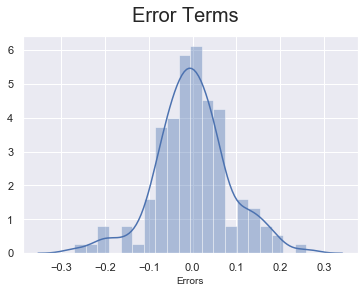

In [151]:
sns.set(font_scale=1)
fig = plt.figure()
sns.distplot((res), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)               
plt.xlabel('Errors', fontsize = 10) 

In [152]:
###### The error terms look normally distributed with mean of 0

In [153]:
carprice_train.columns

Index(['Symboling', 'Fuel_Type', 'Aspiration', 'Num_Of_Doors',
       'Engine_Location', 'Wheel_Base', 'Car_Length', 'Car_Width',
       'Car_Height', 'Curb_Weight', 'Engine_Size', 'Bore_Ratio', 'Strokes',
       'Compression_Ratio', 'Horse_Power', 'Peak_RPM', 'Mileage_City',
       'Mileage_Highway', 'Four_Wheel_Driven', 'Rear Wheel Driven', 'Hard_Top',
       'Hatch_Back', 'SEDAN', 'WAGON', 'Engine_Type_DOHCV',
       'Engine_Type_L_Head', 'Engine_Type_OHC', 'Engine_Type_OHCF',
       'Engine_Type_OHCV', 'Engine_Type_Rotor', '5_Cylinder_Engine',
       '4_Cylinder_Engine', '6_Cylinder_Engine', '3_Cylinder_Engine',
       '12_Cylinder_Engine', '2_Cylinder_Engine', '1bbl', '2BBL_Fuel_Type',
       '4BBL_Fuel_Type', 'IDI_Fuel_Type', 'MPFI_Fuel_Type', 'SPDI_Fuel_Type'],
      dtype='object')

In [154]:
num_vars = ['Price', 'Symboling', 'Wheel_Base', 'Car_Length', 'Car_Width','Car_Height', 'Curb_Weight', 'Engine_Size', 'Bore_Ratio', 'Strokes', 'Horse_Power', 'Peak_RPM', 'Mileage_City', 'Mileage_Highway', 'Compression_Ratio']

carprice_test[num_vars] = scaler.transform(carprice_test[num_vars])

In [155]:
carprice_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61 entries, 172 to 164
Data columns (total 43 columns):
Price                 61 non-null float64
Symboling             61 non-null float64
Fuel_Type             61 non-null int64
Aspiration            61 non-null int64
Num_Of_Doors          61 non-null int64
Engine_Location       61 non-null int64
Wheel_Base            61 non-null float64
Car_Length            61 non-null float64
Car_Width             61 non-null float64
Car_Height            61 non-null float64
Curb_Weight           61 non-null float64
Engine_Size           61 non-null float64
Bore_Ratio            61 non-null float64
Strokes               61 non-null float64
Compression_Ratio     61 non-null float64
Horse_Power           61 non-null float64
Peak_RPM              61 non-null float64
Mileage_City          61 non-null float64
Mileage_Highway       61 non-null float64
Four_Wheel_Driven     61 non-null uint8
Rear Wheel Driven     61 non-null uint8
Hard_Top              61

###### Dividing into X_test and y_test

In [157]:
y_test = carprice_test.pop('Price')
X_test = carprice_test

In [158]:
X_test.describe()

,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
count,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.0,61.0,61.0,61.000000,61.000000,61.0,61.000000,61.000000,61.000000
mean,0.540719,0.885246,0.786885,0.573770,0.983607,0.390724,0.509259,0.374960,0.466049,0.349430,0.252158,0.489593,0.664662,0.208402,0.351269,0.521489,0.377776,0.433458,0.590164,0.409836,0.049180,0.344262,0.475410,0.098361,0.0,0.032787,0.819672,0.016393,0.065574,0.0,0.032787,0.836066,0.114754,0.0,0.0,0.0,0.049180,0.245902,0.0,0.114754,0.508197,0.081967
std,0.255084,0.321370,0.412907,0.498632,0.128037,0.207338,0.211699,0.211532,0.219461,0.233242,0.158970,0.298599,0.139560,0.268389,0.247465,0.253168,0.225214,0.218995,0.495885,0.495885,0.218039,0.479070,0.503539,0.300273,0.0,0.179556,0.387651,0.128037,0.249590,0.0,0.179556,0.373288,0.321370,0.0,0.0,0.0,0.218039,0.434194,0.0,0.321370,0.504082,0.276591
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.137931,0.085247,0.000000,0.038766,0.000000,0.354157,0.000000,0.018595,0.000000,0.031291,0.029233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,0.395161,1.000000,1.000000,0.000000,1.000000,0.224499,0.372572,0.203405,0.309070,0.164114,0.120606,0.269663,0.559652,0.106250,0.115444,0.351351,0.161669,0.242387,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,0.596774,1.000000,1.000000,1.000000,1.000000,0.368219,0.530383,0.378001,0.474504,0.303193,0.223983,0.449438,0.677078,0.125000,0.315599,0.567568,0.324641,0.394641,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,1.000000,0.000000
75%,0.798387,1.000000,1.000000,1.000000,1.000000,0.526680,0.670852,0.476211,0.620475,0.532956,0.327360,0.764045,0.747534,0.150000,0.580320,0.729730,0.520209,0.577345,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.809786,1.000000,1.000000,0.968750,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,1.000000,1.000000,1.000000


In [159]:
y_test.describe()

count    61.000000
mean      0.227255
std       0.207035
min       0.005277
25%       0.075752
50%       0.151507
75%       0.328605
max       0.893973
Name: Price, dtype: float64

## Step 7: Model Evaluation

In [161]:
# Adding constant variable to test dataframe
X_test_m38 = sm.add_constant(X_test)

# Creating X_test_m61 dataframe by dropping variables from X_test_m61
X_test_m38  = X_test_m38[['const', 'Engine_Size', 'Peak_RPM', 'Hatch_Back', 'Engine_Type_OHCV', '4_Cylinder_Engine']]

# Making predictions using the model
y_pred_m38 = lr_38.predict(X_test_m38)

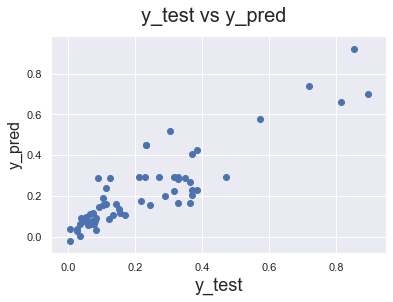

In [163]:
# Plotting y_test and y_pred to understand the spread

fig = plt.figure()
plt.scatter(y_test, y_pred_m38)
fig.suptitle('y_test vs y_pred', fontsize = 20)              # Plot heading 
plt.xlabel('y_test', fontsize = 18)                          # X-label
plt.ylabel('y_pred', fontsize = 16) 
plt.show()

###### The linear model at this time is as follows: Car Price = 0.08 +  (1.01 * Engine Size) + (0.09 *  Peak_RPM ) - (0.05 * Hatch_Back) - (0.16 * Engine_Type_OHCV) - (0.15 * 4_Cylinder_Engine). However, this is not the final model. We will build one more model using RFE and the select the final model

## Step 8: Model Evaluation with RFE

In [164]:
carprice_rfe.describe()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
count,203.000000,203.000000,203.000000,203.00000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000
mean,13263.971365,0.818325,0.901478,0.82266,0.566502,0.985222,98.775153,174.052158,65.919744,53.752079,2554.419507,126.692020,3.329507,3.250396,10.162660,103.336749,5120.443350,25.227980,30.767291,0.586207,0.369458,0.039409,0.334975,0.472906,0.123153,0.004926,0.059113,0.719212,0.073892,0.064039,0.019704,0.054187,0.773399,0.118227,0.004926,0.004926,0.019704,0.054187,0.325123,0.014778,0.098522,0.463054,0.044335
std,7929.425355,1.237981,0.298756,0.38290,0.496783,0.120963,5.923502,12.272989,2.112434,2.409219,515.839543,41.031371,0.262184,0.302509,3.984924,37.162228,464.361907,6.438763,6.769550,0.493730,0.483851,0.195047,0.473149,0.500500,0.329425,0.070186,0.236420,0.450495,0.262241,0.245428,0.139326,0.226946,0.419667,0.323674,0.070186,0.070186,0.139326,0.226946,0.469579,0.120963,0.298756,0.499866,0.206347
min,5201.120000,-1.960000,0.000000,0.00000,0.000000,0.000000,88.408000,144.816000,62.536000,48.824000,1819.720000,70.000000,2.910000,2.196800,7.000000,52.120000,4150.000000,14.040000,17.040000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7781.500000,0.000000,1.000000,1.00000,0.000000,1.000000,94.500000,166.300000,64.050000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,10245.000000,1.000000,1.000000,1.00000,1.000000,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,16509.000000,2.000000,1.000000,1.00000,1.000000,1.000000,102.400000,183.300000,66.900000,55.500000,2943.500000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,35.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,40802.720000,3.000000,1.000000,1.00000,1.000000,1.000000,115.544000,202.480000,71.700000,59.100000,3948.000000,302.160000,3.800000,3.900000,23.000000,207.000000,6000.000000,44.720000,49.880000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [165]:
carprice_rfe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 203 entries, 0 to 202
Data columns (total 43 columns):
Price                 203 non-null float64
Symboling             203 non-null float64
Fuel_Type             203 non-null int64
Aspiration            203 non-null int64
Num_Of_Doors          203 non-null int64
Engine_Location       203 non-null int64
Wheel_Base            203 non-null float64
Car_Length            203 non-null float64
Car_Width             203 non-null float64
Car_Height            203 non-null float64
Curb_Weight           203 non-null float64
Engine_Size           203 non-null float64
Bore_Ratio            203 non-null float64
Strokes               203 non-null float64
Compression_Ratio     203 non-null float64
Horse_Power           203 non-null float64
Peak_RPM              203 non-null int64
Mileage_City          203 non-null float64
Mileage_Highway       203 non-null float64
Four_Wheel_Driven     203 non-null uint8
Rear Wheel Driven     203 non-null uint8
Hard_T

### Splitting the Data into Training and Testing Sets

In [166]:
carprice_rfe_train, carprice_rfe_test = train_test_split(carprice_rfe, train_size = 0.7, test_size = 0.3, random_state = 100)

In [167]:
carprice_rfe_test.describe()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
count,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.0,61.0,61.0,61.000000,61.000000,61.0,61.000000,61.000000,61.000000
mean,13291.754098,0.721967,0.885246,0.786885,0.573770,0.983607,99.010689,174.181902,65.972131,53.613115,2563.405246,128.540984,3.345738,3.328852,10.334426,106.524590,5114.754098,25.630164,31.274754,0.590164,0.409836,0.049180,0.344262,0.475410,0.098361,0.0,0.032787,0.819672,0.016393,0.065574,0.0,0.032787,0.836066,0.114754,0.0,0.0,0.0,0.049180,0.245902,0.0,0.114754,0.508197,0.081967
std,7370.771883,1.265215,0.321370,0.412907,0.498632,0.128037,5.626333,12.207401,1.938481,2.255177,496.404626,36.906446,0.265753,0.237698,4.294216,38.327365,468.360995,6.909575,7.191782,0.495885,0.495885,0.218039,0.479070,0.503539,0.300273,0.0,0.179556,0.387651,0.128037,0.249590,0.0,0.179556,0.373288,0.321370,0.0,0.0,0.0,0.218039,0.434194,0.0,0.321370,0.504082,0.276591
min,5389.000000,-1.960000,0.000000,0.000000,0.000000,0.000000,88.408000,144.816000,63.800000,49.700000,1819.720000,79.000000,2.910000,2.800000,7.000000,55.000000,4150.000000,15.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,7898.000000,0.000000,1.000000,1.000000,0.000000,1.000000,94.500000,166.300000,64.400000,52.000000,2169.000000,98.000000,3.150000,3.150000,8.700000,70.000000,4800.000000,19.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,10595.000000,1.000000,1.000000,1.000000,1.000000,1.000000,98.400000,175.400000,66.000000,53.700000,2465.000000,122.000000,3.310000,3.350000,9.000000,101.000000,5200.000000,24.000000,30.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,1.000000,0.000000
75%,16900.000000,2.000000,1.000000,1.000000,1.000000,1.000000,102.700000,183.500000,66.900000,55.200000,2954.000000,146.000000,3.590000,3.470000,9.400000,142.000000,5500.000000,30.000000,36.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,1.000000,0.000000
max,37028.000000,3.000000,1.000000,1.000000,1.000000,1.000000,115.544000,202.480000,71.700000,59.100000,3948.000000,258.000000,3.800000,3.900000,22.500000,207.000000,6000.000000,44.720000,49.880000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,1.000000,1.000000,1.000000


In [168]:
carprice_rfe_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61 entries, 172 to 164
Data columns (total 43 columns):
Price                 61 non-null float64
Symboling             61 non-null float64
Fuel_Type             61 non-null int64
Aspiration            61 non-null int64
Num_Of_Doors          61 non-null int64
Engine_Location       61 non-null int64
Wheel_Base            61 non-null float64
Car_Length            61 non-null float64
Car_Width             61 non-null float64
Car_Height            61 non-null float64
Curb_Weight           61 non-null float64
Engine_Size           61 non-null float64
Bore_Ratio            61 non-null float64
Strokes               61 non-null float64
Compression_Ratio     61 non-null float64
Horse_Power           61 non-null float64
Peak_RPM              61 non-null int64
Mileage_City          61 non-null float64
Mileage_Highway       61 non-null float64
Four_Wheel_Driven     61 non-null uint8
Rear Wheel Driven     61 non-null uint8
Hard_Top              61 n

In [169]:
carprice_rfe_train.describe()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
count,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000
mean,13252.036528,0.859718,0.908451,0.838028,0.563380,0.985915,98.673972,173.996423,65.897239,53.811775,2550.559437,125.897746,3.322535,3.216693,10.088873,101.967324,5122.887324,25.055211,30.549296,0.584507,0.352113,0.035211,0.330986,0.471831,0.133803,0.007042,0.070423,0.676056,0.098592,0.063380,0.028169,0.063380,0.746479,0.119718,0.007042,0.007042,0.028169,0.056338,0.359155,0.021127,0.091549,0.443662,0.028169
std,8182.815788,1.228298,0.289410,0.369729,0.497722,0.118257,6.063245,12.343718,2.189107,2.477762,525.641609,42.780866,0.261272,0.321329,3.858023,36.703034,464.277951,6.243187,6.594245,0.494551,0.479320,0.184966,0.472234,0.500973,0.341645,0.083918,0.256763,0.469635,0.299168,0.244508,0.166041,0.244508,0.436567,0.325781,0.083918,0.083918,0.166041,0.231390,0.481451,0.144316,0.289410,0.498575,0.166041
min,5201.120000,-1.960000,0.000000,0.000000,0.000000,0.000000,88.408000,144.816000,62.536000,48.824000,1819.720000,70.000000,2.910000,2.196800,7.000000,52.120000,4150.000000,14.040000,17.040000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7775.000000,0.000000,1.000000,1.000000,0.000000,1.000000,94.500000,166.425000,64.000000,52.000000,2141.250000,97.000000,3.130000,3.085000,8.525000,70.000000,4800.000000,19.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,10096.500000,1.000000,1.000000,1.000000,1.000000,1.000000,96.950000,172.400000,65.400000,54.100000,2407.500000,110.000000,3.310000,3.270000,9.000000,94.500000,5200.000000,25.000000,30.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,16318.750000,2.000000,1.000000,1.000000,1.000000,1.000000,101.000000,182.400000,66.825000,55.575000,2922.500000,141.000000,3.580000,3.400000,9.400000,116.000000,5500.000000,30.000000,34.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,40802.720000,3.000000,1.000000,1.000000,1.000000,1.000000,115.544000,202.480000,71.700000,59.100000,3948.000000,302.160000,3.800000,3.900000,23.000000,207.000000,6000.000000,44.720000,49.880000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [170]:
carprice_rfe_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 142 entries, 1 to 8
Data columns (total 43 columns):
Price                 142 non-null float64
Symboling             142 non-null float64
Fuel_Type             142 non-null int64
Aspiration            142 non-null int64
Num_Of_Doors          142 non-null int64
Engine_Location       142 non-null int64
Wheel_Base            142 non-null float64
Car_Length            142 non-null float64
Car_Width             142 non-null float64
Car_Height            142 non-null float64
Curb_Weight           142 non-null float64
Engine_Size           142 non-null float64
Bore_Ratio            142 non-null float64
Strokes               142 non-null float64
Compression_Ratio     142 non-null float64
Horse_Power           142 non-null float64
Peak_RPM              142 non-null int64
Mileage_City          142 non-null float64
Mileage_Highway       142 non-null float64
Four_Wheel_Driven     142 non-null uint8
Rear Wheel Driven     142 non-null uint8
Hard_Top

In [171]:
scaler = MinMaxScaler()
num_vars = ['Price', 'Symboling', 'Wheel_Base', 'Car_Length', 'Car_Width','Car_Height', 'Curb_Weight', 'Engine_Size', 'Bore_Ratio', 'Strokes', 'Horse_Power', 'Peak_RPM', 'Mileage_City', 'Mileage_Highway', 'Compression_Ratio']

carprice_rfe_train[num_vars] = scaler.fit_transform(carprice_rfe_train[num_vars])

In [172]:
carprice_rfe_train.describe()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
count,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000
mean,0.226139,0.568492,0.908451,0.838028,0.563380,0.985915,0.378316,0.506042,0.366787,0.485381,0.343394,0.240773,0.463523,0.598810,0.193055,0.321845,0.525885,0.359036,0.411367,0.584507,0.352113,0.035211,0.330986,0.471831,0.133803,0.007042,0.070423,0.676056,0.098592,0.063380,0.028169,0.063380,0.746479,0.119718,0.007042,0.007042,0.028169,0.056338,0.359155,0.021127,0.091549,0.443662,0.028169
std,0.229844,0.247641,0.289410,0.369729,0.497722,0.118257,0.223439,0.214063,0.238881,0.241121,0.246980,0.184273,0.293564,0.188662,0.241126,0.236977,0.250961,0.203494,0.200799,0.494551,0.479320,0.184966,0.472234,0.500973,0.341645,0.083918,0.256763,0.469635,0.299168,0.244508,0.166041,0.244508,0.436567,0.325781,0.083918,0.083918,0.166041,0.231390,0.481451,0.144316,0.289410,0.498575,0.166041
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.072297,0.395161,1.000000,1.000000,0.000000,1.000000,0.224499,0.374740,0.159756,0.309070,0.151075,0.116299,0.247191,0.521489,0.095312,0.115444,0.351351,0.161669,0.242387,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.137504,0.596774,1.000000,1.000000,1.000000,1.000000,0.314785,0.478357,0.312527,0.513429,0.276176,0.172295,0.449438,0.630108,0.125000,0.273631,0.567568,0.357236,0.394641,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.312279,0.798387,1.000000,1.000000,1.000000,1.000000,0.464033,0.651776,0.468027,0.656968,0.518156,0.305824,0.752809,0.706435,0.150000,0.412448,0.729730,0.520209,0.516443,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [173]:
carprice_rfe_train.head()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
1,0.317370,1.000000,1,1,0,1,0.007075,0.415927,0.170668,0.000000,0.342192,0.258442,0.629213,0.283701,0.12500,0.380165,0.459459,0.226858,0.303289,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
163,0.115076,0.596774,1,1,0,1,0.224499,0.414193,0.159756,0.367458,0.209221,0.120606,0.370787,0.518553,0.15000,0.386622,1.000000,0.389831,0.364190,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
139,0.054067,0.395161,1,1,1,1,0.323998,0.471421,0.312527,0.357727,0.152837,0.163680,0.797753,0.260216,0.15625,0.192924,0.351351,0.585398,0.607795,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0
136,0.000000,0.798387,1,1,0,1,0.195018,0.209559,0.094282,0.474504,0.108200,0.116299,0.797753,0.095820,0.12500,0.108988,0.405405,0.552803,0.577345,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0
188,0.134232,1.000000,1,1,0,1,0.224499,0.362167,0.159756,0.250681,0.188547,0.167988,0.314607,0.706435,0.09375,0.244576,0.729730,0.324641,0.364190,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [175]:
carprice_rfe_train.loc[carprice_rfe_train.duplicated()]

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type


In [176]:
carprice_rfe_test.loc[carprice_rfe_test.duplicated()]

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type


###### Dividing into X and Y sets for the model building

In [177]:
y_train = carprice_rfe_train.pop('Price')
X_train = carprice_rfe_train

### Build The Model With RFE

In [178]:
# All required libraries for RFE have been imported earlier
# Running RFE with the output number of the variable equal to 20
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, 20)
rfe = rfe.fit(X_train, y_train)

In [179]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Symboling', False, 19),
 ('Fuel_Type', True, 1),
 ('Aspiration', False, 3),
 ('Num_Of_Doors', False, 18),
 ('Engine_Location', True, 1),
 ('Wheel_Base', False, 16),
 ('Car_Length', False, 15),
 ('Car_Width', True, 1),
 ('Car_Height', False, 11),
 ('Curb_Weight', True, 1),
 ('Engine_Size', True, 1),
 ('Bore_Ratio', False, 7),
 ('Strokes', True, 1),
 ('Compression_Ratio', True, 1),
 ('Horse_Power', False, 12),
 ('Peak_RPM', True, 1),
 ('Mileage_City', False, 10),
 ('Mileage_Highway', False, 6),
 ('Four_Wheel_Driven', False, 22),
 ('Rear Wheel Driven', False, 9),
 ('Hard_Top', True, 1),
 ('Hatch_Back', True, 1),
 ('SEDAN', True, 1),
 ('WAGON', True, 1),
 ('Engine_Type_DOHCV', False, 14),
 ('Engine_Type_L_Head', False, 20),
 ('Engine_Type_OHC', True, 1),
 ('Engine_Type_OHCF', False, 8),
 ('Engine_Type_OHCV', True, 1),
 ('Engine_Type_Rotor', False, 4),
 ('5_Cylinder_Engine', True, 1),
 ('4_Cylinder_Engine', True, 1),
 ('6_Cylinder_Engine', True, 1),
 ('3_Cylinder_Engine', False, 13),
 ('

In [180]:
col = X_train.columns[rfe.support_]
col

Index(['Fuel_Type', 'Engine_Location', 'Car_Width', 'Curb_Weight',
       'Engine_Size', 'Strokes', 'Compression_Ratio', 'Peak_RPM', 'Hard_Top',
       'Hatch_Back', 'SEDAN', 'WAGON', 'Engine_Type_OHC', 'Engine_Type_OHCV',
       '5_Cylinder_Engine', '4_Cylinder_Engine', '6_Cylinder_Engine',
       '12_Cylinder_Engine', 'IDI_Fuel_Type', 'SPDI_Fuel_Type'],
      dtype='object')

In [181]:
X_train.columns[~rfe.support_]

Index(['Symboling', 'Aspiration', 'Num_Of_Doors', 'Wheel_Base', 'Car_Length',
       'Car_Height', 'Bore_Ratio', 'Horse_Power', 'Mileage_City',
       'Mileage_Highway', 'Four_Wheel_Driven', 'Rear Wheel Driven',
       'Engine_Type_DOHCV', 'Engine_Type_L_Head', 'Engine_Type_OHCF',
       'Engine_Type_Rotor', '3_Cylinder_Engine', '2_Cylinder_Engine', '1bbl',
       '2BBL_Fuel_Type', '4BBL_Fuel_Type', 'MPFI_Fuel_Type'],
      dtype='object')

In [182]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

# Add the constant variable 
X_train_rfe = sm.add_constant(X_train_rfe)

# Run the linear model
lm = sm.OLS(y_train,X_train_rfe).fit()   

In [183]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     102.4
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.54e-65
Time:                        16:39:09   Log-Likelihood:                 208.71
No. Observations:                 142   AIC:                            -377.4
Df Residuals:                     122   BIC:                            -318.3
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.5516      0.096      5.751      0.000       0.362       0.741
Fuel_Type             -0.0184      0.055     -0.334      0.739      -0.128       0.091
Engine_Location       -0.2165      0.067     -3.216      0.002      -0.350      -0.083
Car_Width              0.1378      0.056      2.472      0.015       0.027       0.248
Curb_Weight            0.2075      0.070      2.958      0.004       0.069       0.346
Engine_Size            0.6959      0.084      8.248      0.000       0.529       0.863
Strokes               -0.2694      0.040     -6.739      0.000      -0.349      -0.190
Compression_Ratio     -0.6023      0.196     -3.079      0.003      -0.989      -0.215
Peak_RPM               0.1337      0.030      4.472      0.000       0.074       0.193
Hard_Top              -0.0572      0.049     -1.176      0.242      -0.153       0.039
Hatch_Back            -0.1004      0.034     -2.936      0.004      -0.168      -0.033
SEDAN                 -0.0710      0.034     -2.101      0.038      -0.138      -0.004
WAGON                 -0.1012      0.035     -2.872      0.005      -0.171      -0.031
Engine_Type_OHC        0.1117      0.017      6.542      0.000       0.078       0.145
Engine_Type_OHCV      -0.1065      0.031     -3.478      0.001      -0.167      -0.046
5_Cylinder_Engine     -0.2143      0.037     -5.725      0.000      -0.288      -0.140
4_Cylinder_Engine     -0.2504      0.028     -8.816      0.000      -0.307      -0.194
6_Cylinder_Engine     -0.1085      0.030     -3.663      0.000      -0.167      -0.050
12_Cylinder_Engine    -0.1017      0.085     -1.197      0.234      -0.270       0.067
IDI_Fuel_Type          0.5700      0.127      4.477      0.000       0.318       0.822
SPDI_Fuel_Type        -0.0620      0.037     -1.692      0.093      -0.135       0.011
==============================================================================
Omnibus:                       20.093   Durbin-Watson:                   1.719
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.021
Skew:                           0.604   Prob(JB):                     1.24e-09
Kurtosis:                       5.340   Cond. No.                     3.94e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 4.81e-31. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

###### Drop the variable: Fuel_Type (p-value: 0.739)

In [186]:
X_train_new = X_train_rfe.drop(columns=["Fuel_Type"])

In [187]:
# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()

In [188]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.941
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     102.4
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.54e-65
Time:                        16:40:16   Log-Likelihood:                 208.71
No. Observations:                 142   AIC:                            -377.4
Df Residuals:                     122   BIC:                            -318.3
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.5332      0.091      5.861      0.000       0.353       0.713
Engine_Location       -0.2165      0.067     -3.216      0.002      -0.350      -0.083
Car_Width              0.1378      0.056      2.472      0.015       0.027       0.248
Curb_Weight            0.2075      0.070      2.958      0.004       0.069       0.346
Engine_Size            0.6959      0.084      8.248      0.000       0.529       0.863
Strokes               -0.2694      0.040     -6.739      0.000      -0.349      -0.190
Compression_Ratio     -0.6023      0.196     -3.079      0.003      -0.989      -0.215
Peak_RPM               0.1337      0.030      4.472      0.000       0.074       0.193
Hard_Top              -0.0572      0.049     -1.176      0.242      -0.153       0.039
Hatch_Back            -0.1004      0.034     -2.936      0.004      -0.168      -0.033
SEDAN                 -0.0710      0.034     -2.101      0.038      -0.138      -0.004
WAGON                 -0.1012      0.035     -2.872      0.005      -0.171      -0.031
Engine_Type_OHC        0.1117      0.017      6.542      0.000       0.078       0.145
Engine_Type_OHCV      -0.1065      0.031     -3.478      0.001      -0.167      -0.046
5_Cylinder_Engine     -0.2143      0.037     -5.725      0.000      -0.288      -0.140
4_Cylinder_Engine     -0.2504      0.028     -8.816      0.000      -0.307      -0.194
6_Cylinder_Engine     -0.1085      0.030     -3.663      0.000      -0.167      -0.050
12_Cylinder_Engine    -0.1017      0.085     -1.197      0.234      -0.270       0.067
IDI_Fuel_Type          0.5884      0.171      3.437      0.001       0.249       0.927
SPDI_Fuel_Type        -0.0620      0.037     -1.692      0.093      -0.135       0.011
==============================================================================
Omnibus:                       20.093   Durbin-Watson:                   1.719
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               41.021
Skew:                           0.604   Prob(JB):                     1.24e-09
Kurtosis:                       5.340   Cond. No.                         111.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [189]:
X_train_new = X_train_new.drop(['const'], axis=1)
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Compression_Ratio,124.65
17,IDI_Fuel_Type,94.40
0,Engine_Location,75.45
2,Curb_Weight,34.29
4,Strokes,24.77
3,Engine_Size,23.51
1,Car_Width,22.66
9,SEDAN,19.04
14,4_Cylinder_Engine,18.44
8,Hatch_Back,13.27


###### Drop the variable: Hard_Top (p-value: 0.242)

In [190]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["Hard_Top"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.932
Method:                 Least Squares   F-statistic:                     107.6
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.89e-66
Time:                        16:41:35   Log-Likelihood:                 207.91
No. Observations:                 142   AIC:                            -377.8
Df Residuals:                     123   BIC:                            -321.7
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.4779      0.078      6.127      0.000       0.323       0.632
Engine_Location       -0.1801      0.060     -3.008      0.003      -0.299      -0.062
Car_Width              0.1316      0.056      2.368      0.019       0.022       0.242
Curb_Weight            0.2156      0.070      3.084      0.003       0.077       0.354
Engine_Size            0.6860      0.084      8.159      0.000       0.520       0.852
Strokes               -0.2733      0.040     -6.852      0.000      -0.352      -0.194
Compression_Ratio     -0.6179      0.195     -3.161      0.002      -1.005      -0.231
Peak_RPM               0.1373      0.030      4.614      0.000       0.078       0.196
Hatch_Back            -0.0781      0.029     -2.739      0.007      -0.135      -0.022
SEDAN                 -0.0479      0.028     -1.739      0.084      -0.102       0.007
WAGON                 -0.0799      0.030     -2.640      0.009      -0.140      -0.020
Engine_Type_OHC        0.1107      0.017      6.483      0.000       0.077       0.145
Engine_Type_OHCV      -0.1060      0.031     -3.457      0.001      -0.167      -0.045
5_Cylinder_Engine     -0.2158      0.037     -5.758      0.000      -0.290      -0.142
4_Cylinder_Engine     -0.2492      0.028     -8.766      0.000      -0.306      -0.193
6_Cylinder_Engine     -0.1064      0.030     -3.591      0.000      -0.165      -0.048
12_Cylinder_Engine    -0.0951      0.085     -1.119      0.265      -0.263       0.073
IDI_Fuel_Type          0.6012      0.171      3.513      0.001       0.262       0.940
SPDI_Fuel_Type        -0.0625      0.037     -1.703      0.091      -0.135       0.010
==============================================================================
Omnibus:                       18.944   Durbin-Watson:                   1.728
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               37.695
Skew:                           0.576   Prob(JB):                     6.53e-09
Kurtosis:                       5.245   Cond. No.                         111.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [192]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Compression_Ratio,112.07
16,IDI_Fuel_Type,86.58
0,Engine_Location,74.30
2,Curb_Weight,34.17
4,Strokes,24.42
1,Car_Width,22.66
3,Engine_Size,21.28
13,4_Cylinder_Engine,17.02
8,SEDAN,14.06
7,Hatch_Back,10.46


###### Drop the variable: 12_Cylinder_Engine (p-value: 0.265)

In [193]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["12_Cylinder_Engine"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.940
Model:                            OLS   Adj. R-squared:                  0.931
Method:                 Least Squares   F-statistic:                     113.7
Date:                Fri, 08 May 2020   Prob (F-statistic):           4.94e-67
Time:                        16:42:42   Log-Likelihood:                 207.19
No. Observations:                 142   AIC:                            -378.4
Df Residuals:                     124   BIC:                            -325.2
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.5000      0.076      6.619      0.000       0.350       0.649
Engine_Location      -0.1804      0.060     -3.011      0.003      -0.299      -0.062
Car_Width             0.1481      0.054      2.760      0.007       0.042       0.254
Curb_Weight           0.2029      0.069      2.938      0.004       0.066       0.340
Engine_Size           0.6555      0.080      8.233      0.000       0.498       0.813
Strokes              -0.2677      0.040     -6.758      0.000      -0.346      -0.189
Compression_Ratio    -0.7181      0.174     -4.130      0.000      -1.062      -0.374
Peak_RPM              0.1356      0.030      4.557      0.000       0.077       0.195
Hatch_Back           -0.0869      0.027     -3.165      0.002      -0.141      -0.033
SEDAN                -0.0568      0.026     -2.149      0.034      -0.109      -0.004
WAGON                -0.0877      0.029     -2.977      0.003      -0.146      -0.029
Engine_Type_OHC       0.1107      0.017      6.475      0.000       0.077       0.145
Engine_Type_OHCV     -0.1105      0.030     -3.632      0.000      -0.171      -0.050
5_Cylinder_Engine    -0.2192      0.037     -5.864      0.000      -0.293      -0.145
4_Cylinder_Engine    -0.2490      0.028     -8.748      0.000      -0.305      -0.193
6_Cylinder_Engine    -0.0960      0.028     -3.409      0.001      -0.152      -0.040
IDI_Fuel_Type         0.6837      0.155      4.423      0.000       0.378       0.990
SPDI_Fuel_Type       -0.0708      0.036     -1.967      0.051      -0.142       0.000
==============================================================================
Omnibus:                       18.928   Durbin-Watson:                   1.747
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               35.205
Skew:                           0.604   Prob(JB):                     2.27e-08
Kurtosis:                       5.120   Cond. No.                         98.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [194]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Compression_Ratio,94.33
15,IDI_Fuel_Type,74.75
0,Engine_Location,70.12
2,Curb_Weight,33.35
4,Strokes,23.83
1,Car_Width,21.39
3,Engine_Size,19.94
13,4_Cylinder_Engine,16.50
8,SEDAN,12.88
6,Peak_RPM,9.77


###### Drop the variable: Compression_Ratio (VIF: 94.33)

In [195]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["Compression_Ratio"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     106.1
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.30e-64
Time:                        16:43:35   Log-Likelihood:                 198.04
No. Observations:                 142   AIC:                            -362.1
Df Residuals:                     125   BIC:                            -311.8
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.3743      0.073      5.097      0.000       0.229       0.520
Engine_Location      -0.1799      0.064     -2.826      0.005      -0.306      -0.054
Car_Width             0.1444      0.057      2.534      0.013       0.032       0.257
Curb_Weight           0.2743      0.071      3.862      0.000       0.134       0.415
Engine_Size           0.6017      0.083      7.212      0.000       0.437       0.767
Strokes              -0.2126      0.040     -5.366      0.000      -0.291      -0.134
Peak_RPM              0.1024      0.030      3.365      0.001       0.042       0.163
Hatch_Back           -0.0906      0.029     -3.108      0.002      -0.148      -0.033
SEDAN                -0.0656      0.028     -2.344      0.021      -0.121      -0.010
WAGON                -0.0981      0.031     -3.147      0.002      -0.160      -0.036
Engine_Type_OHC       0.0934      0.018      5.303      0.000       0.059       0.128
Engine_Type_OHCV     -0.1052      0.032     -3.260      0.001      -0.169      -0.041
5_Cylinder_Engine    -0.1563      0.036     -4.310      0.000      -0.228      -0.085
4_Cylinder_Engine    -0.2108      0.029     -7.373      0.000      -0.267      -0.154
6_Cylinder_Engine    -0.0757      0.029     -2.569      0.011      -0.134      -0.017
IDI_Fuel_Type         0.0537      0.026      2.032      0.044       0.001       0.106
SPDI_Fuel_Type       -0.0117      0.035     -0.334      0.739      -0.081       0.058
==============================================================================
Omnibus:                       22.052   Durbin-Watson:                   1.772
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               70.669
Skew:                           0.480   Prob(JB):                     4.51e-16
Kurtosis:                       6.320   Cond. No.                         44.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [196]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Engine_Location,57.01
2,Curb_Weight,30.94
4,Strokes,21.48
1,Car_Width,21.38
3,Engine_Size,17.40
12,4_Cylinder_Engine,16.20
7,SEDAN,12.82
6,Hatch_Back,9.74
5,Peak_RPM,7.10
9,Engine_Type_OHC,6.97


###### Drop the variable: SPDI_Fuel_Type (P-Value: 0.739)

In [197]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["SPDI_Fuel_Type"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.923
Method:                 Least Squares   F-statistic:                     113.9
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.26e-65
Time:                        16:44:51   Log-Likelihood:                 197.98
No. Observations:                 142   AIC:                            -364.0
Df Residuals:                     126   BIC:                            -316.7
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.3764      0.073      5.163      0.000       0.232       0.521
Engine_Location      -0.1787      0.063     -2.821      0.006      -0.304      -0.053
Car_Width             0.1461      0.057      2.583      0.011       0.034       0.258
Curb_Weight           0.2705      0.070      3.872      0.000       0.132       0.409
Engine_Size           0.6019      0.083      7.240      0.000       0.437       0.766
Strokes              -0.2155      0.039     -5.595      0.000      -0.292      -0.139
Peak_RPM              0.1023      0.030      3.373      0.001       0.042       0.162
Hatch_Back           -0.0916      0.029     -3.172      0.002      -0.149      -0.034
SEDAN                -0.0660      0.028     -2.368      0.019      -0.121      -0.011
WAGON                -0.0981      0.031     -3.158      0.002      -0.160      -0.037
Engine_Type_OHC       0.0934      0.018      5.325      0.000       0.059       0.128
Engine_Type_OHCV     -0.1051      0.032     -3.267      0.001      -0.169      -0.041
5_Cylinder_Engine    -0.1565      0.036     -4.330      0.000      -0.228      -0.085
4_Cylinder_Engine    -0.2120      0.028     -7.501      0.000      -0.268      -0.156
6_Cylinder_Engine    -0.0753      0.029     -2.568      0.011      -0.133      -0.017
IDI_Fuel_Type         0.0547      0.026      2.089      0.039       0.003       0.106
==============================================================================
Omnibus:                       22.402   Durbin-Watson:                   1.772
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               71.419
Skew:                           0.494   Prob(JB):                     3.10e-16
Kurtosis:                       6.331   Cond. No.                         44.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [198]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Engine_Location,54.79
2,Curb_Weight,30.07
1,Car_Width,21.23
4,Strokes,20.43
3,Engine_Size,17.36
12,4_Cylinder_Engine,16.05
7,SEDAN,12.80
6,Hatch_Back,9.64
5,Peak_RPM,7.08
9,Engine_Type_OHC,6.97


###### Drop the variable: Engine_Location (VIF: 54.79)

In [199]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["Engine_Location"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     115.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           5.31e-65
Time:                        16:45:54   Log-Likelihood:                 193.63
No. Observations:                 142   AIC:                            -357.3
Df Residuals:                     127   BIC:                            -312.9
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2166      0.047      4.595      0.000       0.123       0.310
Car_Width             0.1330      0.058      2.298      0.023       0.018       0.248
Curb_Weight           0.2338      0.071      3.316      0.001       0.094       0.373
Engine_Size           0.6837      0.080      8.544      0.000       0.525       0.842
Strokes              -0.2355      0.039     -6.057      0.000      -0.312      -0.159
Peak_RPM              0.1338      0.029      4.619      0.000       0.076       0.191
Hatch_Back           -0.1197      0.028     -4.301      0.000      -0.175      -0.065
SEDAN                -0.0959      0.026     -3.624      0.000      -0.148      -0.044
WAGON                -0.1233      0.031     -4.034      0.000      -0.184      -0.063
Engine_Type_OHC       0.0868      0.018      4.861      0.000       0.051       0.122
Engine_Type_OHCV     -0.1350      0.031     -4.331      0.000      -0.197      -0.073
5_Cylinder_Engine    -0.1470      0.037     -3.979      0.000      -0.220      -0.074
4_Cylinder_Engine    -0.2056      0.029     -7.104      0.000      -0.263      -0.148
6_Cylinder_Engine    -0.0515      0.029     -1.785      0.077      -0.109       0.006
IDI_Fuel_Type         0.0731      0.026      2.810      0.006       0.022       0.125
==============================================================================
Omnibus:                       11.986   Durbin-Watson:                   1.801
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               30.268
Skew:                           0.165   Prob(JB):                     2.67e-07
Kurtosis:                       5.238   Cond. No.                         33.0
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [200]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Curb_Weight,29.36
0,Car_Width,21.22
3,Strokes,19.07
2,Engine_Size,17.35
11,4_Cylinder_Engine,11.55
6,SEDAN,8.51
8,Engine_Type_OHC,6.96
4,Peak_RPM,6.85
5,Hatch_Back,6.10
7,WAGON,3.40


###### Drop the variable: 6_Cylinder_Engine (P-Value: 0.077)

In [201]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["6_Cylinder_Engine"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.925
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                     121.7
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.24e-65
Time:                        16:46:46   Log-Likelihood:                 191.87
No. Observations:                 142   AIC:                            -355.7
Df Residuals:                     128   BIC:                            -314.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1873      0.045      4.203      0.000       0.099       0.275
Car_Width             0.1632      0.056      2.923      0.004       0.053       0.274
Curb_Weight           0.2134      0.070      3.042      0.003       0.075       0.352
Engine_Size           0.6698      0.080      8.339      0.000       0.511       0.829
Strokes              -0.2331      0.039     -5.949      0.000      -0.311      -0.156
Peak_RPM              0.1367      0.029      4.688      0.000       0.079       0.194
Hatch_Back           -0.1235      0.028     -4.413      0.000      -0.179      -0.068
SEDAN                -0.1031      0.026     -3.912      0.000      -0.155      -0.051
WAGON                -0.1301      0.031     -4.253      0.000      -0.191      -0.070
Engine_Type_OHC       0.0816      0.018      4.593      0.000       0.046       0.117
Engine_Type_OHCV     -0.1297      0.031     -4.143      0.000      -0.192      -0.068
5_Cylinder_Engine    -0.1142      0.032     -3.533      0.001      -0.178      -0.050
4_Cylinder_Engine    -0.1704      0.021     -7.966      0.000      -0.213      -0.128
IDI_Fuel_Type         0.0721      0.026      2.749      0.007       0.020       0.124
==============================================================================
Omnibus:                       10.556   Durbin-Watson:                   1.805
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               26.008
Skew:                           0.024   Prob(JB):                     2.25e-06
Kurtosis:                       5.096   Cond. No.                         32.9
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [202]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Curb_Weight,28.31
3,Strokes,19.05
0,Car_Width,18.99
2,Engine_Size,16.34
6,SEDAN,7.25
8,Engine_Type_OHC,6.86
11,4_Cylinder_Engine,6.81
4,Peak_RPM,6.68
5,Hatch_Back,5.43
7,WAGON,3.05


###### Drop the variable: Curb_Weight (VIF: 28.31)

In [203]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["Curb_Weight"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.920
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     123.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.67e-64
Time:                        16:47:32   Log-Likelihood:                 186.92
No. Observations:                 142   AIC:                            -347.8
Df Residuals:                     129   BIC:                            -309.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2022      0.046      4.426      0.000       0.112       0.293
Car_Width             0.2691      0.045      5.975      0.000       0.180       0.358
Engine_Size           0.7983      0.070     11.328      0.000       0.659       0.938
Strokes              -0.2284      0.040     -5.653      0.000      -0.308      -0.148
Peak_RPM              0.1307      0.030      4.356      0.000       0.071       0.190
Hatch_Back           -0.1237      0.029     -4.285      0.000      -0.181      -0.067
SEDAN                -0.1004      0.027     -3.693      0.000      -0.154      -0.047
WAGON                -0.1053      0.030     -3.463      0.001      -0.165      -0.045
Engine_Type_OHC       0.0694      0.018      3.886      0.000       0.034       0.105
Engine_Type_OHCV     -0.1496      0.032     -4.740      0.000      -0.212      -0.087
5_Cylinder_Engine    -0.1172      0.033     -3.517      0.001      -0.183      -0.051
4_Cylinder_Engine    -0.1796      0.022     -8.220      0.000      -0.223      -0.136
IDI_Fuel_Type         0.0822      0.027      3.062      0.003       0.029       0.135
==============================================================================
Omnibus:                       11.477   Durbin-Watson:                   1.827
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               24.710
Skew:                           0.247   Prob(JB):                     4.31e-06
Kurtosis:                       4.983   Cond. No.                         28.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [204]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Strokes,18.98
0,Car_Width,11.75
1,Engine_Size,10.03
5,SEDAN,7.15
10,4_Cylinder_Engine,6.75
3,Peak_RPM,6.68
7,Engine_Type_OHC,6.46
4,Hatch_Back,5.40
6,WAGON,2.62
9,5_Cylinder_Engine,2.01


###### Drop the variable: Strokes (VIF: 18.98)

In [205]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["Strokes"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.900
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     106.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           2.24e-59
Time:                        16:48:26   Log-Likelihood:                 171.20
No. Observations:                 142   AIC:                            -318.4
Df Residuals:                     130   BIC:                            -282.9
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1529      0.050      3.065      0.003       0.054       0.252
Car_Width             0.2722      0.050      5.432      0.000       0.173       0.371
Engine_Size           0.7081      0.076      9.271      0.000       0.557       0.859
Peak_RPM              0.0914      0.032      2.815      0.006       0.027       0.156
Hatch_Back           -0.1506      0.032     -4.752      0.000      -0.213      -0.088
SEDAN                -0.1147      0.030     -3.810      0.000      -0.174      -0.055
WAGON                -0.1231      0.034     -3.658      0.000      -0.190      -0.057
Engine_Type_OHC       0.0191      0.017      1.108      0.270      -0.015       0.053
Engine_Type_OHCV     -0.1428      0.035     -4.069      0.000      -0.212      -0.073
5_Cylinder_Engine    -0.1070      0.037     -2.890      0.005      -0.180      -0.034
4_Cylinder_Engine    -0.1664      0.024     -6.885      0.000      -0.214      -0.119
IDI_Fuel_Type         0.0265      0.028      0.952      0.343      -0.029       0.081
==============================================================================
Omnibus:                       10.168   Durbin-Watson:                   1.808
Prob(Omnibus):                  0.006   Jarque-Bera (JB):               23.430
Skew:                           0.098   Prob(JB):                     8.17e-06
Kurtosis:                       4.980   Cond. No.                         26.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [206]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Car_Width,11.73
1,Engine_Size,8.48
9,4_Cylinder_Engine,6.75
4,SEDAN,6.69
2,Peak_RPM,5.60
6,Engine_Type_OHC,4.95
3,Hatch_Back,4.71
5,WAGON,2.45
8,5_Cylinder_Engine,2.01
7,Engine_Type_OHCV,1.93


###### Drop the variable: IDI_Fuel_Type (P-Value: 0.343)

In [207]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["IDI_Fuel_Type"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     116.8
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.16e-60
Time:                        16:49:22   Log-Likelihood:                 170.71
No. Observations:                 142   AIC:                            -319.4
Df Residuals:                     131   BIC:                            -286.9
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1658      0.048      3.454      0.001       0.071       0.261
Car_Width             0.2880      0.047      6.092      0.000       0.194       0.381
Engine_Size           0.6893      0.074      9.346      0.000       0.543       0.835
Peak_RPM              0.0768      0.029      2.685      0.008       0.020       0.133
Hatch_Back           -0.1553      0.031     -4.962      0.000      -0.217      -0.093
SEDAN                -0.1178      0.030     -3.936      0.000      -0.177      -0.059
WAGON                -0.1261      0.033     -3.764      0.000      -0.192      -0.060
Engine_Type_OHC       0.0207      0.017      1.209      0.229      -0.013       0.055
Engine_Type_OHCV     -0.1450      0.035     -4.140      0.000      -0.214      -0.076
5_Cylinder_Engine    -0.1071      0.037     -2.892      0.004      -0.180      -0.034
4_Cylinder_Engine    -0.1686      0.024     -7.005      0.000      -0.216      -0.121
==============================================================================
Omnibus:                       10.555   Durbin-Watson:                   1.815
Prob(Omnibus):                  0.005   Jarque-Bera (JB):               25.379
Skew:                           0.084   Prob(JB):                     3.08e-06
Kurtosis:                       5.064   Cond. No.                         25.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [208]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Car_Width,10.57
1,Engine_Size,8.35
9,4_Cylinder_Engine,6.69
4,SEDAN,6.66
6,Engine_Type_OHC,4.91
3,Hatch_Back,4.71
2,Peak_RPM,4.68
5,WAGON,2.43
8,5_Cylinder_Engine,2.00
7,Engine_Type_OHCV,1.92


###### Drop the variable: Engine_Type_OHC (P-Value: 0.229)

In [209]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["Engine_Type_OHC"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.898
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     129.2
Date:                Fri, 08 May 2020   Prob (F-statistic):           5.55e-61
Time:                        16:50:30   Log-Likelihood:                 169.92
No. Observations:                 142   AIC:                            -319.8
Df Residuals:                     132   BIC:                            -290.3
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1638      0.048      3.409      0.001       0.069       0.259
Car_Width             0.2729      0.046      5.975      0.000       0.183       0.363
Engine_Size           0.7076      0.072      9.784      0.000       0.565       0.851
Peak_RPM              0.0808      0.028      2.841      0.005       0.025       0.137
Hatch_Back           -0.1474      0.031     -4.808      0.000      -0.208      -0.087
SEDAN                -0.1098      0.029     -3.756      0.000      -0.168      -0.052
WAGON                -0.1236      0.033     -3.691      0.000      -0.190      -0.057
Engine_Type_OHCV     -0.1517      0.035     -4.382      0.000      -0.220      -0.083
5_Cylinder_Engine    -0.0883      0.034     -2.623      0.010      -0.155      -0.022
4_Cylinder_Engine    -0.1585      0.023     -7.010      0.000      -0.203      -0.114
==============================================================================
Omnibus:                       11.956   Durbin-Watson:                   1.794
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               32.047
Skew:                           0.096   Prob(JB):                     1.10e-07
Kurtosis:                       5.319   Cond. No.                         22.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [210]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Car_Width,9.84
1,Engine_Size,7.92
4,SEDAN,6.24
8,4_Cylinder_Engine,5.54
2,Peak_RPM,4.62
3,Hatch_Back,4.43
5,WAGON,2.42
6,Engine_Type_OHCV,1.87
7,5_Cylinder_Engine,1.63


###### Drop the variable: Car_Width (VIF: 9.84)

In [211]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["Car_Width"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.863
Method:                 Least Squares   F-statistic:                     111.7
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.32e-55
Time:                        16:51:05   Log-Likelihood:                 152.92
No. Observations:                 142   AIC:                            -287.8
Df Residuals:                     133   BIC:                            -261.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1594      0.054      2.954      0.004       0.053       0.266
Engine_Size           0.9728      0.064     15.171      0.000       0.846       1.100
Peak_RPM              0.0757      0.032      2.371      0.019       0.013       0.139
Hatch_Back           -0.1098      0.034     -3.257      0.001      -0.176      -0.043
SEDAN                -0.0642      0.032     -2.026      0.045      -0.127      -0.002
WAGON                -0.0767      0.037     -2.099      0.038      -0.149      -0.004
Engine_Type_OHCV     -0.1598      0.039     -4.112      0.000      -0.237      -0.083
5_Cylinder_Engine    -0.0153      0.035     -0.433      0.666      -0.085       0.054
4_Cylinder_Engine    -0.1598      0.025     -6.297      0.000      -0.210      -0.110
==============================================================================
Omnibus:                        6.079   Durbin-Watson:                   1.697
Prob(Omnibus):                  0.048   Jarque-Bera (JB):                9.457
Skew:                           0.091   Prob(JB):                      0.00884
Kurtosis:                       4.251   Cond. No.                         18.6
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [212]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,SEDAN,5.61
7,4_Cylinder_Engine,5.54
1,Peak_RPM,4.60
2,Hatch_Back,4.14
0,Engine_Size,3.59
4,WAGON,2.24
5,Engine_Type_OHCV,1.87
6,5_Cylinder_Engine,1.41


###### Drop the variable: 5_Cylinder_Engine (P-Value: 0.666)

In [213]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["5_Cylinder_Engine"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.870
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     128.5
Date:                Fri, 08 May 2020   Prob (F-statistic):           3.09e-56
Time:                        16:51:49   Log-Likelihood:                 152.82
No. Observations:                 142   AIC:                            -289.6
Df Residuals:                     134   BIC:                            -266.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1525      0.051      2.966      0.004       0.051       0.254
Engine_Size           0.9752      0.064     15.312      0.000       0.849       1.101
Peak_RPM              0.0769      0.032      2.425      0.017       0.014       0.140
Hatch_Back           -0.1089      0.034     -3.247      0.001      -0.175      -0.043
SEDAN                -0.0643      0.032     -2.034      0.044      -0.127      -0.002
WAGON                -0.0766      0.036     -2.101      0.038      -0.149      -0.004
Engine_Type_OHCV     -0.1553      0.037     -4.158      0.000      -0.229      -0.081
4_Cylinder_Engine    -0.1543      0.022     -7.064      0.000      -0.197      -0.111
==============================================================================
Omnibus:                        5.988   Durbin-Watson:                   1.696
Prob(Omnibus):                  0.050   Jarque-Bera (JB):                9.059
Skew:                           0.110   Prob(JB):                       0.0108
Kurtosis:                       4.218   Cond. No.                         18.3
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [214]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,SEDAN,5.25
1,Peak_RPM,4.56
6,4_Cylinder_Engine,4.51
2,Hatch_Back,3.99
0,Engine_Size,3.46
4,WAGON,2.13
5,Engine_Type_OHCV,1.72


###### Drop the variable: SEDAN (VIF: 5.25)

In [215]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["SEDAN"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.860
Method:                 Least Squares   F-statistic:                     145.8
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.86e-56
Time:                        16:52:47   Log-Likelihood:                 150.66
No. Observations:                 142   AIC:                            -287.3
Df Residuals:                     135   BIC:                            -266.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.0836      0.039      2.138      0.034       0.006       0.161
Engine_Size           1.0049      0.063     16.028      0.000       0.881       1.129
Peak_RPM              0.0822      0.032      2.571      0.011       0.019       0.145
Hatch_Back           -0.0497      0.017     -2.946      0.004      -0.083      -0.016
WAGON                -0.0178      0.022     -0.793      0.429      -0.062       0.027
Engine_Type_OHCV     -0.1561      0.038     -4.132      0.000      -0.231      -0.081
4_Cylinder_Engine    -0.1526      0.022     -6.913      0.000      -0.196      -0.109
==============================================================================
Omnibus:                        4.227   Durbin-Watson:                   1.659
Prob(Omnibus):                  0.121   Jarque-Bera (JB):                5.442
Skew:                          -0.021   Prob(JB):                       0.0658
Kurtosis:                       3.958   Cond. No.                         15.2
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [216]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Peak_RPM,3.55
5,4_Cylinder_Engine,2.94
0,Engine_Size,2.66
4,Engine_Type_OHCV,1.71
2,Hatch_Back,1.68
3,WAGON,1.23


###### Drop the variable: WAGON (P-Value: 0.429)

In [217]:
# Drop the variable
X_train_new = X_train_new.drop(columns=["WAGON"])

# Add the constant
X_train_lm = sm.add_constant(X_train_new)

# Run the linear model
lm = sm.OLS(y_train,X_train_lm).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.866
Model:                            OLS   Adj. R-squared:                  0.861
Method:                 Least Squares   F-statistic:                     175.3
Date:                Fri, 08 May 2020   Prob (F-statistic):           1.82e-57
Time:                        16:53:31   Log-Likelihood:                 150.33
No. Observations:                 142   AIC:                            -288.7
Df Residuals:                     136   BIC:                            -270.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.0766      0.038      2.013      0.046       0.001       0.152
Engine_Size           1.0120      0.062     16.328      0.000       0.889       1.135
Peak_RPM              0.0856      0.032      2.709      0.008       0.023       0.148
Hatch_Back           -0.0459      0.016     -2.841      0.005      -0.078      -0.014
Engine_Type_OHCV     -0.1585      0.038     -4.217      0.000      -0.233      -0.084
4_Cylinder_Engine    -0.1526      0.022     -6.923      0.000      -0.196      -0.109
==============================================================================
Omnibus:                        4.810   Durbin-Watson:                   1.677
Prob(Omnibus):                  0.090   Jarque-Bera (JB):                6.672
Skew:                          -0.030   Prob(JB):                       0.0356
Kurtosis:                       4.060   Cond. No.                         14.9
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [218]:
# Calculate the VIF
vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Peak_RPM,3.55
4,4_Cylinder_Engine,2.72
0,Engine_Size,2.65
3,Engine_Type_OHCV,1.70
2,Hatch_Back,1.58


###### Now, there are no insignificant variables and VIF < 52

###### The model has the following specificatons:
    R-Square: 0.866
    Adjusted R-Square: 0.861
    F-Statistic Probability value of practically 0
    Constant: 0.08
    AIC: -280.7
    BIC: -270.9

###### The linear model at this time is as follows: 
Car Price = 0.08 +  (1.01 * Engine Size) + (0.09 *  Peak_RPM ) - (0.05 * Hatch_Back) - (0.16 * Engine_Type_OHCV) - (0.16 * 4_Cylinder_Engine). This is almost identical to the linear equation derived earlier and this will be our final model.

### Residual Analysis of Training Data (RFE)

In [220]:
y_train_price = lm.predict(X_train_lm)

Text(0.5, 0, 'Errors')

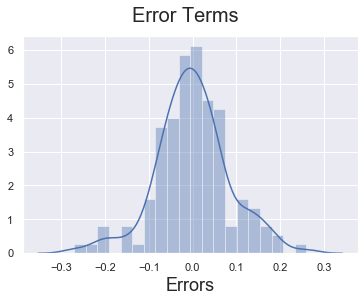

In [221]:
fig = plt.figure()
sns.distplot((y_train - y_train_price), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)
plt.xlabel('Errors', fontsize = 18)

###### The error terms look normally distributed with mean almost 0

### Making Predictions (RFE)

###### Apply MinMax Scaling on Test Data

In [224]:
num_vars = ['Price', 'Symboling', 'Wheel_Base', 'Car_Length', 'Car_Width','Car_Height', 'Curb_Weight', 'Engine_Size', 'Bore_Ratio', 'Strokes', 'Horse_Power', 'Peak_RPM', 'Mileage_City', 'Mileage_Highway', 'Compression_Ratio']

carprice_rfe_test[num_vars] = scaler.transform(carprice_rfe_test[num_vars])

In [225]:
carprice_rfe_test.describe()

,Price,Symboling,Fuel_Type,Aspiration,Num_Of_Doors,Engine_Location,Wheel_Base,Car_Length,Car_Width,Car_Height,Curb_Weight,Engine_Size,Bore_Ratio,Strokes,Compression_Ratio,Horse_Power,Peak_RPM,Mileage_City,Mileage_Highway,Four_Wheel_Driven,Rear Wheel Driven,Hard_Top,Hatch_Back,SEDAN,WAGON,Engine_Type_DOHCV,Engine_Type_L_Head,Engine_Type_OHC,Engine_Type_OHCF,Engine_Type_OHCV,Engine_Type_Rotor,5_Cylinder_Engine,4_Cylinder_Engine,6_Cylinder_Engine,3_Cylinder_Engine,12_Cylinder_Engine,2_Cylinder_Engine,1bbl,2BBL_Fuel_Type,4BBL_Fuel_Type,IDI_Fuel_Type,MPFI_Fuel_Type,SPDI_Fuel_Type
count,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.000000,61.0,61.000000,61.000000,61.000000,61.0,61.0,61.0,61.000000,61.000000,61.0,61.000000,61.000000,61.000000
mean,0.227255,0.540719,0.885246,0.786885,0.573770,0.983607,0.390724,0.509259,0.374960,0.466049,0.349430,0.252158,0.489593,0.664662,0.208402,0.351269,0.521489,0.377776,0.433458,0.590164,0.409836,0.049180,0.344262,0.475410,0.098361,0.0,0.032787,0.819672,0.016393,0.065574,0.0,0.032787,0.836066,0.114754,0.0,0.0,0.0,0.049180,0.245902,0.0,0.114754,0.508197,0.081967
std,0.207035,0.255084,0.321370,0.412907,0.498632,0.128037,0.207338,0.211699,0.211532,0.219461,0.233242,0.158970,0.298599,0.139560,0.268389,0.247465,0.253168,0.225214,0.218995,0.495885,0.495885,0.218039,0.479070,0.503539,0.300273,0.0,0.179556,0.387651,0.128037,0.249590,0.0,0.179556,0.373288,0.321370,0.0,0.0,0.0,0.218039,0.434194,0.0,0.321370,0.504082,0.276591
min,0.005277,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.137931,0.085247,0.000000,0.038766,0.000000,0.354157,0.000000,0.018595,0.000000,0.031291,0.029233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,0.075752,0.395161,1.000000,1.000000,0.000000,1.000000,0.224499,0.372572,0.203405,0.309070,0.164114,0.120606,0.269663,0.559652,0.106250,0.115444,0.351351,0.161669,0.242387,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
50%,0.151507,0.596774,1.000000,1.000000,1.000000,1.000000,0.368219,0.530383,0.378001,0.474504,0.303193,0.223983,0.449438,0.677078,0.125000,0.315599,0.567568,0.324641,0.394641,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,1.000000,0.000000
75%,0.328605,0.798387,1.000000,1.000000,1.000000,1.000000,0.526680,0.670852,0.476211,0.620475,0.532956,0.327360,0.764045,0.747534,0.150000,0.580320,0.729730,0.520209,0.577345,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,1.000000,0.000000
max,0.893973,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.809786,1.000000,1.000000,0.968750,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.0,1.000000,1.000000,1.000000


In [226]:
y_test = carprice_rfe_test.pop('Price')
X_test = carprice_rfe_test

###### Now let's use our model to make predictions.

In [227]:
# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [228]:
# Making predictions
y_pred = lm.predict(X_test_new)

### Model Evaluation with RFE

In [229]:
#Returns the mean squared error; we'll take a square root
np.sqrt(mean_squared_error(y_test, y_pred))

0.09526061471949829

###### Check R-Squared on the Test Set

In [230]:
r_squared = r2_score(y_test, y_pred)
r_squared

0.7847622538076573

Text(0, 0.5, 'y_pred')

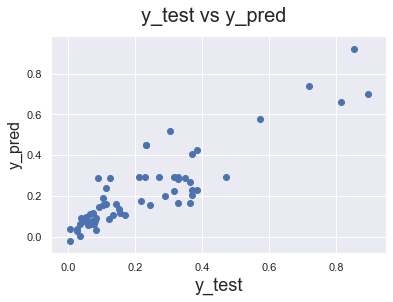

In [231]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [232]:
y_test.corr(y_pred)

0.8875464740195287

###### We will take this as the final model. The final equation of our linear model is:

###### Car Price = 0.08 +  (1.01 * Engine Size) + (0.09 *  Peak_RPM ) - (0.05 * Hatch_Back) - (0.16 * Engine_Type_OHCV) - (0.16 * 4_Cylinder_Engine)